# GUC Clustering Project

**Objective:**
The objective of this project teach students how to apply clustering to real data sets

The projects aims to teach student:
* Which clustering approach to use
* Compare between Kmeans, Hierarchal, DBScan, and Gaussian Mixtures  
* How to tune the parameters of each data approach
* What is the effect of different distance functions (optional)
* How to evaluate clustering approachs
* How to display the output
* What is the effect of normalizing the data

Students in this project will use ready-made functions from Sklearn, plotnine, numpy and pandas




In [ ]:
# if plotnine is not installed in Jupter then use the following command to install it


Running this project require the following imports

In [3]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *
# StandardScaler is a function to normalize the data
# You may also check MinMaxScaler and MaxAbsScaler
#from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

from sklearn.cluster import DBSCAN


from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

from sklearn.metrics import silhouette_score

%matplotlib inline

In [33]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

## Multi Blob Data Set
* The Data Set generated below has 6 cluster with varying number of users and varing densities
* Cluster the data set below using



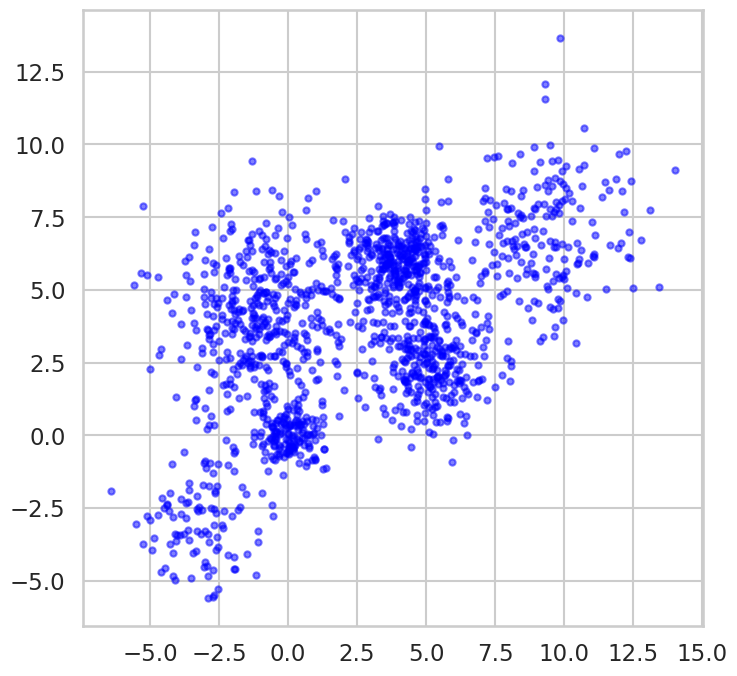

In [9]:
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data)

### Kmeans
* Use Kmeans with different values of K to cluster the above data
* Display the outcome of each value of K
* Plot distortion function versus K and choose the approriate value of k
* Plot the silhouette_score versus K and use it to choose the best K
* Store the silhouette_score for the best K for later comparison with other clustering techniques.

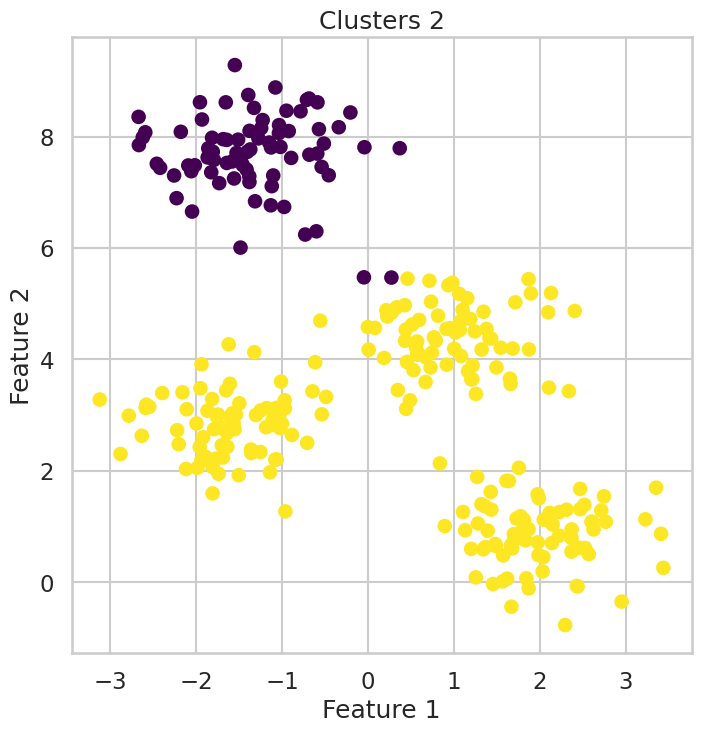

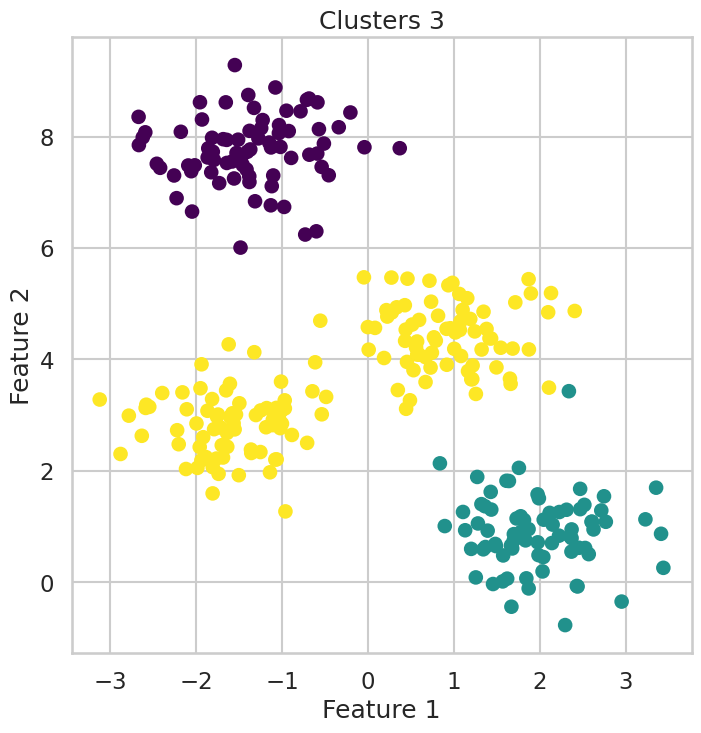

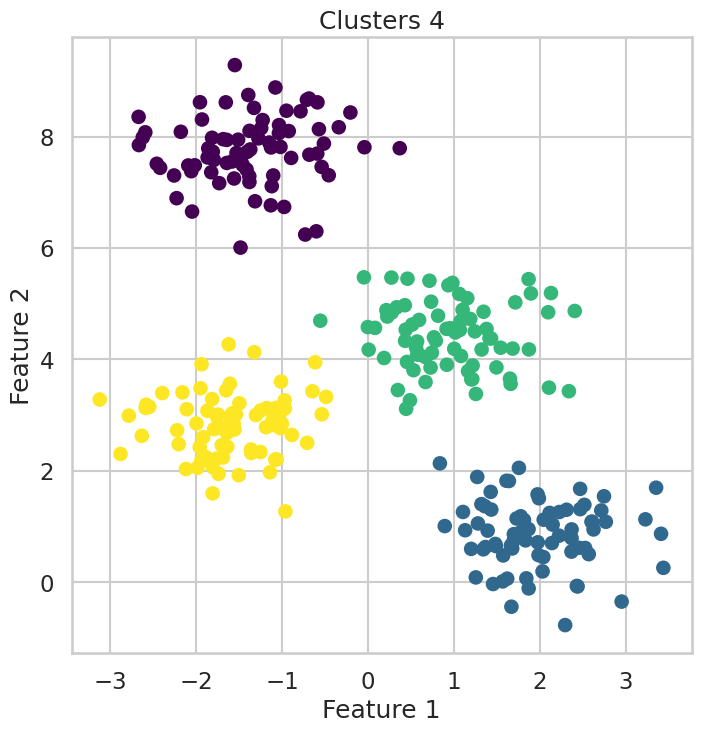

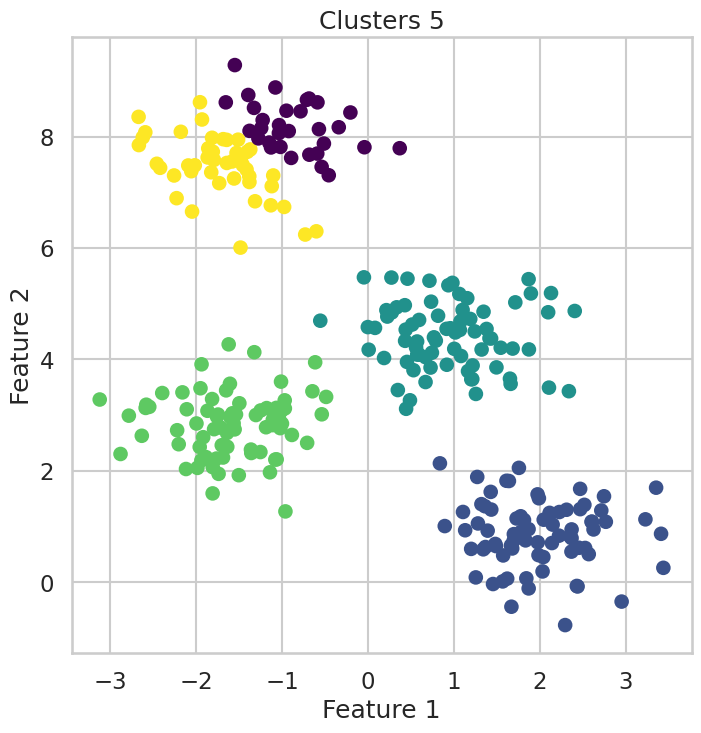

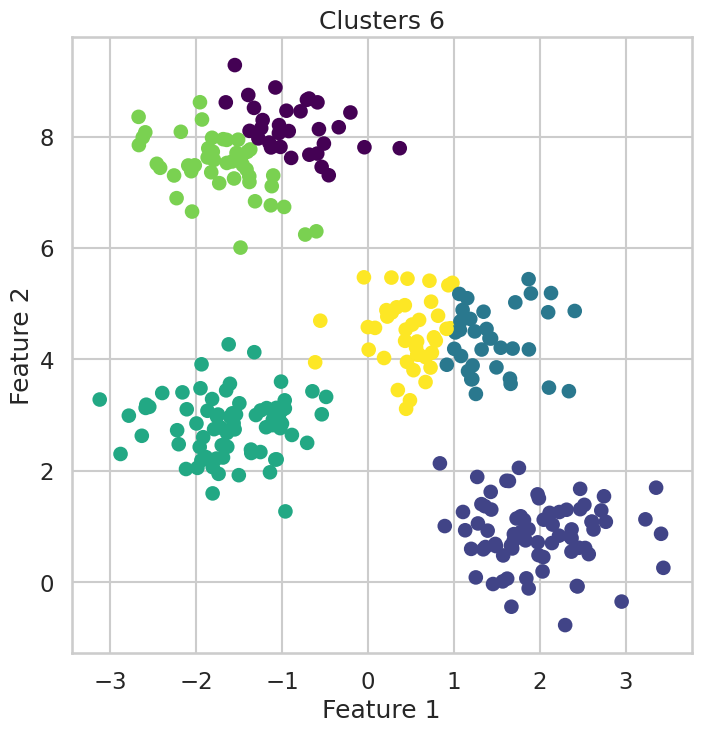

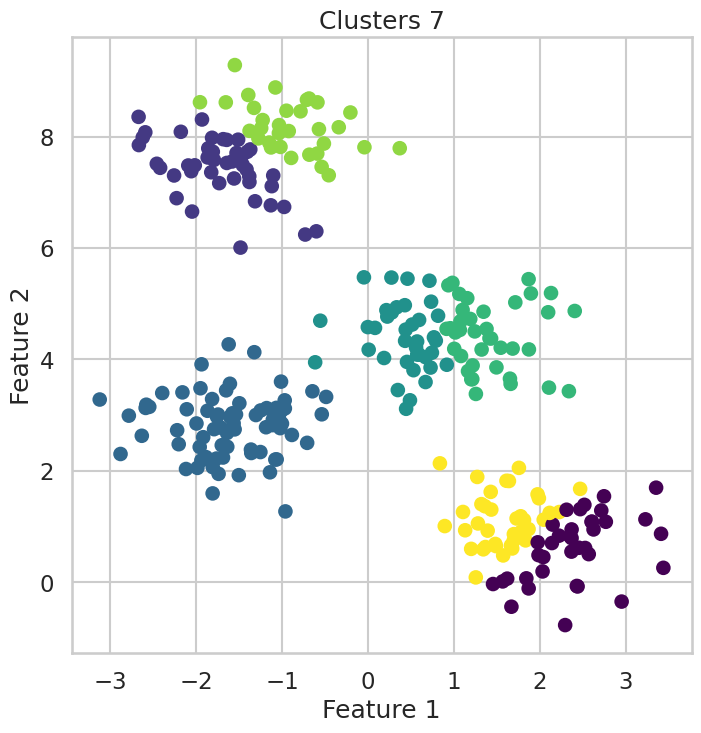

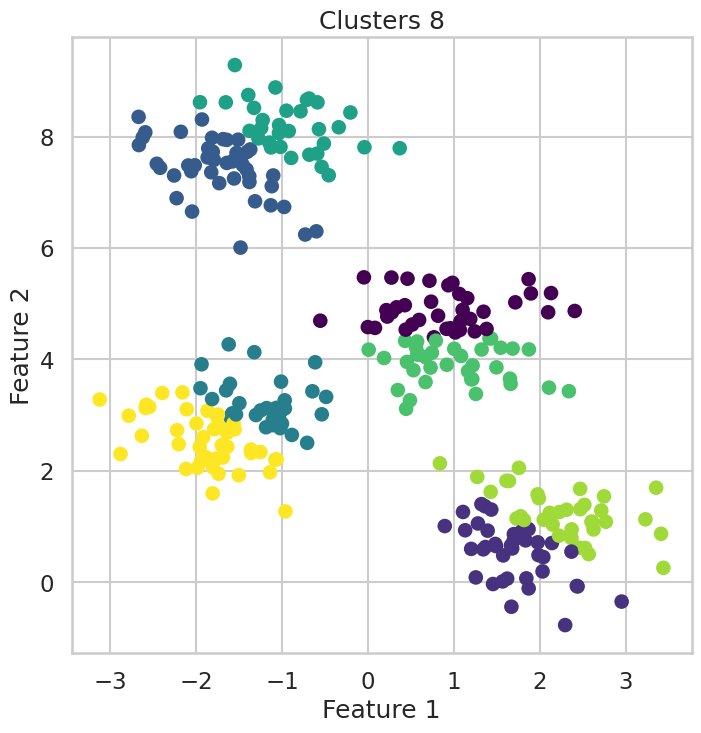

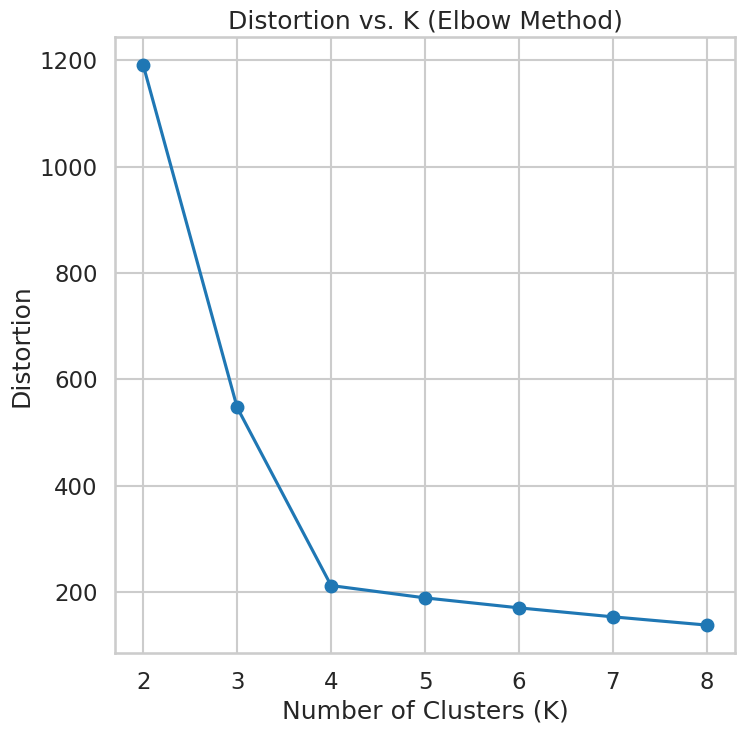

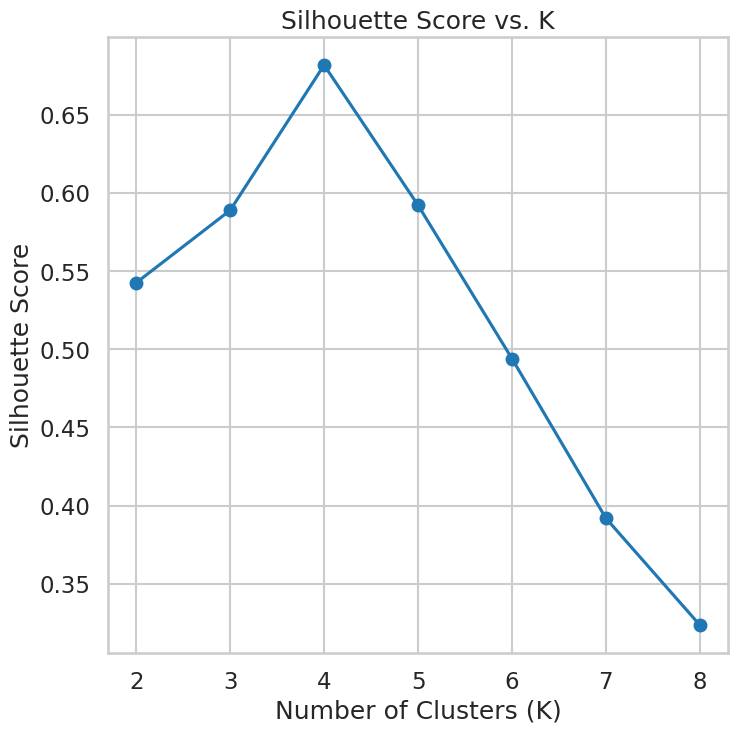

(4, 0.6819938690643478)

In [29]:
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import seaborn as sns

# Generate sample data
Multi_blob_Data, _ = make_blobs(n_samples=300, centers=4, cluster_std=0.60, random_state=0)


# Testing different values of K and displaying the outcomes
distortions = []
silhouette_scores = []
K_range = range(2, 9)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(Multi_blob_Data)
    labels = kmeans.labels_
    display_cluster(Multi_blob_Data, kmeans.labels_, k)
    distortions.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(Multi_blob_Data, labels))

# Plotting distortion function vs. K
plt.figure(figsize=(8, 8))
plt.plot(K_range, distortions, marker='o')
plt.title('Distortion vs. K (Elbow Method)')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Distortion')
plt.grid(True)
plt.show()

# Plotting silhouette score vs. K
plt.figure(figsize=(8, 8))
plt.plot(K_range, silhouette_scores, marker='o')
plt.title('Silhouette Score vs. K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()

# Choosing the best K based on the silhouette score
best_k = K_range[silhouette_scores.index(max(silhouette_scores))]
best_silhouette_score = max(silhouette_scores)

best_k, best_silhouette_score


### Hierarchal Clustering
* Use AgglomerativeClustering function to  to cluster the above data
* In the  AgglomerativeClustering change the following parameters
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage( use average and single )
    * Distance_threshold (try different)
* For each of these trials plot the Dendograph , calculate the silhouette_score and display the resulting clusters  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques.
* Record your observation

In [11]:
from scipy.cluster.hierarchy import dendrogram, linkage

# Function to plot dendrogram
def plot_dendrogram(model, **kwargs):
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_, counts]).astype(float)
    dendrogram(linkage_matrix, **kwargs)


Affinity: euclidean, Linkage: average, Distance threshold: 1, Silhouette Score: 0.32384977908646284


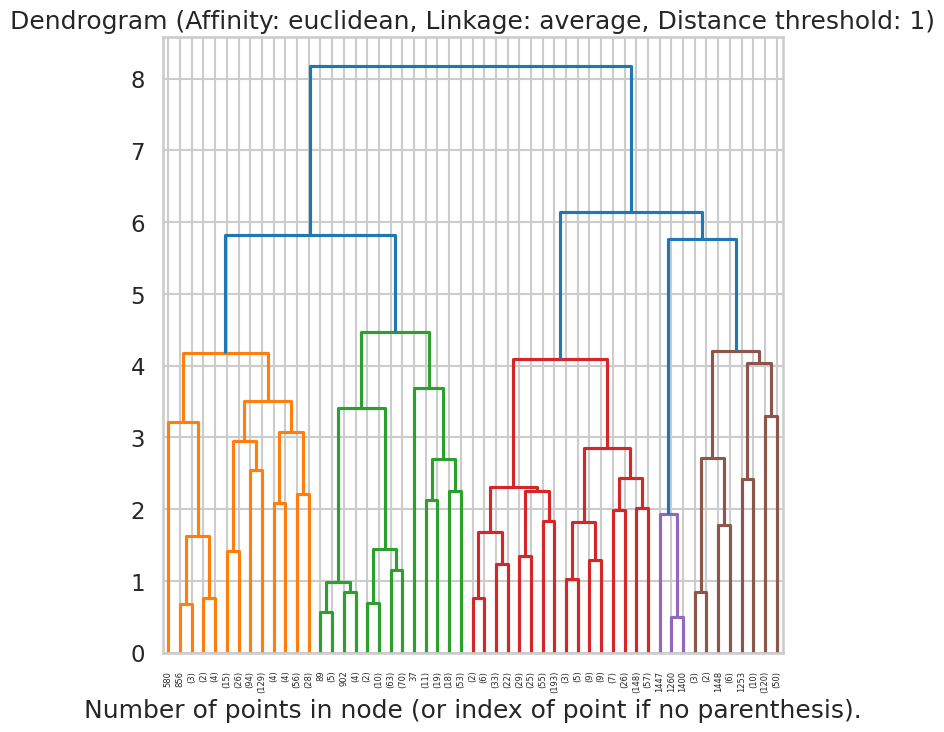

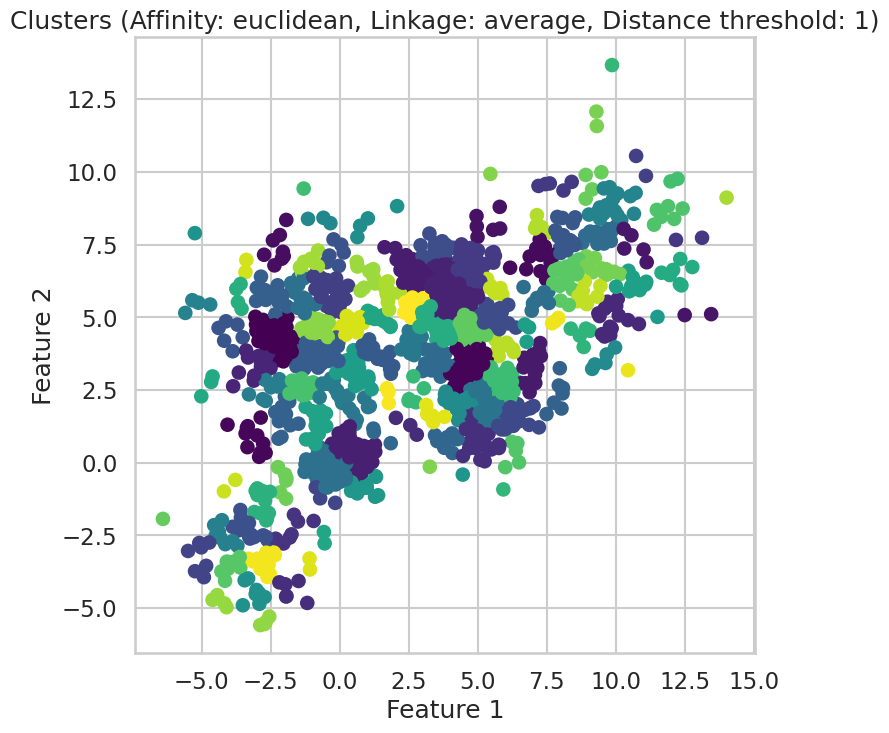

Affinity: euclidean, Linkage: average, Distance threshold: 3, Silhouette Score: 0.35500586075131524


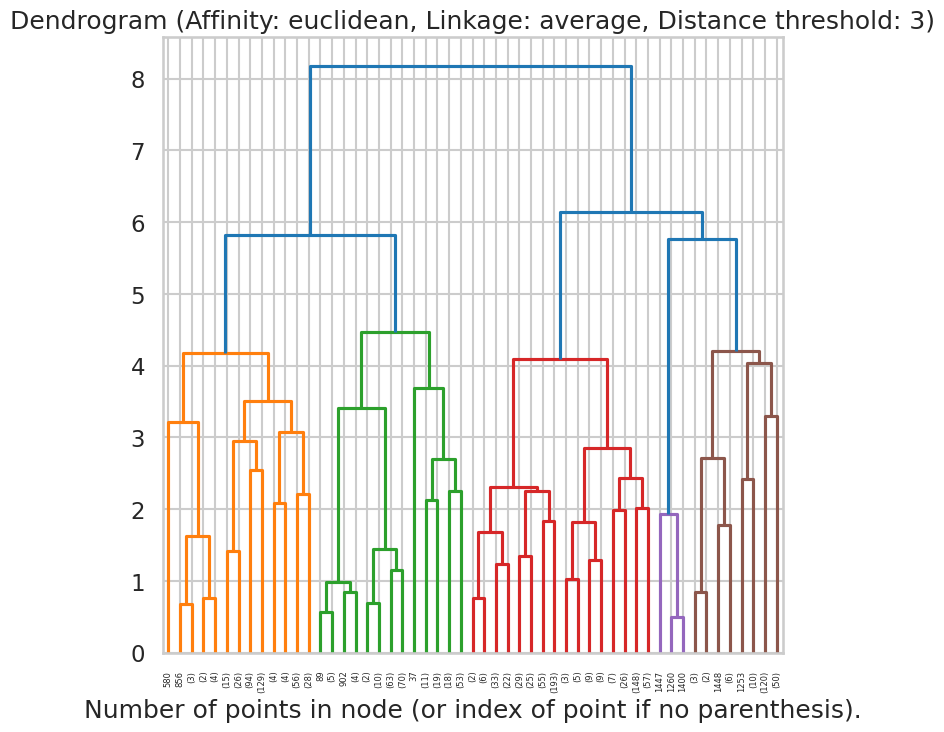

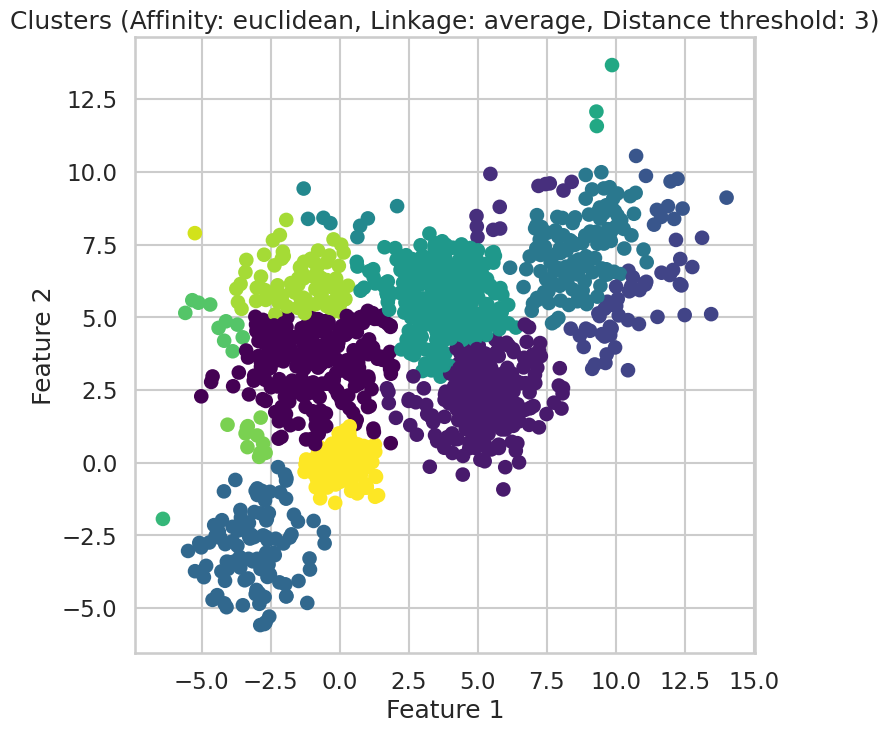

Affinity: euclidean, Linkage: average, Distance threshold: 5, Silhouette Score: 0.433187948807373


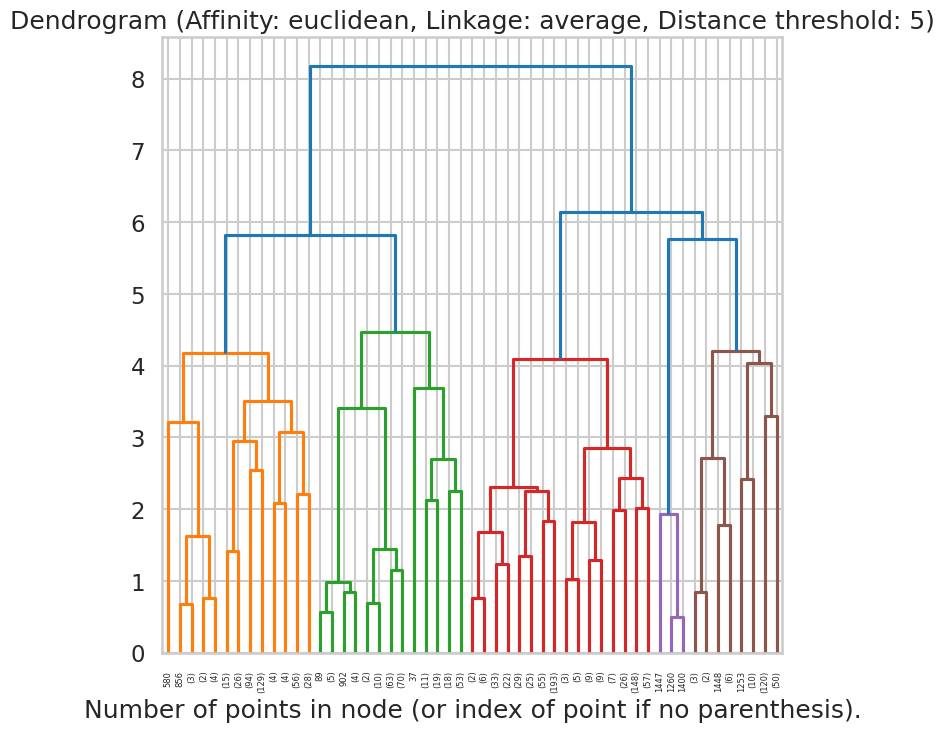

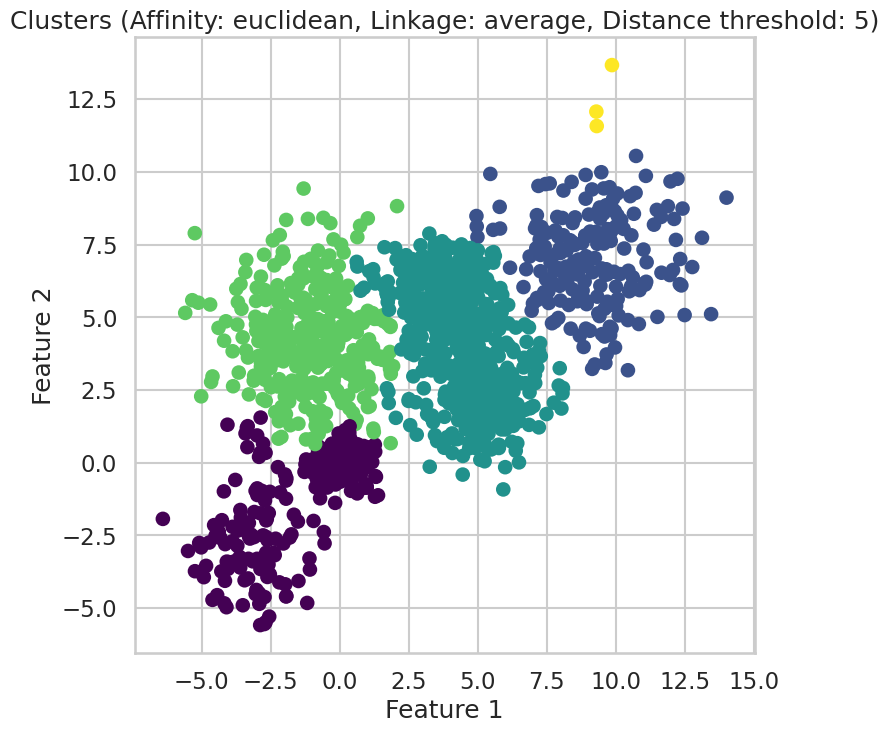

Affinity: euclidean, Linkage: single, Distance threshold: 1, Silhouette Score: -0.14944154607335855


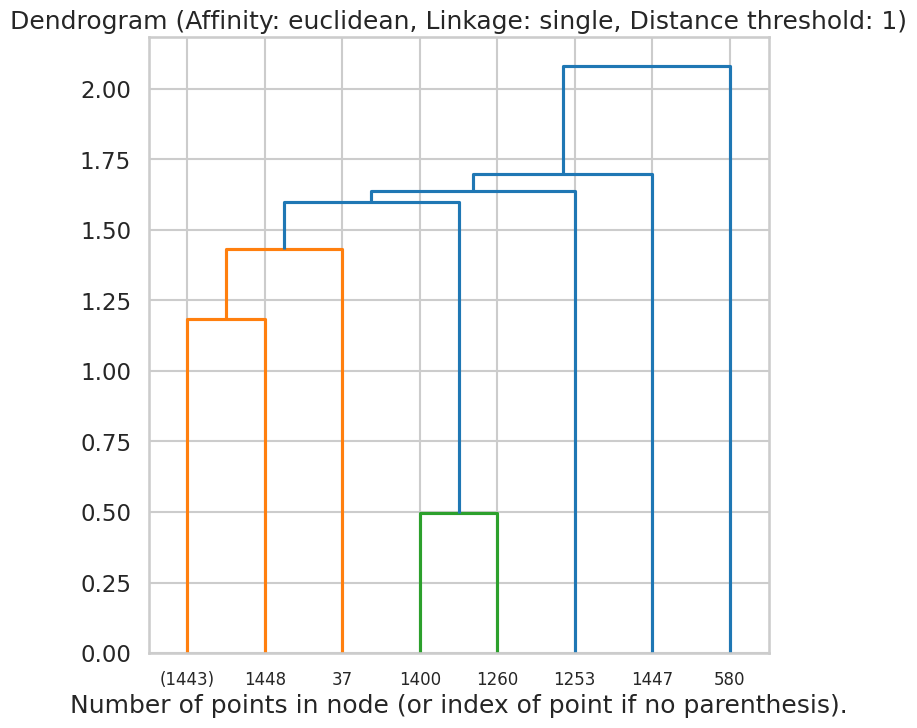

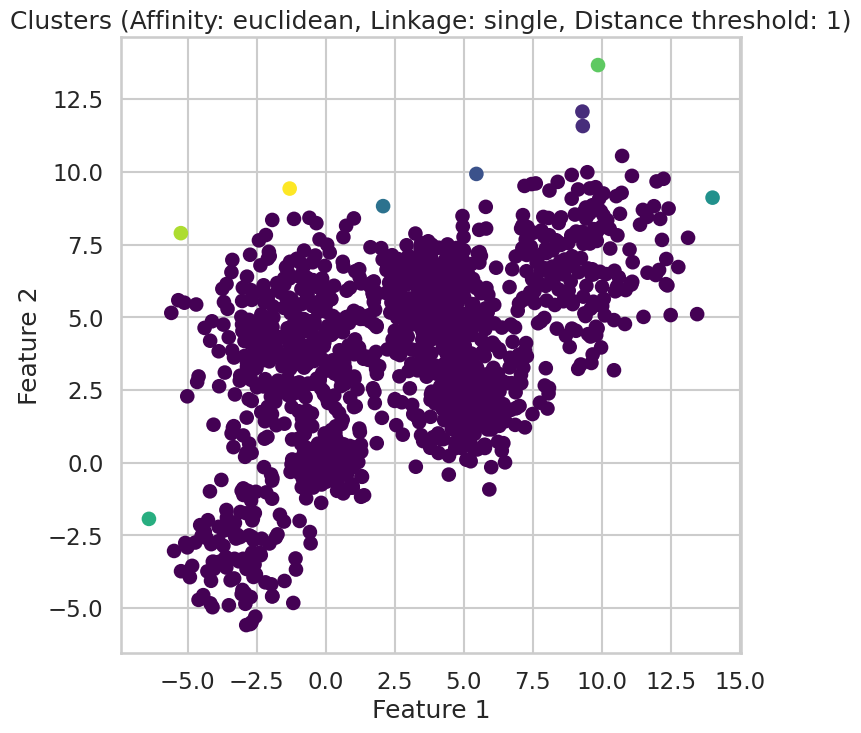

Invalid configuration for Affinity: euclidean, Linkage: single, Distance threshold: 3
Invalid configuration for Affinity: euclidean, Linkage: single, Distance threshold: 5
Affinity: manhattan, Linkage: average, Distance threshold: 1, Silhouette Score: 0.34093328073765305


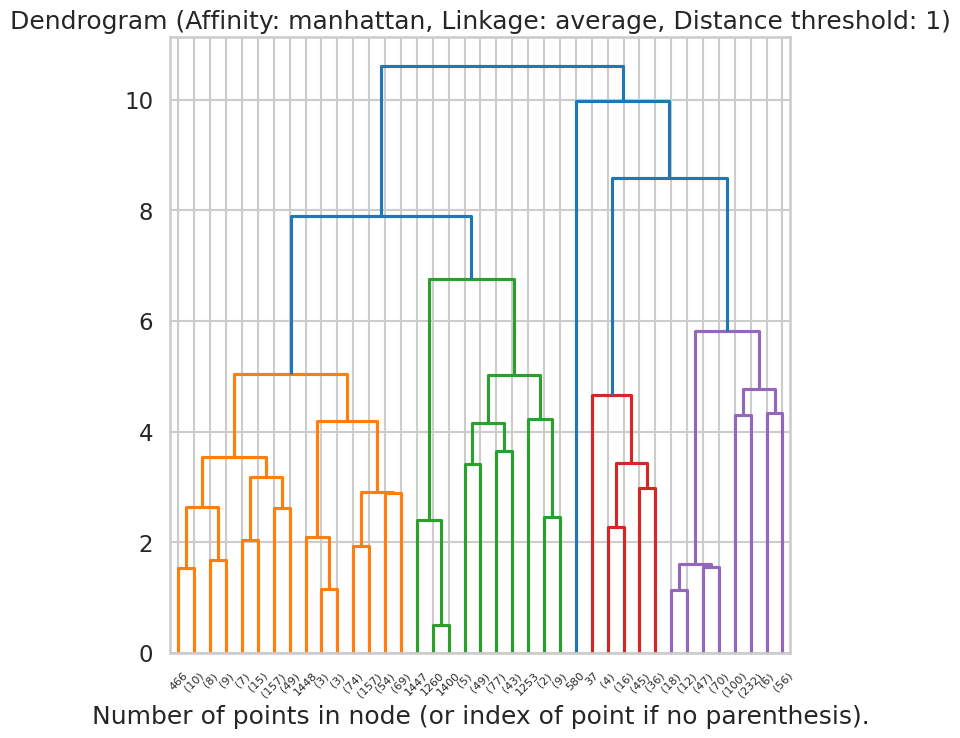

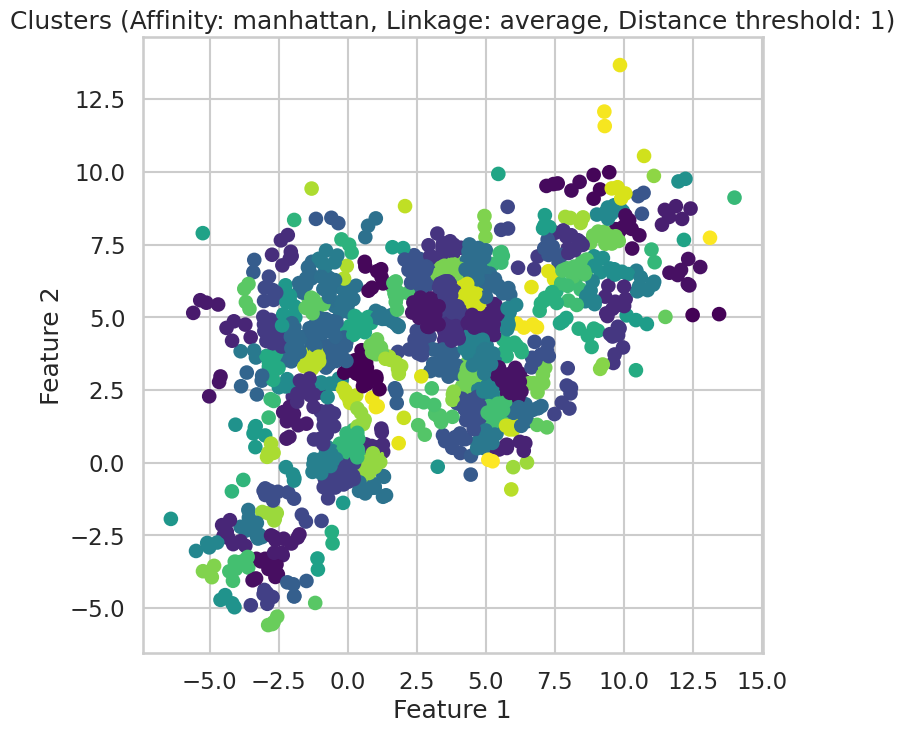

Affinity: manhattan, Linkage: average, Distance threshold: 3, Silhouette Score: 0.2962118593103159


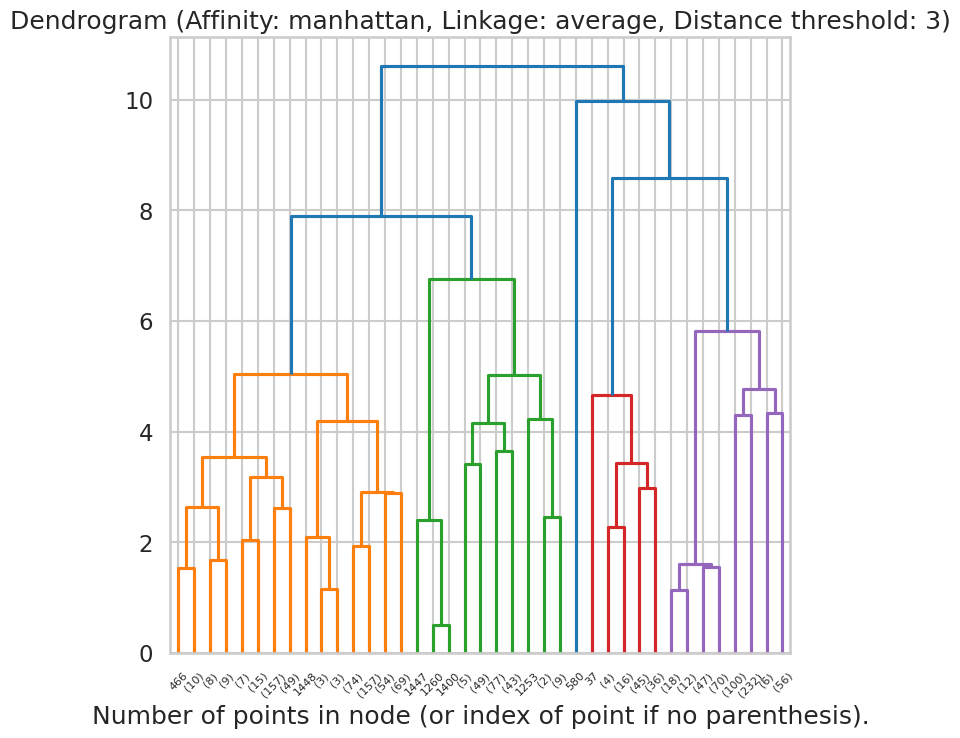

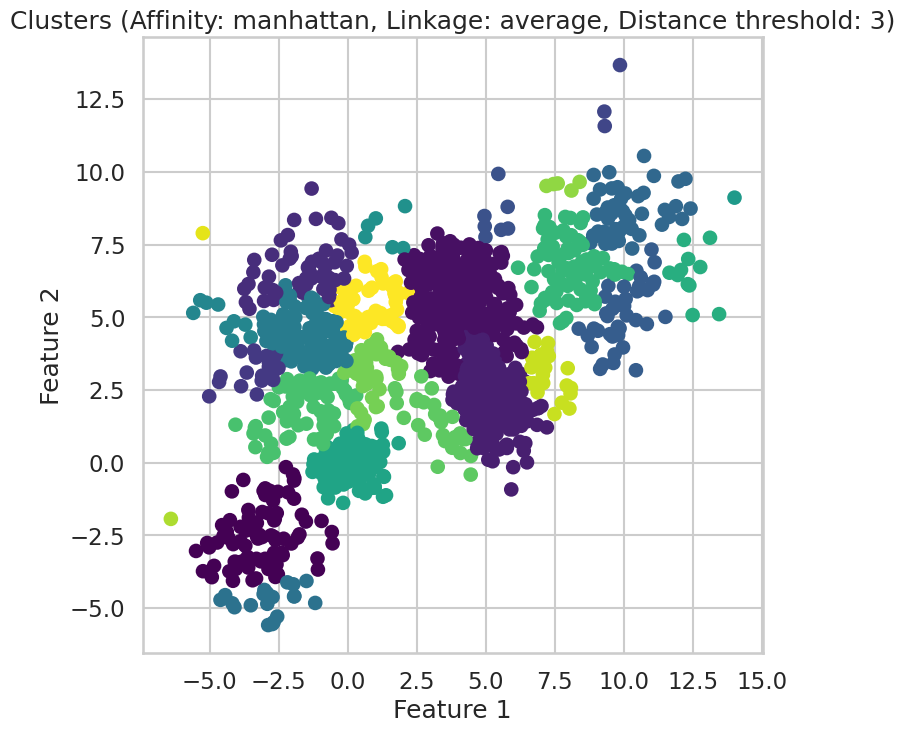

Affinity: manhattan, Linkage: average, Distance threshold: 5, Silhouette Score: 0.399558543983381


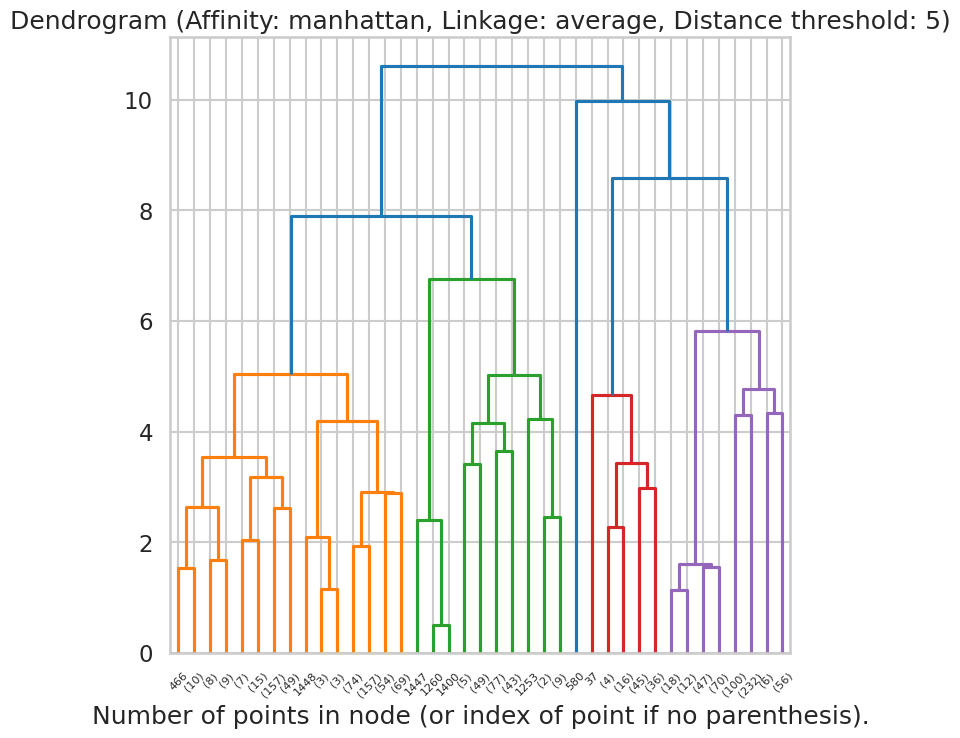

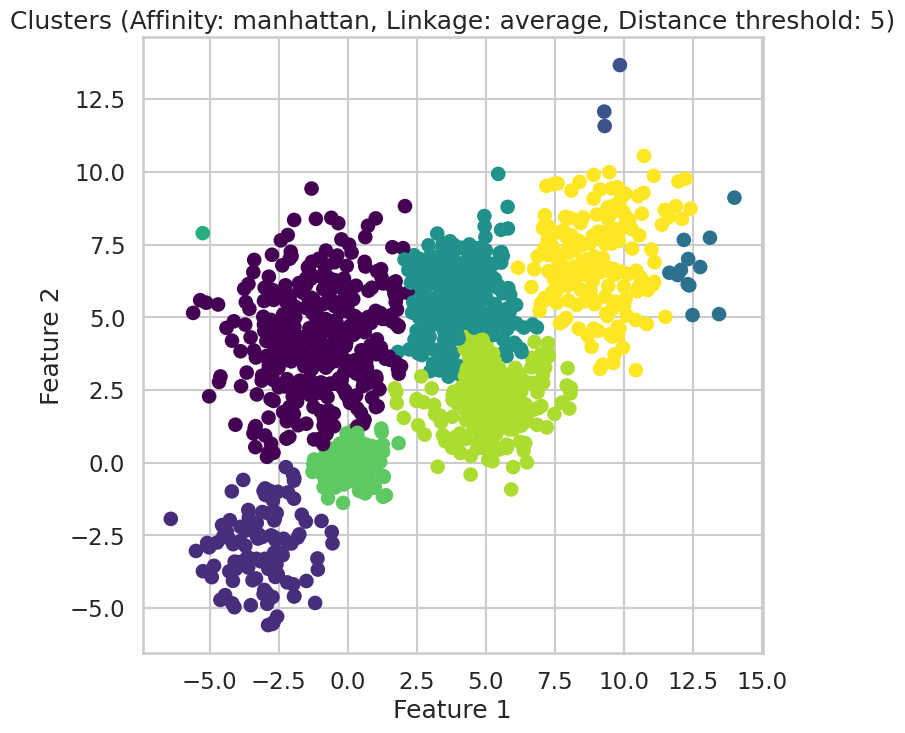

Affinity: manhattan, Linkage: single, Distance threshold: 1, Silhouette Score: -0.4080040507331309


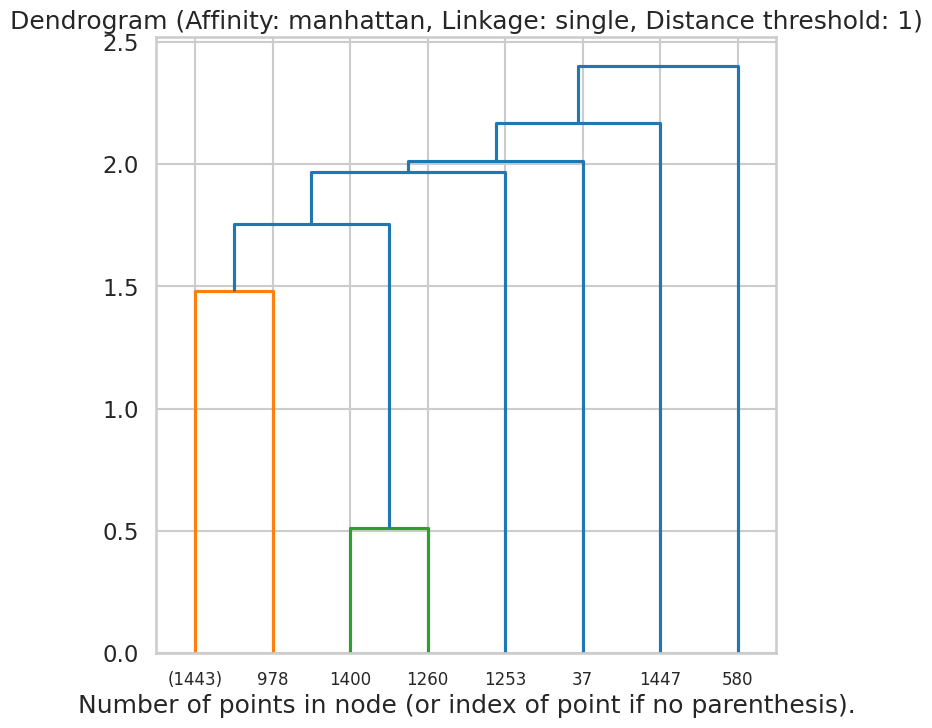

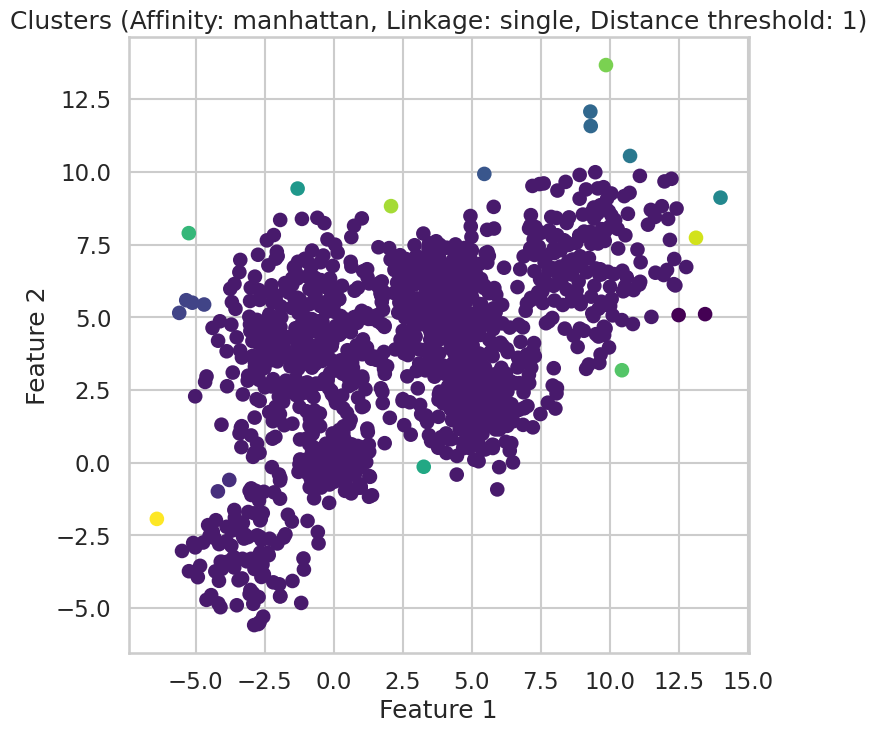

Invalid configuration for Affinity: manhattan, Linkage: single, Distance threshold: 3
Invalid configuration for Affinity: manhattan, Linkage: single, Distance threshold: 5
Affinity: cosine, Linkage: average, Distance threshold: 1, Silhouette Score: 0.35251834131557364


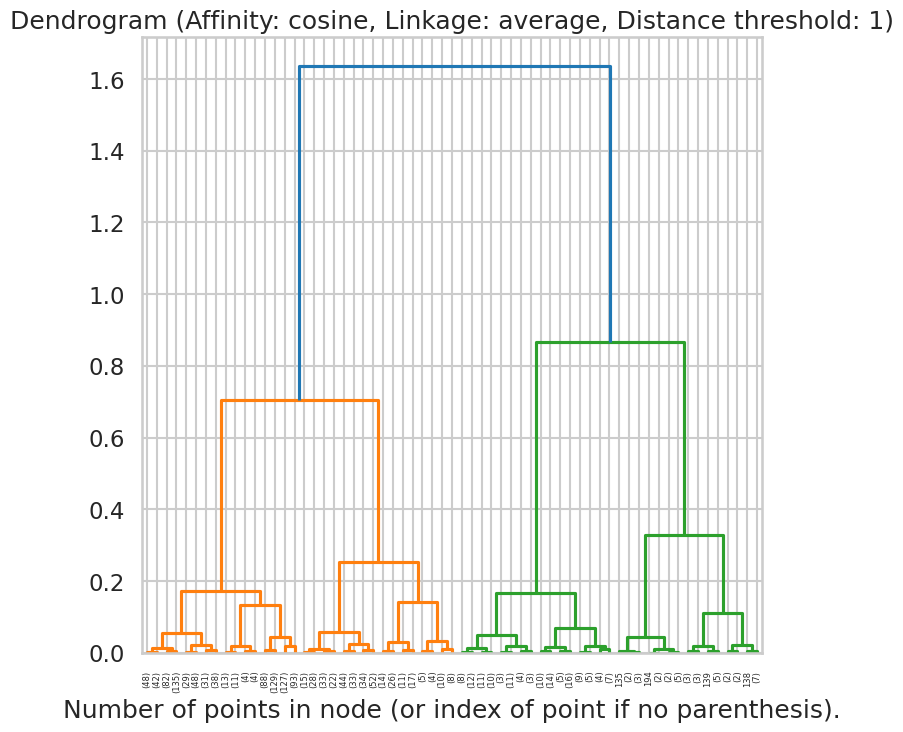

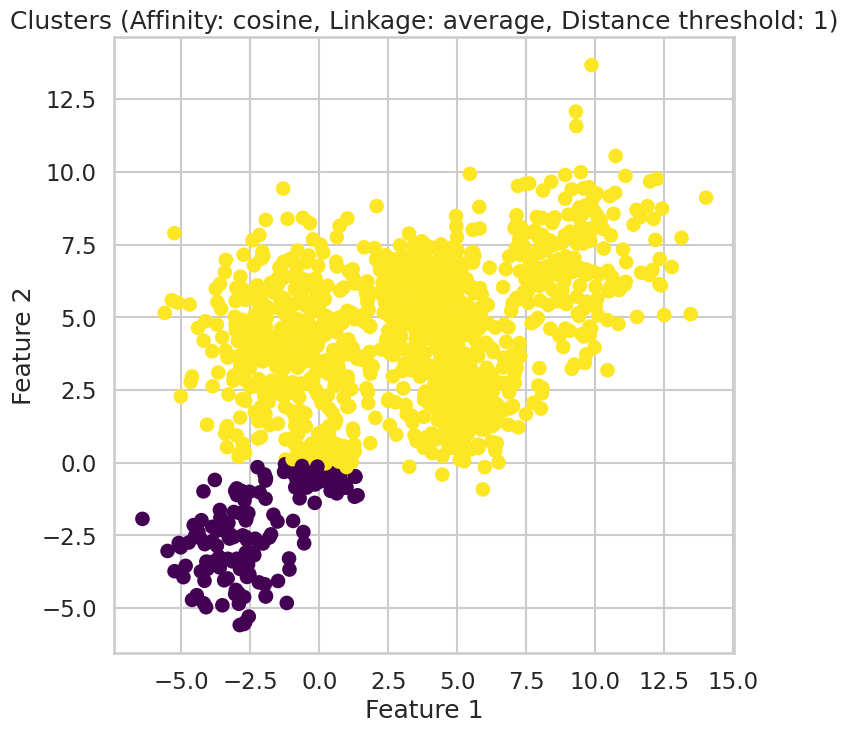

Invalid configuration for Affinity: cosine, Linkage: average, Distance threshold: 3
Invalid configuration for Affinity: cosine, Linkage: average, Distance threshold: 5
Invalid configuration for Affinity: cosine, Linkage: single, Distance threshold: 1
Invalid configuration for Affinity: cosine, Linkage: single, Distance threshold: 3
Invalid configuration for Affinity: cosine, Linkage: single, Distance threshold: 5
Best Silhouette Score: 0.433187948807373
Best Parameters: Affinity: euclidean, Linkage: average, Distance threshold: 5


In [76]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram

def hierarchical_clustering_analysis(data):
    # Function to plot dendrogram
    def plot_dendrogram(model, **kwargs):
        counts = np.zeros(model.children_.shape[0])
        n_samples = len(model.labels_)
        for i, merge in enumerate(model.children_):
            current_count = 0
            for child_idx in merge:
                if child_idx < n_samples:
                    current_count += 1
                else:
                    current_count += counts[child_idx - n_samples]
            counts[i] = current_count

        linkage_matrix = np.column_stack([model.children_, model.distances_, counts]).astype(float)
        dendrogram(linkage_matrix, **kwargs)

    # Function to display clusters
    def display_cluster(data, labels, title_suffix=''):
        plt.figure(figsize=(8,8))
        plt.scatter(data[:, 0], data[:, 1], c=labels, cmap='viridis', marker='o')
        plt.title(f'Clusters {title_suffix}')
        plt.xlabel('Feature 1')
        plt.ylabel('Feature 2')
        plt.grid(True)
        plt.show()

    # Parameters to try
    affinities = ['euclidean', 'manhattan', 'cosine']
    linkages = ['average', 'single']
    distance_thresholds = [1, 3, 5]

    best_silhouette_score = -1
    best_params = None

    for affinity in affinities:
        for linkage in linkages:
            for distance_threshold in distance_thresholds:
                try:
                    model = AgglomerativeClustering(distance_threshold=distance_threshold, n_clusters=None,
                                                    affinity=affinity, linkage=linkage)
                    model.fit(data)
                    labels = model.labels_

                    # Skip configurations that result in only one cluster
                    if len(set(labels)) <= 1:
                        print(f"Invalid configuration for Affinity: {affinity}, Linkage: {linkage}, Distance threshold: {distance_threshold}")
                        continue

                    # Calculate silhouette score
                    sil_score = silhouette_score(data, labels)
                    print(f"Affinity: {affinity}, Linkage: {linkage}, Distance threshold: {distance_threshold}, Silhouette Score: {sil_score}")

                    # Update best silhouette score and parameters
                    if sil_score > best_silhouette_score:
                        best_silhouette_score = sil_score
                        best_params = (affinity, linkage, distance_threshold)

                    # Plot dendrogram
                    plt.figure()
                    plot_dendrogram(model, truncate_mode='level', p=5)
                    plt.title(f'Dendrogram (Affinity: {affinity}, Linkage: {linkage}, Distance threshold: {distance_threshold})')
                    plt.xlabel("Number of points in node (or index of point if no parenthesis).")
                    plt.show()

                    # Plot clusters
                    display_cluster(data, labels, title_suffix=f'(Affinity: {affinity}, Linkage: {linkage}, Distance threshold: {distance_threshold})')

                except Exception as e:
                    print(f"An error occurred for Affinity: {affinity}, Linkage: {linkage}, Distance threshold: {distance_threshold}. Error: {e}")

    if best_params:
        print(f"Best Silhouette Score: {best_silhouette_score}")
        print(f"Best Parameters: Affinity: {best_params[0]}, Linkage: {best_params[1]}, Distance threshold: {best_params[2]}")
    else:
        print("No valid clustering configuration was found.")


hierarchical_clustering_analysis(Multi_blob_Data)


The invalid configurations suggest that certain combinations of affinity and linkage are not appropriate for hierarchical clustering with the specified distance thresholds.

### DBScan
* Use DBScan function to  to cluster the above data
* In the  DBscan change the following parameters
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
* Plot the silhouette_score versus the variation in the EPS and the min_samples
* Plot the resulting Clusters in this case
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques.
* Record your observations and comments

eps: 0.1, min_samples: 5, Silhouette Score: -0.25068557375431166
eps: 0.1, min_samples: 6, Silhouette Score: -0.07069754106225483
eps: 0.1, min_samples: 7, Silhouette Score: -0.036843718336055
eps: 0.1, min_samples: 8, Silhouette Score: -0.07429508604051997
eps: 0.1, min_samples: 9, Silhouette Score: -0.20001773238132273
eps: 0.1, min_samples: 10, Silhouette Score: -0.20834029959793937
eps: 0.1, min_samples: 11, Silhouette Score: -0.17405267969740565
eps: 0.1, min_samples: 12, Silhouette Score: -0.19460482957814457
eps: 0.1, min_samples: 13, Silhouette Score: -0.28141419855076644
eps: 0.1, min_samples: 14, Silhouette Score: -0.29547128860725635
eps: 0.1, min_samples: 15, Silhouette Score: -0.2652302616196178
eps: 0.1, min_samples: 16, Silhouette Score: -0.2523003215001464
eps: 0.1, min_samples: 17, Silhouette Score: -0.2465126898121487
eps: 0.1, min_samples: 18, Silhouette Score: -0.2558435704111265
eps: 0.1, min_samples: 19, Silhouette Score: -0.18081827242125162
eps: 0.1, min_samples

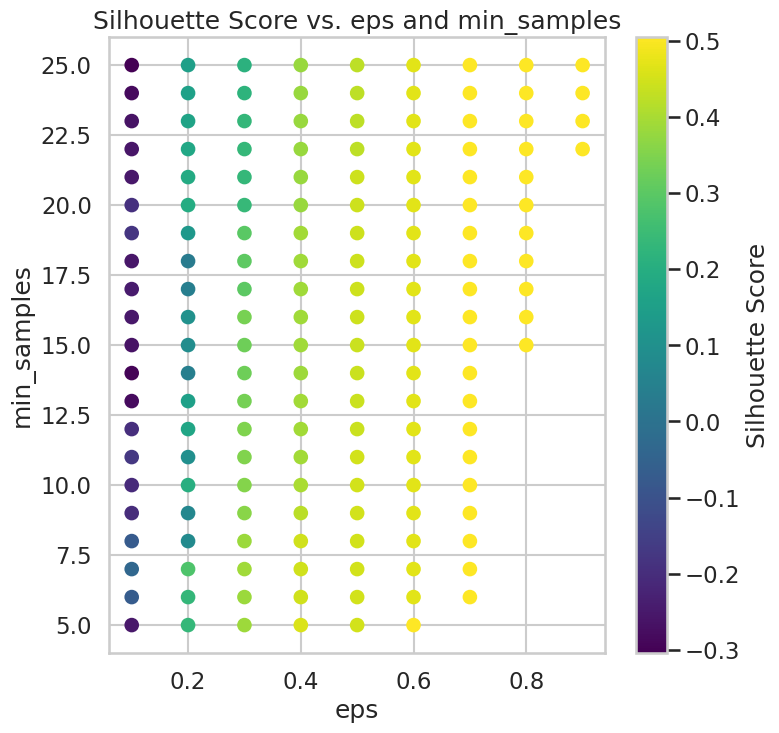

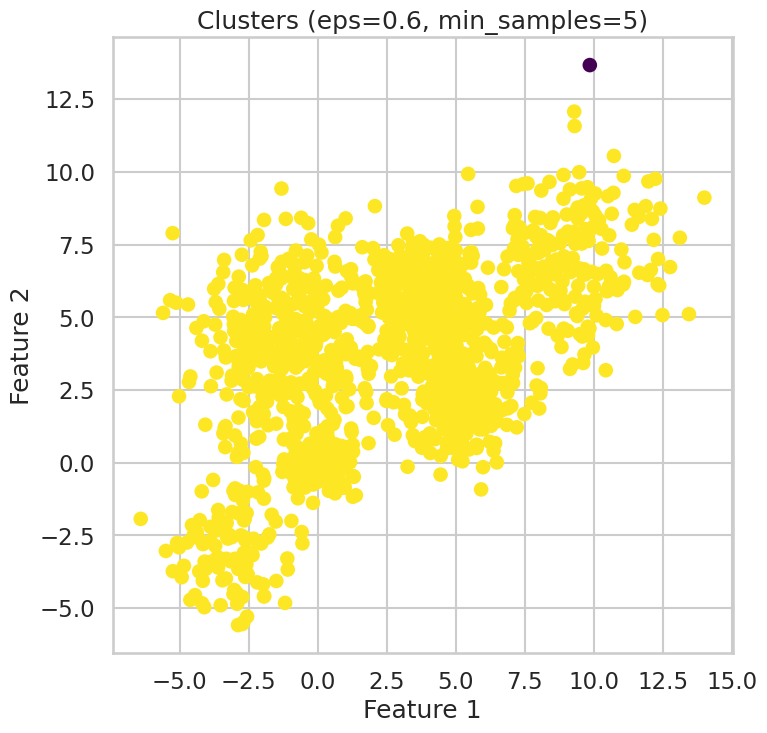

Best Silhouette Score: 0.5047268616466032
Best Parameters: eps: 0.6, min_samples: 5


In [59]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_blobs
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np
from sklearn.preprocessing import StandardScaler


def dbscan_clustering_analysis(data):
    # Normalize the data
    scaler = StandardScaler()
    data_normalized = scaler.fit_transform(data)

    # Set plot parameters
    plt.rcParams['figure.figsize'] = [15,15]
    sns.set_style("whitegrid")
    sns.set_context("talk")

    # Function to display clusters
    def display_cluster(data, labels, title_suffix=''):
        if data.shape[0] != len(labels):
            print(f"Data shape: {data.shape}, Labels length: {len(labels)}")
            raise ValueError("Mismatch between number of data points and number of labels.")
        plt.figure(figsize=(8, 8))
        plt.scatter(data[:, 0], data[:, 1], c=labels, cmap='viridis', marker='o')
        plt.title(f'Clusters {title_suffix}')
        plt.xlabel('Feature 1')
        plt.ylabel('Feature 2')
        plt.grid(True)
        plt.show()

    # Parameters to try
    eps_values = np.linspace(0.1, 3, 30)
    min_samples_values = range(5, 26)

    best_silhouette_score = -1
    best_params = None
    sil_scores = []

    for eps in eps_values:
        for min_samples in min_samples_values:
            try:
                dbscan = DBSCAN(eps=eps, min_samples=min_samples)
                labels = dbscan.fit_predict(data_normalized)

                # Skip configurations that result in only one cluster or all points in the same cluster
                if len(set(labels)) <= 1 or len(set(labels)) == len(labels):
                    continue

                # Calculate silhouette score
                sil_score = silhouette_score(data_normalized, labels)
                sil_scores.append((eps, min_samples, sil_score))

                # Update best silhouette score and parameters
                if sil_score > best_silhouette_score:
                    best_silhouette_score = sil_score
                    best_params = (eps, min_samples)

                print(f"eps: {eps}, min_samples: {min_samples}, Silhouette Score: {sil_score}")

            except Exception as e:
                print(f"An error occurred for eps: {eps}, min_samples: {min_samples}. Error: {e}")

    # Plotting silhouette scores
    if sil_scores:
        eps_values_plot = [score[0] for score in sil_scores]
        min_samples_values_plot = [score[1] for score in sil_scores]
        sil_scores_values_plot = [score[2] for score in sil_scores]

        plt.figure(figsize=(8, 8))
        plt.scatter(eps_values_plot, min_samples_values_plot, c=sil_scores_values_plot, cmap='viridis')
        plt.colorbar(label='Silhouette Score')
        plt.title('Silhouette Score vs. eps and min_samples')
        plt.xlabel('eps')
        plt.ylabel('min_samples')
        plt.show()

    # Plot the clusters for the best parameters
    if best_params:
        best_eps, best_min_samples = best_params
        dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
        best_labels = dbscan.fit_predict(data_normalized)
        display_cluster(data, best_labels, title_suffix=f'(eps={best_eps}, min_samples={best_min_samples})')
        print(f"Best Silhouette Score: {best_silhouette_score}")
        print(f"Best Parameters: eps: {best_eps}, min_samples: {best_min_samples}")
    else:
        print("No valid clustering configuration was found.")

# Example usage with generated data
n_bins = 6
centers = [(-3, -3), (0, 0), (5, 2.5), (-1, 4), (4, 6), (9, 7)]
Multi_blob_Data, y = make_blobs(n_samples=[100, 150, 300, 400, 300, 200],
                                n_features=2, cluster_std=[1.3, 0.6, 1.2, 1.7, 0.9, 1.7],
                                centers=centers, shuffle=False, random_state=42)

# Run the DBSCAN clustering analysis function
dbscan_clustering_analysis(Multi_blob_Data)


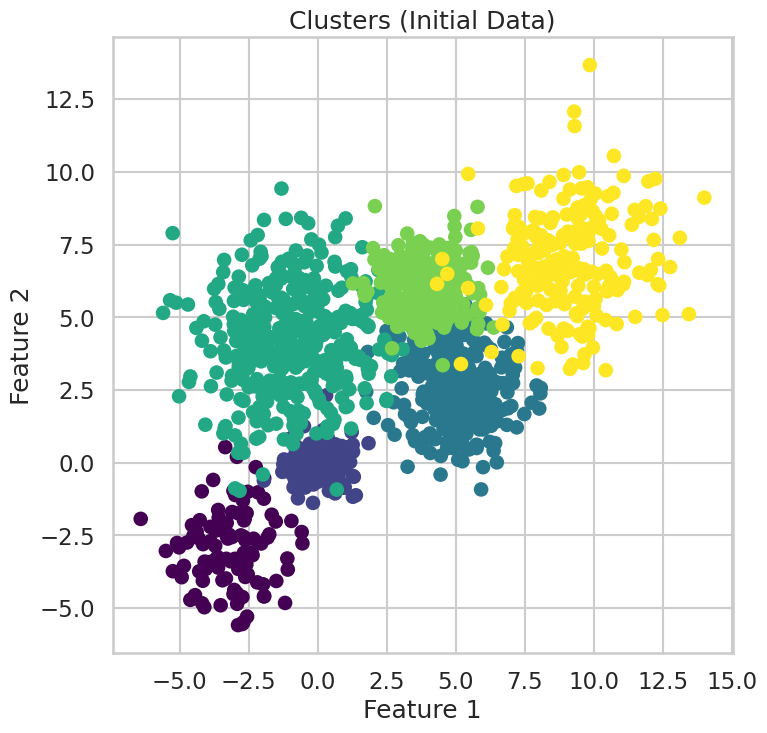

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_blobs

# Set plot parameters
plt.rcParams['figure.figsize'] = [8, 8]
sns.set_style("whitegrid")
sns.set_context("talk")

# Generate the data
n_bins = 6
centers = [(-3, -3), (0, 0), (5, 2.5), (-1, 4), (4, 6), (9, 7)]
Multi_blob_Data, y = make_blobs(n_samples=[100, 150, 300, 400, 300, 200],
                                n_features=2, cluster_std=[1.3, 0.6, 1.2, 1.7, 0.9, 1.7],
                                centers=centers, shuffle=False, random_state=42)

# Function to display clusters
def display_cluster(data, labels, title_suffix=''):
    if data.shape[0] != len(labels):
        print(f"Data shape: {data.shape}, Labels length: {len(labels)}")
        raise ValueError("Mismatch between number of data points and number of labels.")
    plt.figure(figsize=(8, 8))
    plt.scatter(data[:, 0], data[:, 1], c=labels, cmap='viridis', marker='o')
    plt.title(f'Clusters {title_suffix}')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.grid(True)
    plt.show()

# Display initial clusters
display_cluster(Multi_blob_Data, y, title_suffix='(Initial Data)')




*   Parameter Tuning: By varying eps and min_samples, we can find the configuration that yields the highest silhouette score, indicating the best-defined clusters.
*   Silhouette Score: This metric helps in evaluating the quality of the clustering. Higher scores indicate better separation between clusters.
*   Best Parameters: The best combination of eps and min_samples provides the most optimal clustering result for the dataset.
*   Visualization: Plotting the silhouette scores against eps and min_samples helps visualize how these parameters affect the clustering performance.



In [20]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np

# Parameters to try
eps_values = np.linspace(0.1, 3, 30)
min_samples_values = range(5, 26)

best_silhouette_score = -1
best_params = None

sil_scores = []

for eps in eps_values:
    for min_samples in min_samples_values:
        try:
            dbscan = DBSCAN(eps=eps, min_samples=min_samples)
            labels = dbscan.fit_predict(Multi_blob_Data)

            # Skip configurations that result in only one cluster or all points in the same cluster
            if len(set(labels)) <= 1 or len(set(labels)) == len(labels):
                continue

            # Calculate silhouette score
            sil_score = silhouette_score(Multi_blob_Data, labels)
            sil_scores.append((eps, min_samples, sil_score))

            # Update best silhouette score and parameters
            if sil_score > best_silhouette_score:
                best_silhouette_score = sil_score
                best_params = (eps, min_samples)

            print(f"eps: {eps}, min_samples: {min_samples}, Silhouette Score: {sil_score}")

        except Exception as e:
            print(f"An error occurred for eps: {eps}, min_samples: {min_samples}. Error: {e}")

print(f"Best Silhouette Score: {best_silhouette_score}")
print(f"Best Parameters: eps: {best_params[0]}, min_samples: {best_params[1]}")


eps: 0.1, min_samples: 5, Silhouette Score: -0.5423348432605972
eps: 0.1, min_samples: 6, Silhouette Score: -0.5008065260955386
eps: 0.2, min_samples: 5, Silhouette Score: -0.3999643249301035
eps: 0.2, min_samples: 6, Silhouette Score: -0.4180866874540623
eps: 0.2, min_samples: 7, Silhouette Score: -0.48893307519972995
eps: 0.2, min_samples: 8, Silhouette Score: -0.44633773926928655
eps: 0.2, min_samples: 9, Silhouette Score: -0.44848274895257567
eps: 0.2, min_samples: 10, Silhouette Score: -0.4342356562032568
eps: 0.2, min_samples: 11, Silhouette Score: -0.44713367908702734
eps: 0.2, min_samples: 12, Silhouette Score: -0.4406511275226322
eps: 0.2, min_samples: 13, Silhouette Score: -0.44353913688654695
eps: 0.2, min_samples: 14, Silhouette Score: -0.008351034682434994
eps: 0.2, min_samples: 15, Silhouette Score: -0.008351034682434994
eps: 0.2, min_samples: 16, Silhouette Score: -0.008351034682434994
eps: 0.3, min_samples: 5, Silhouette Score: -0.13789448202067064
eps: 0.3, min_samples

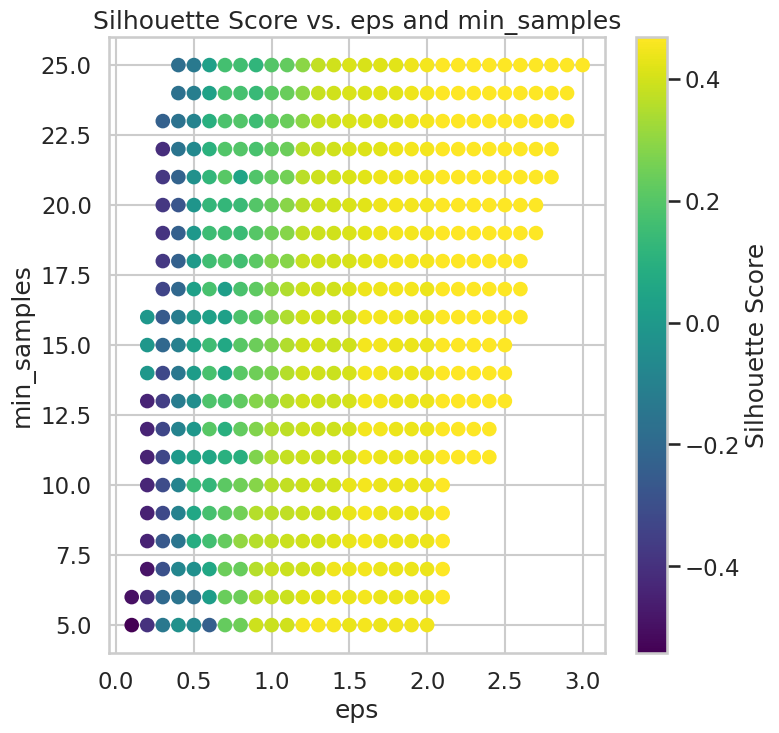

In [21]:
# Extract data for plotting
eps_values_plot = [score[0] for score in sil_scores]
min_samples_values_plot = [score[1] for score in sil_scores]
sil_scores_values_plot = [score[2] for score in sil_scores]

plt.figure(figsize=(8, 8))
plt.scatter(eps_values_plot, min_samples_values_plot, c=sil_scores_values_plot, cmap='viridis')
plt.colorbar(label='Silhouette Score')
plt.title('Silhouette Score vs. eps and min_samples')
plt.xlabel('eps')
plt.ylabel('min_samples')
plt.show()


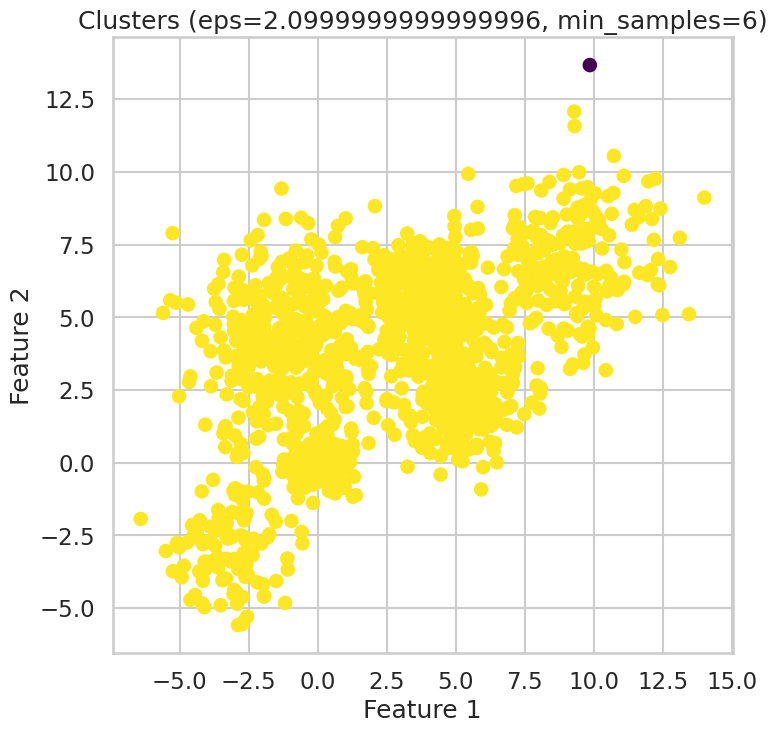

In [22]:
# Plot the clusters for the best parameters
best_eps, best_min_samples = best_params
dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
best_labels = dbscan.fit_predict(Multi_blob_Data)
display_cluster(Multi_blob_Data, best_labels, title_suffix=f'(eps={best_eps}, min_samples={best_min_samples})')


### Gaussian Mixture
* Use GaussianMixture function to cluster the above data
* In GMM change the covariance_type and check the difference in the resulting proabability fit
* Use a 2D contour plot to plot the resulting distribution (the components of the GMM) as well as the total Gaussian mixture

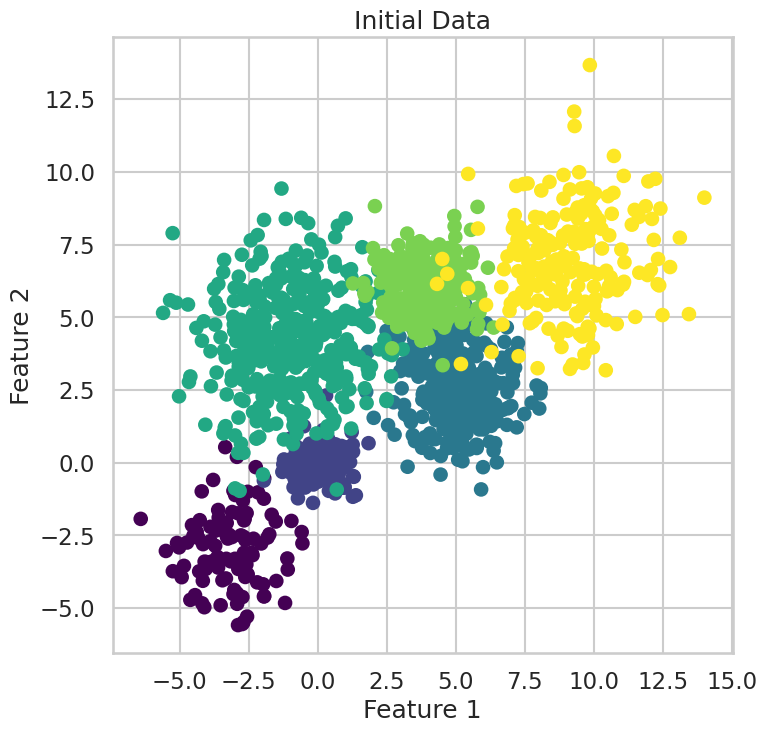

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_blobs

# Set plot parameters
plt.rcParams['figure.figsize'] = [8, 8]
sns.set_style("whitegrid")
sns.set_context("talk")

# Generate the data
n_bins = 6
centers = [(-3, -3), (0, 0), (5, 2.5), (-1, 4), (4, 6), (9, 7)]
Multi_blob_Data, y = make_blobs(n_samples=[100, 150, 300, 400, 300, 200],
                                n_features=2, cluster_std=[1.3, 0.6, 1.2, 1.7, 0.9, 1.7],
                                centers=centers, shuffle=False, random_state=42)

# Display initial data
plt.figure(figsize=(8, 8))
plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], c=y, cmap='viridis', marker='o')
plt.title('Initial Data')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.grid(True)
plt.show()


Data Generation:

The data is generated using make_blobs with specified centers and standard deviations.
GMM and Plotting:

The function plot_gmm fits a GMM to the data and plots the results, including the data points colored by the assigned labels and ellipses representing the Gaussian components.
The function draw_ellipse draws ellipses based on the position and covariance of each Gaussian component.
Covariance Types:

The code iterates over different covariance_type values (full, tied, diag, spherical) to fit GMMs with different covariance structures and plot the results.
Handling Different Covariance Types:

For full covariance type, the covariance is used directly.
For tied covariance type, a common covariance matrix is used.
For diag covariance type, a diagonal covariance matrix is created.
For spherical covariance type, a scaled identity matrix is used.

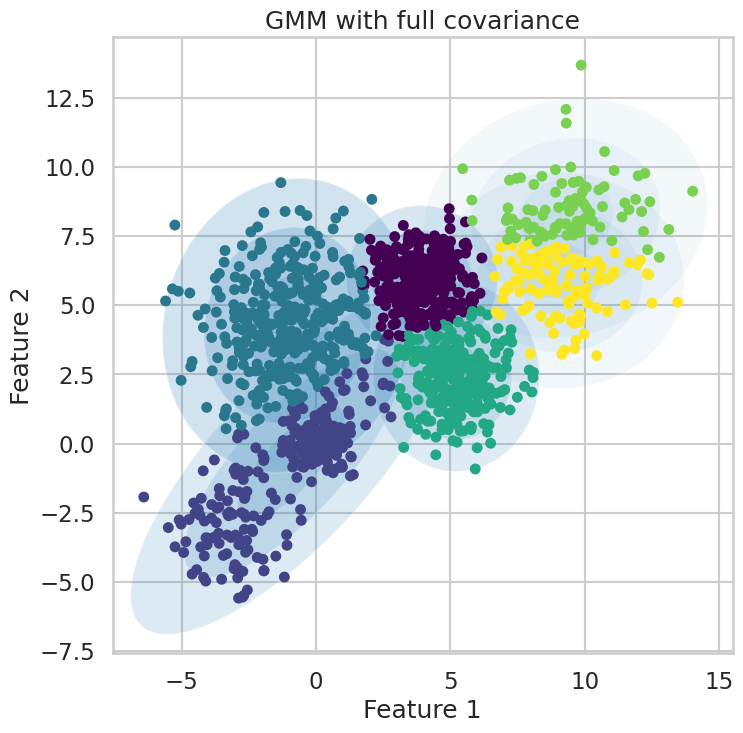

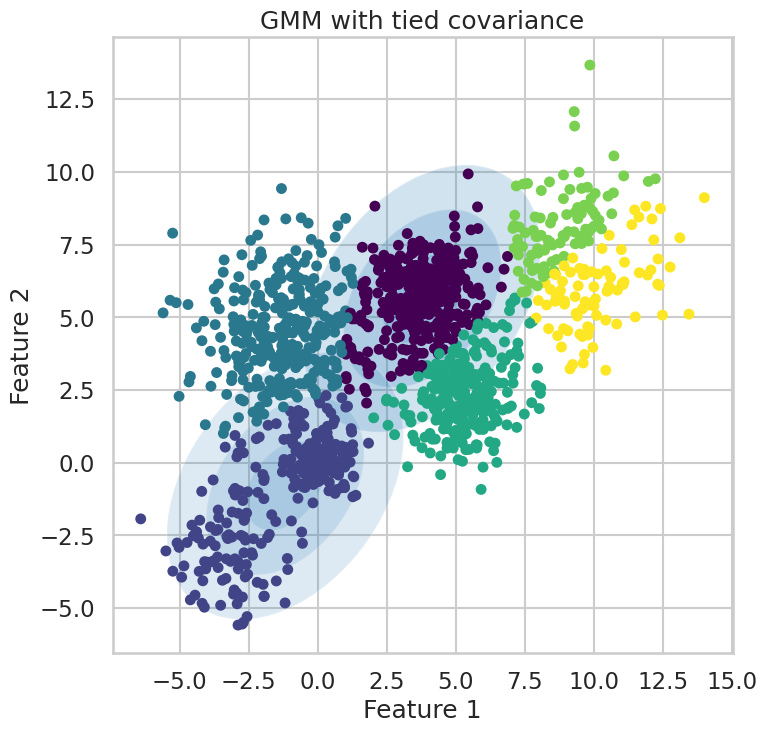

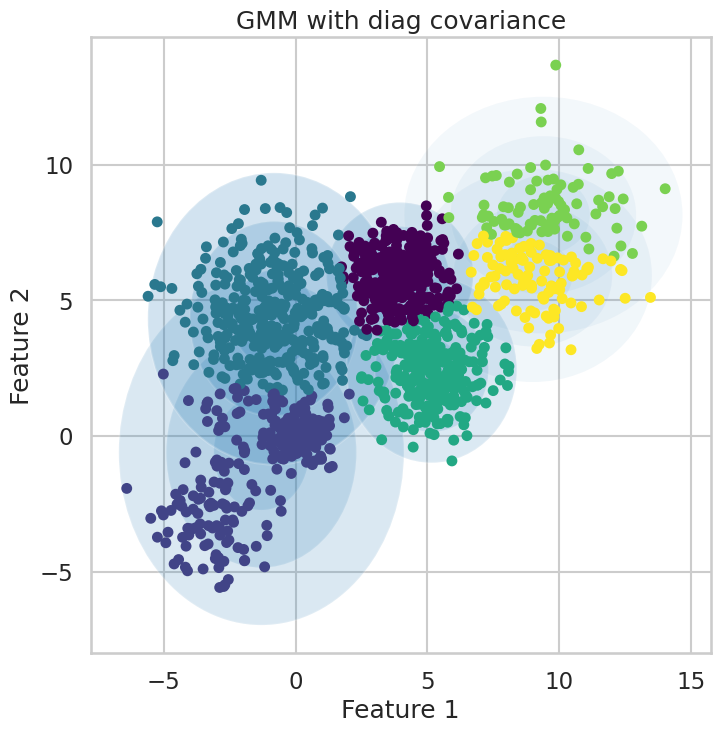

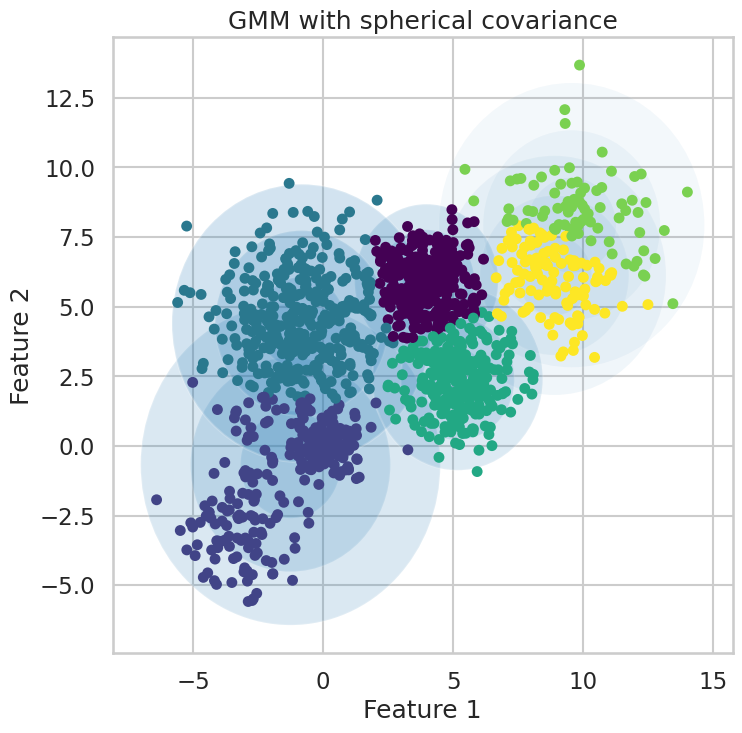

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
from matplotlib.patches import Ellipse

def plot_gmm(gmm, X, label=True, ax=None):
    if ax is None:
        ax = plt.gca()

    labels = gmm.fit_predict(X)
    if label:
        ax.scatter(X[:, 0], X[:, 1], c=labels, s=40, cmap='viridis', zorder=2)

    w_factor = 0.2 / gmm.weights_.max()
    for pos, covar, w in zip(gmm.means_, gmm.covariances_, gmm.weights_):
        if gmm.covariance_type == 'full':
            draw_ellipse(pos, covar, alpha=w * w_factor, ax=ax)
        elif gmm.covariance_type == 'tied':
            draw_ellipse(pos, gmm.covariances_, alpha=w * w_factor, ax=ax)
        elif gmm.covariance_type == 'diag':
            draw_ellipse(pos, np.diag(covar), alpha=w * w_factor, ax=ax)
        elif gmm.covariance_type == 'spherical':
            draw_ellipse(pos, np.eye(2) * covar, alpha=w * w_factor, ax=ax)

    ax.set_title(f'GMM with {gmm.covariance_type} covariance')
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')

def draw_ellipse(position, covariance, ax=None, **kwargs):
    """Draw an ellipse with a given position and covariance"""
    ax = ax or plt.gca()

    if covariance.shape == (2, 2):
        U, s, Vt = np.linalg.svd(covariance)
        angle = np.degrees(np.arctan2(U[1, 0], U[0, 0]))
        width, height = 2 * np.sqrt(s)
    else:
        angle = 0
        width, height = 2 * np.sqrt(covariance)

    for nsig in range(1, 4):
        ax.add_patch(Ellipse(position, nsig * width, nsig * height, angle, **kwargs))

def fit_and_plot_gmm(data, n_components):
    covariance_types = ['full', 'tied', 'diag', 'spherical']

    for cov_type in covariance_types:
        gmm = GaussianMixture(n_components=n_components, covariance_type=cov_type, random_state=42)
        plt.figure(figsize=(8, 8))
        plot_gmm(gmm, data)
        plt.show()

# Generate the data (example data generation)
from sklearn.datasets import make_blobs

# Set plot parameters
plt.rcParams['figure.figsize'] = [8, 8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6
centers = [(-3, -3), (0, 0), (5, 2.5), (-1, 4), (4, 6), (9, 7)]
Multi_blob_Data, y = make_blobs(n_samples=[100, 150, 300, 400, 300, 200],
                                n_features=2, cluster_std=[1.3, 0.6, 1.2, 1.7, 0.9, 1.7],
                                centers=centers, shuffle=False, random_state=42)

# Use the function
fit_and_plot_gmm(Multi_blob_Data, n_components=6)


Covariance Types: Different covariance types (full, tied, diag, spherical) allow the GMM to model the data with varying levels of flexibility.
Visualization: The contour plots and ellipses provide a visual representation of the Gaussian components and how they fit the data.
GMM: Gaussian Mixture Models are useful for clustering when the underlying data distribution is assumed to be a mixture of multiple Gaussian distributions.

## iris data set
The iris data set is test data set that is part of the Sklearn module
which contains 150 records each with 4 features. All the features are represented by real numbers

The data represents three classes


In [25]:
from sklearn.datasets import load_iris
iris_data = load_iris()
iris_data.target[[10, 25, 50]]
#array([0, 0, 1])
list(iris_data.target_names)
#['setosa', 'versicolor', 'virginica']


['setosa', 'versicolor', 'virginica']

In [26]:
print(iris_data)

{'data': array([[5.1, 3.5, 1.4, 0.2],
       [4.9, 3. , 1.4, 0.2],
       [4.7, 3.2, 1.3, 0.2],
       [4.6, 3.1, 1.5, 0.2],
       [5. , 3.6, 1.4, 0.2],
       [5.4, 3.9, 1.7, 0.4],
       [4.6, 3.4, 1.4, 0.3],
       [5. , 3.4, 1.5, 0.2],
       [4.4, 2.9, 1.4, 0.2],
       [4.9, 3.1, 1.5, 0.1],
       [5.4, 3.7, 1.5, 0.2],
       [4.8, 3.4, 1.6, 0.2],
       [4.8, 3. , 1.4, 0.1],
       [4.3, 3. , 1.1, 0.1],
       [5.8, 4. , 1.2, 0.2],
       [5.7, 4.4, 1.5, 0.4],
       [5.4, 3.9, 1.3, 0.4],
       [5.1, 3.5, 1.4, 0.3],
       [5.7, 3.8, 1.7, 0.3],
       [5.1, 3.8, 1.5, 0.3],
       [5.4, 3.4, 1.7, 0.2],
       [5.1, 3.7, 1.5, 0.4],
       [4.6, 3.6, 1. , 0.2],
       [5.1, 3.3, 1.7, 0.5],
       [4.8, 3.4, 1.9, 0.2],
       [5. , 3. , 1.6, 0.2],
       [5. , 3.4, 1.6, 0.4],
       [5.2, 3.5, 1.5, 0.2],
       [5.2, 3.4, 1.4, 0.2],
       [4.7, 3.2, 1.6, 0.2],
       [4.8, 3.1, 1.6, 0.2],
       [5.4, 3.4, 1.5, 0.4],
       [5.2, 4.1, 1.5, 0.1],
       [5.5, 4.2, 1.4, 0.2],
     

* Repeat all the above clustering approaches and steps on the above data
* Normalize the data then repeat all the above steps
* Compare between the different clustering approaches

## 1-Kmeans

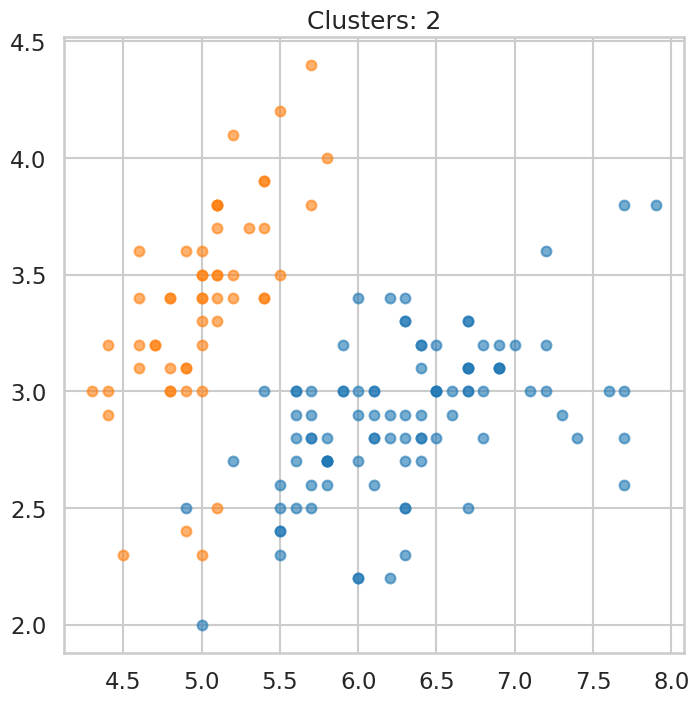

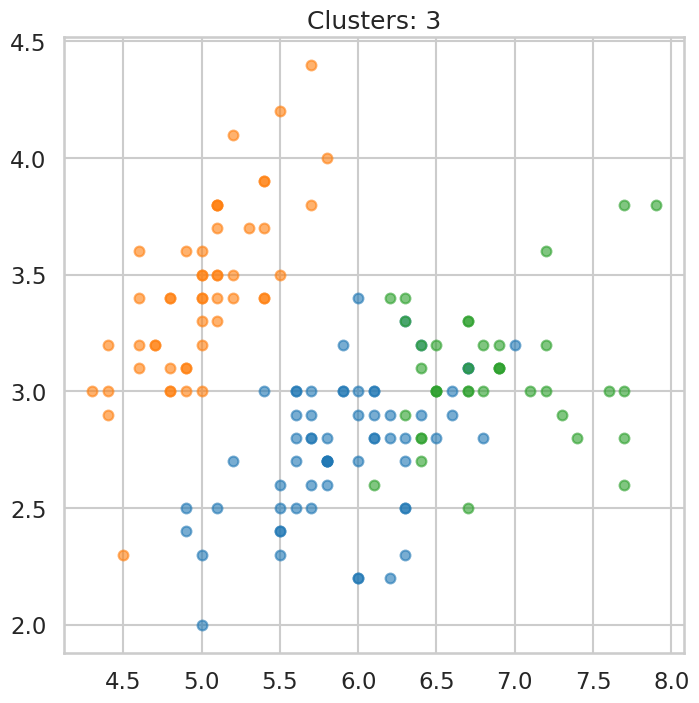

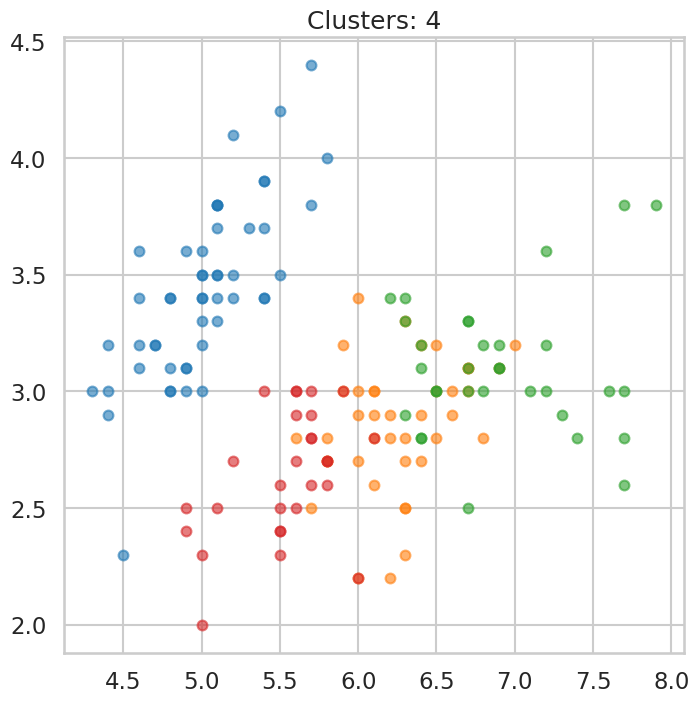

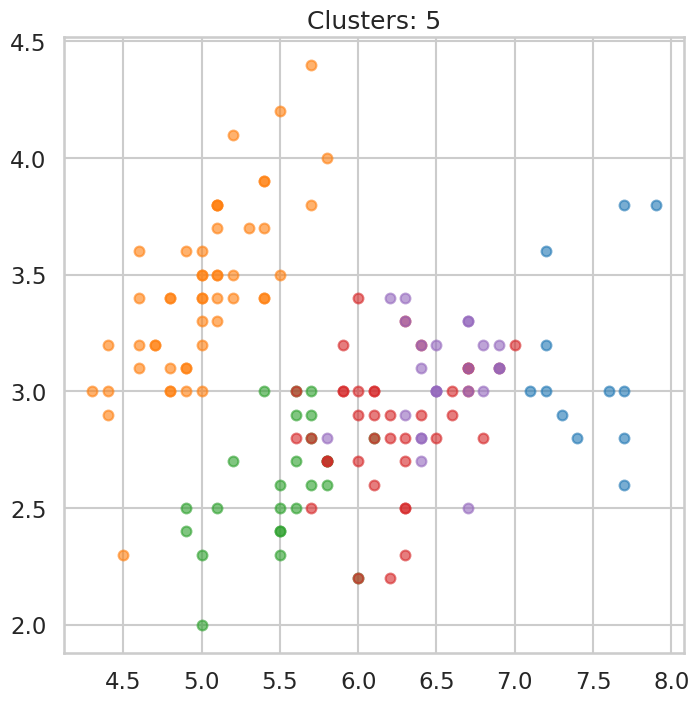

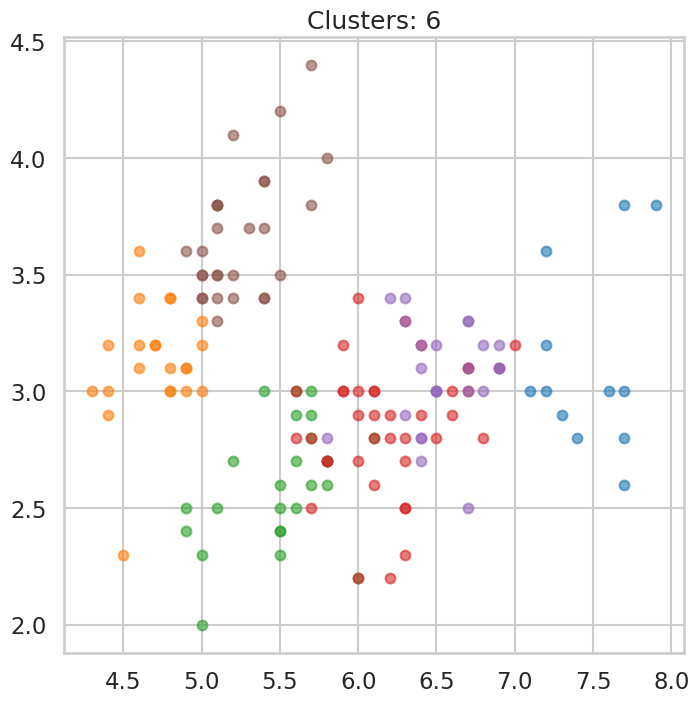

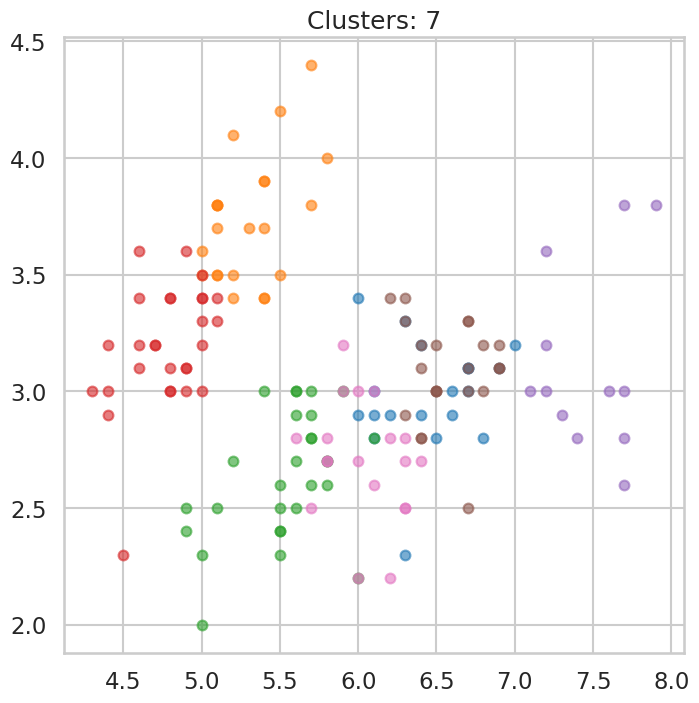

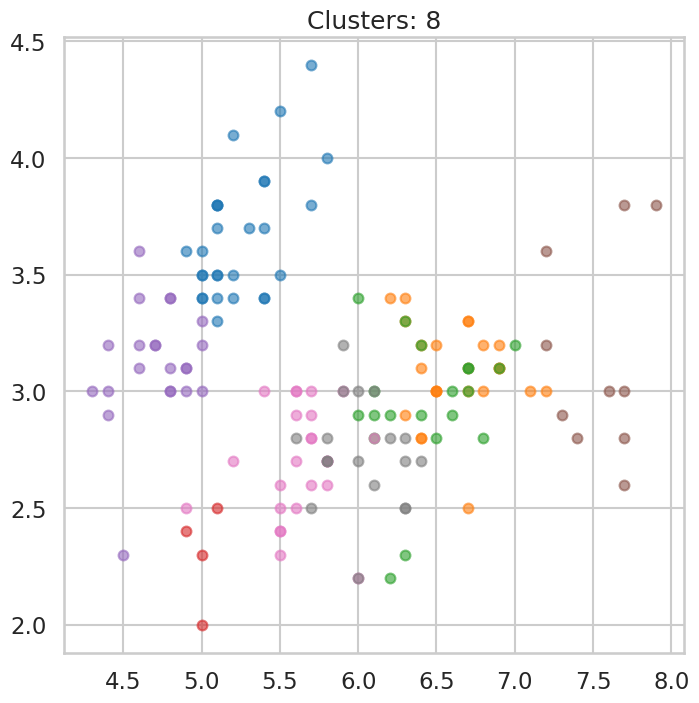

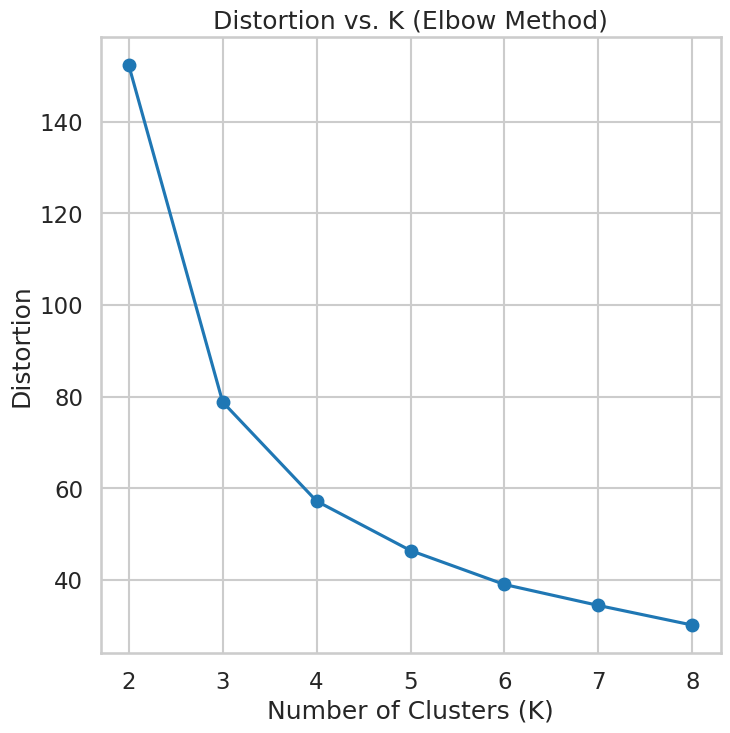

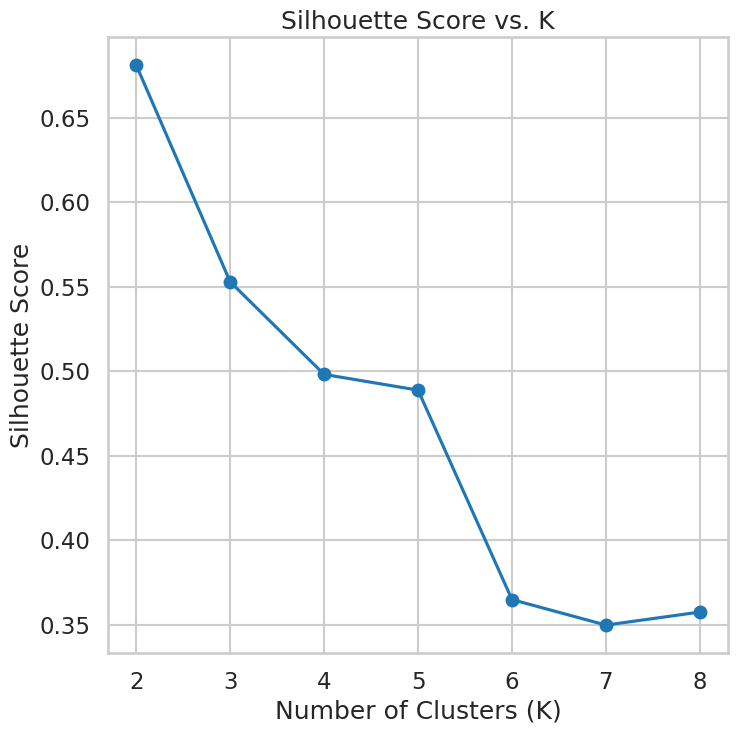

Best K: 2, Best Silhouette Score: 0.6810461692117462


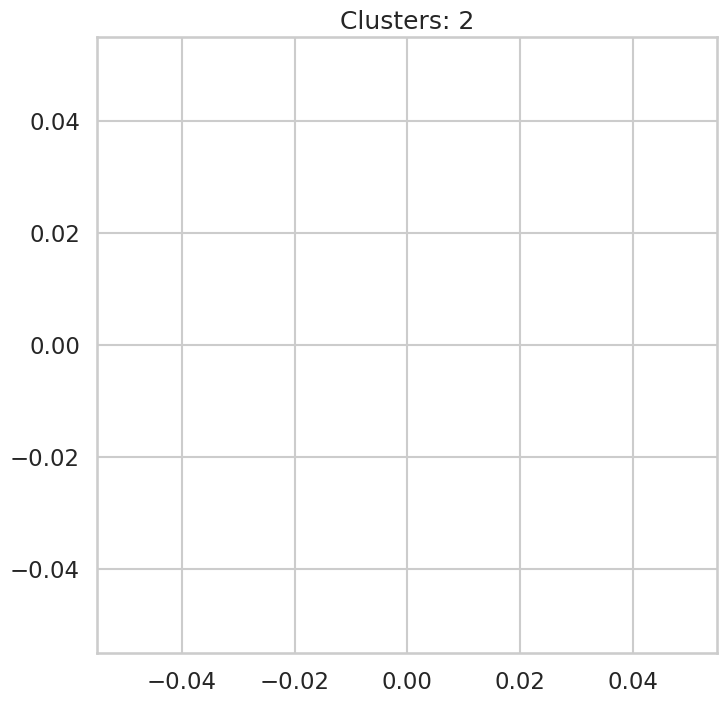

(2, 0.6810461692117462)

In [83]:
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import seaborn as sns
import numpy as np

def display_cluster(data, labels, num_clusters):
    plt.figure(figsize=(8, 8))
    color = sns.color_palette(n_colors=num_clusters)
    alpha = 0.6
    s = 50

    if isinstance(data, pd.DataFrame):
        data = data.values

    for i in range(num_clusters):
        plt.scatter(data[labels == i, 0], data[labels == i, 1], c=[color[i]], alpha=alpha, s=s)
    plt.title(f'Clusters: {num_clusters}')
    plt.show()

# Function to apply KMeans clustering and evaluate results
def KmeansFun(data, K_range=range(2, 9)):
    # Set plot parameters
    plt.rcParams['figure.figsize'] = [8, 8]
    sns.set_style("whitegrid")
    sns.set_context("talk")

    distortions = []
    silhouette_scores = []

    for k in K_range:
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(data)
        labels = kmeans.labels_
        display_cluster(data, kmeans.labels_, k)
        distortions.append(kmeans.inertia_)
        silhouette_scores.append(silhouette_score(data, labels))

    # Plotting distortion function vs. K
    plt.figure(figsize=(8, 8))
    plt.plot(K_range, distortions, marker='o')
    plt.title('Distortion vs. K (Elbow Method)')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Distortion')
    plt.grid(True)
    plt.show()

    # Plotting silhouette score vs. K
    plt.figure(figsize=(8, 8))
    plt.plot(K_range, silhouette_scores, marker='o')
    plt.title('Silhouette Score vs. K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Silhouette Score')
    plt.grid(True)
    plt.show()

    # Choosing the best K based on the silhouette score
    best_k = K_range[silhouette_scores.index(max(silhouette_scores))]
    best_silhouette_score = max(silhouette_scores)

    print(f"Best K: {best_k}, Best Silhouette Score: {best_silhouette_score}")

    # Display clustering results for the best K
    kmeans = KMeans(n_clusters=best_k, random_state=42)
    kmeans.fit(data)
    labels = kmeans.labels_
    display_cluster(data, kmeans, best_k)

    return best_k, best_silhouette_score


# Load Iris dataset
iris_data = load_iris()
iris_features = iris_data.data
KmeansFun(iris_features)


###Findings:
The silhouette score suggests
𝐾=2 as the best number of clusters, which might be due to the similarity between 'versicolor' and 'virginica'.

Analysis:
Elbow Method:

The elbow method suggests that
K=4 might be the best number of clusters because the reduction in distortion slows down after
K=4.
Silhouette Score:

The silhouette score suggests
K=2 as the best number of clusters, indicating that two clusters are more distinctly separated compared to more clusters.
Both methods provide different perspectives on the clustering quality. The elbow method focuses on minimizing within-cluster variance, while the silhouette score measures how similar an object is to its own cluster compared to other clusters.

More Analysis

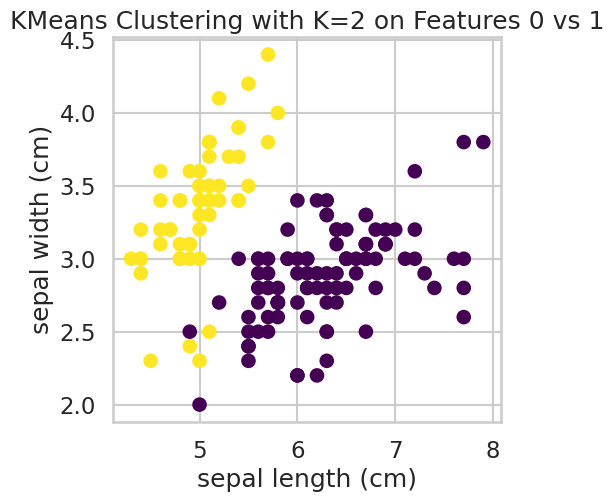

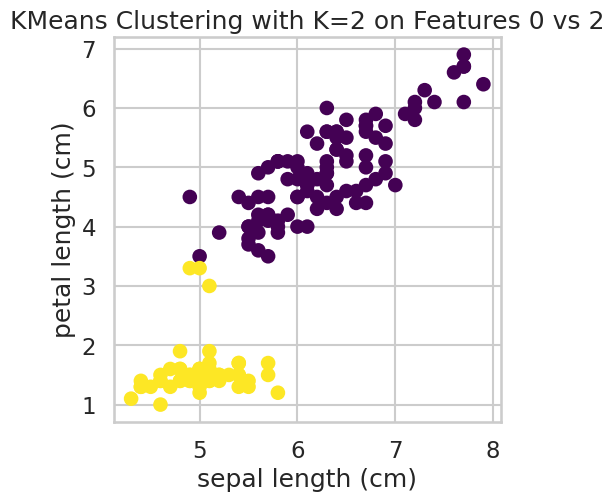

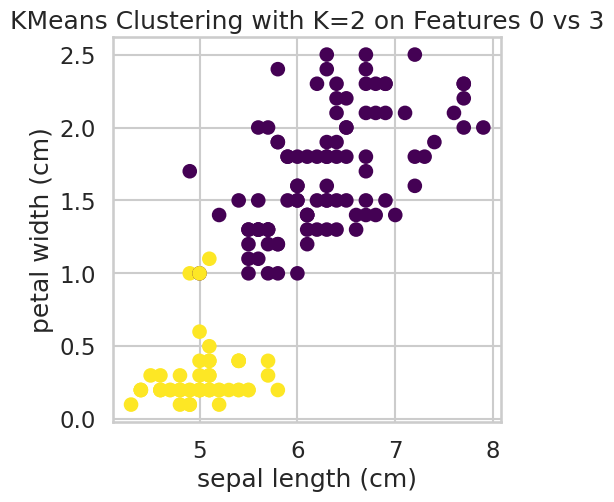

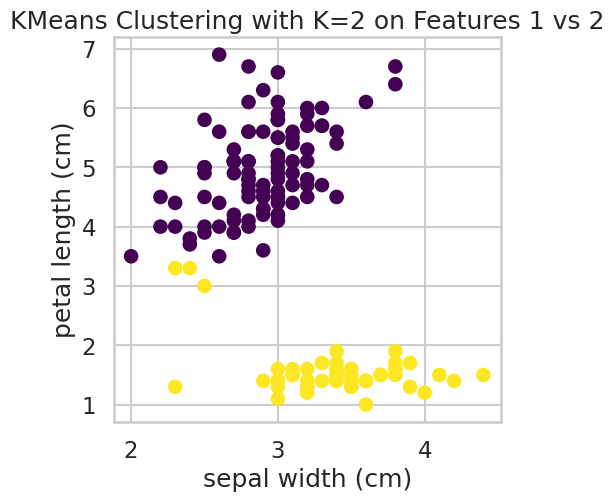

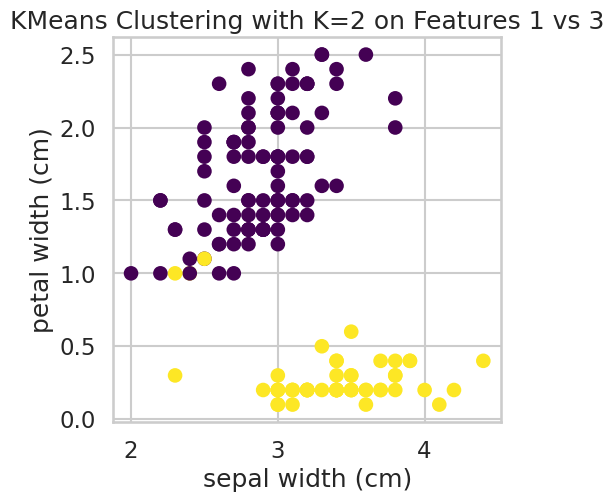

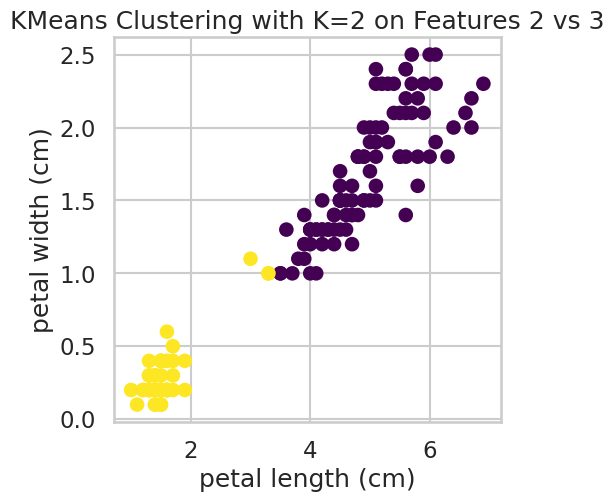

In [ ]:

# Additional comparison using all feature pairs
features_pairs = [(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]

for i, (x, y) in enumerate(features_pairs):
    plt.figure(figsize=(5, 5))
    plt.scatter(iris_features[:, x], iris_features[:, y], c=labels, cmap='viridis', marker='o')
    plt.title(f'KMeans Clustering with K={best_k} on Features {x} vs {y}')
    plt.xlabel(iris_data.feature_names[x])
    plt.ylabel(iris_data.feature_names[y])
    plt.grid(True)
    plt.show()

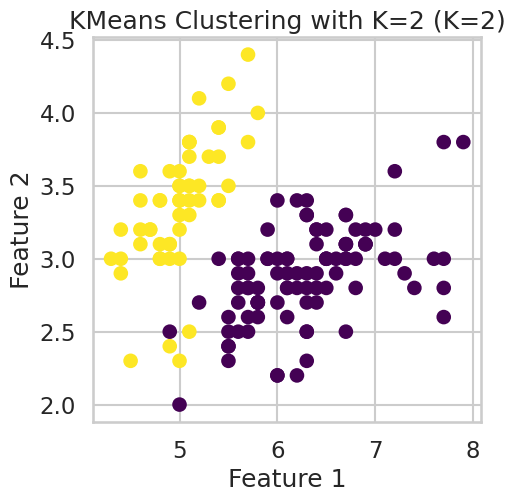

Silhouette Score for K=2: 0.6810461692117462


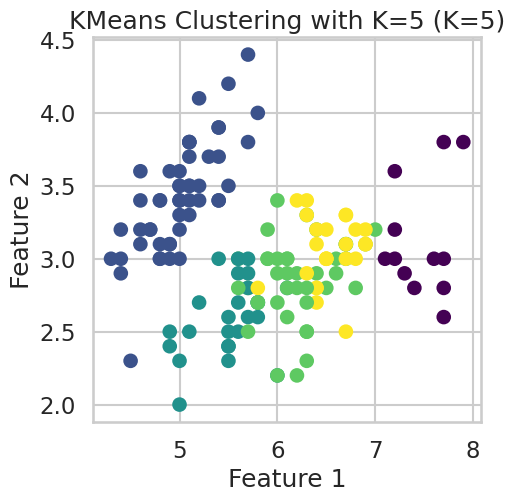

Silhouette Score for K=5: 0.48874888709310566
Adjusted Rand Index for K=2: 0.5399218294207123
Adjusted Rand Index for K=5: 0.6078964652364223


In [ ]:
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, adjusted_rand_score
import seaborn as sns

# Set plot parameters
plt.rcParams['figure.figsize'] = [5, 5]
sns.set_style("whitegrid")
sns.set_context("talk")

# Load Iris dataset
iris_data = load_iris()
iris_features = iris_data.data
iris_target = iris_data.target

# Function to display clusters
def display_cluster(data, labels, k, title_suffix=''):
    plt.figure(figsize=(5, 5))
    plt.scatter(data[:, 0], data[:, 1], c=labels, cmap='viridis', marker='o')
    plt.title(f'KMeans Clustering with K={k} {title_suffix}')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.grid(True)
    plt.show()

# Visualizing clustering results for K = 2
kmeans_2 = KMeans(n_clusters=2, random_state=42)
kmeans_2.fit(iris_features)
labels_2 = kmeans_2.labels_
display_cluster(iris_features, labels_2, 2, title_suffix='(K=2)')
silhouette_score_2 = silhouette_score(iris_features, labels_2)
print(f"Silhouette Score for K=2: {silhouette_score_2}")

# Visualizing clustering results for K = 5
kmeans_5 = KMeans(n_clusters=5, random_state=42)
kmeans_5.fit(iris_features)
labels_5 = kmeans_5.labels_
display_cluster(iris_features, labels_5, 5, title_suffix='(K=5)')
silhouette_score_5 = silhouette_score(iris_features, labels_5)
print(f"Silhouette Score for K=5: {silhouette_score_5}")

# Comparing the Adjusted Rand Index
adjusted_rand_index_2 = adjusted_rand_score(iris_target, labels_2)
adjusted_rand_index_5 = adjusted_rand_score(iris_target, labels_5)
print(f"Adjusted Rand Index for K=2: {adjusted_rand_index_2}")
print(f"Adjusted Rand Index for K=5: {adjusted_rand_index_5}")


Kmeans after Normalize

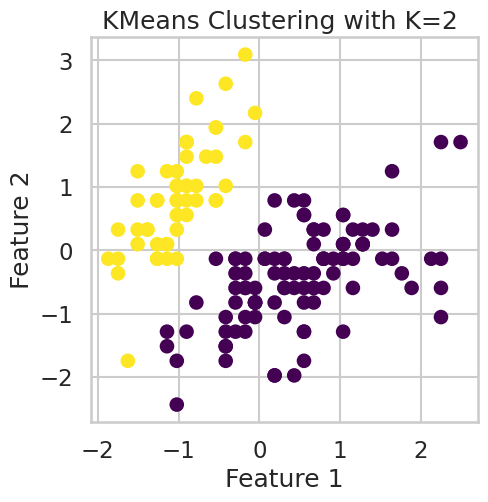

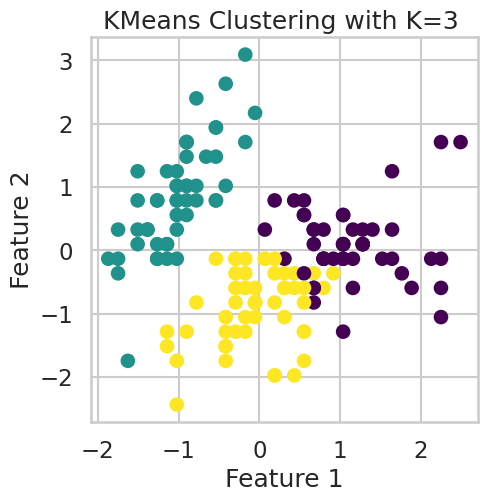

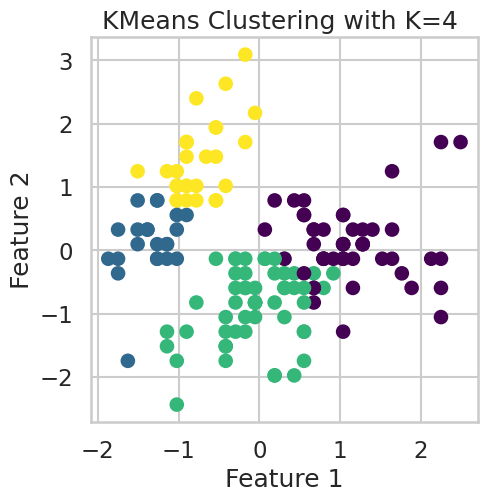

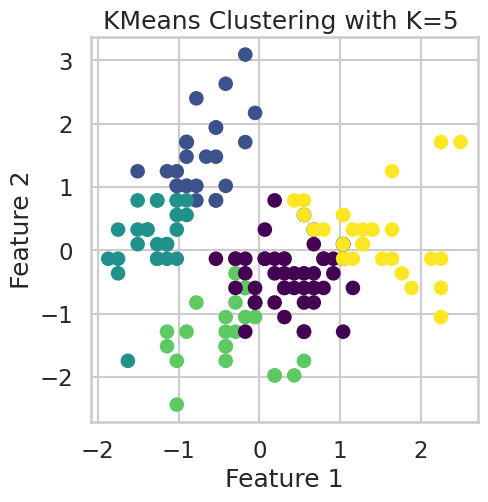

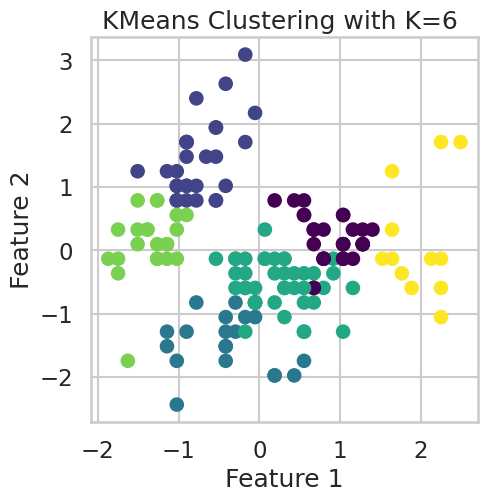

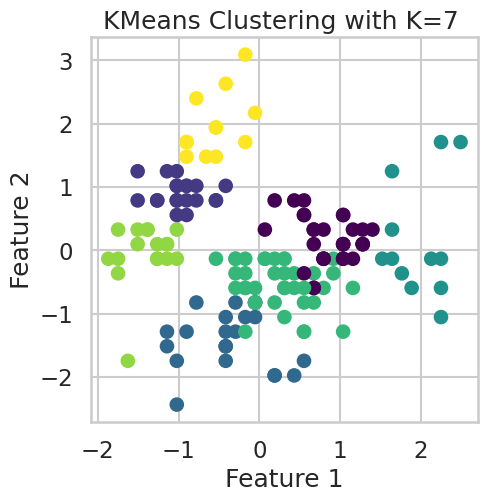

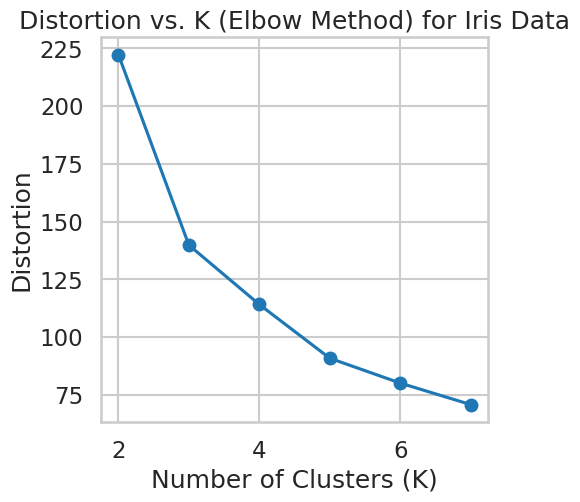

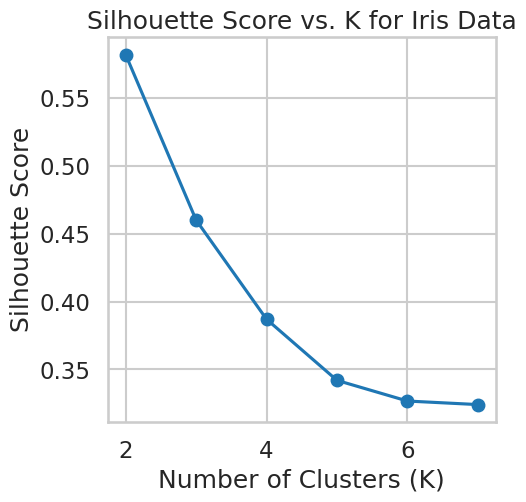

Best K: 2, Best Silhouette Score: 0.5817500491982808


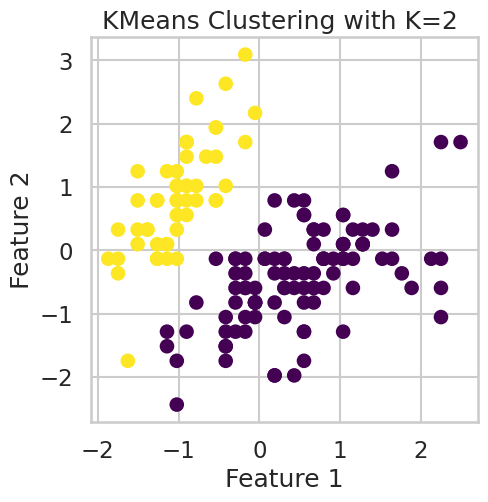

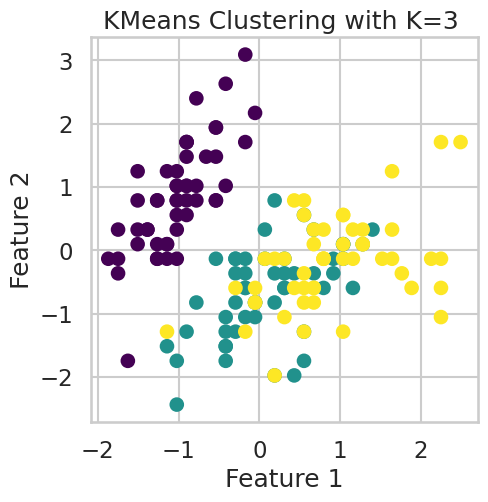

In [ ]:
from sklearn.preprocessing import StandardScaler
# Load Iris dataset
iris_data = load_iris()
iris_features = iris_data.data
iris_target = iris_data.target
# Normalize the data
scaler = StandardScaler()
iris_features_normalized = scaler.fit_transform(iris_features)
KmeansFun(iris_features_normalized)

Normalization: StandardScaler was used to normalize the features of the Iris dataset. Normalization scales each feature to have a mean of 0 and a standard deviation of 1, which is crucial for KMeans clustering as it ensures that all features contribute equally to the distance calculations.

Results and Analysis:
Distortion Plot:

The plot typically shows a significant drop in distortion when moving from

K=2 to K=3, and then a more gradual decrease.
The elbow point appears around K=3 or K=4, suggesting these values might be suitable for the number of clusters.
Silhouette Score Plot:

The silhouette scores were highest for

K=2, indicating that two clusters provide the best separation.
As K increases beyond 2, the silhouette score decreases, suggesting less distinct clustering.
Best K Based on Silhouette Score:

The best 𝐾 based on the silhouette score was found to be 2, with the highest silhouette score.
This result indicates that the data is best separated into two clusters when considering cluster compactness and separation.

2. DBscan

eps: 0.3, min_samples: 5, Silhouette Score: -0.1941947686285083
eps: 0.3, min_samples: 6, Silhouette Score: 0.17509759538454042
eps: 0.3, min_samples: 7, Silhouette Score: 0.17509759538454042
eps: 0.3, min_samples: 8, Silhouette Score: 0.1565818060701212
eps: 0.3, min_samples: 9, Silhouette Score: 0.09847051223250837
eps: 0.4, min_samples: 5, Silhouette Score: 0.027670001694674724
eps: 0.4, min_samples: 6, Silhouette Score: -0.06622381407091892
eps: 0.4, min_samples: 7, Silhouette Score: -0.15164465716460526
eps: 0.4, min_samples: 8, Silhouette Score: 0.2967063489775823
eps: 0.4, min_samples: 9, Silhouette Score: 0.28823574994029677
eps: 0.4, min_samples: 10, Silhouette Score: 0.28823574994029677
eps: 0.4, min_samples: 11, Silhouette Score: 0.2780838470700254
eps: 0.4, min_samples: 12, Silhouette Score: 0.12894948212986881
eps: 0.5, min_samples: 5, Silhouette Score: 0.35651648142700726
eps: 0.5, min_samples: 6, Silhouette Score: 0.19586659299427786
eps: 0.5, min_samples: 7, Silhouette 

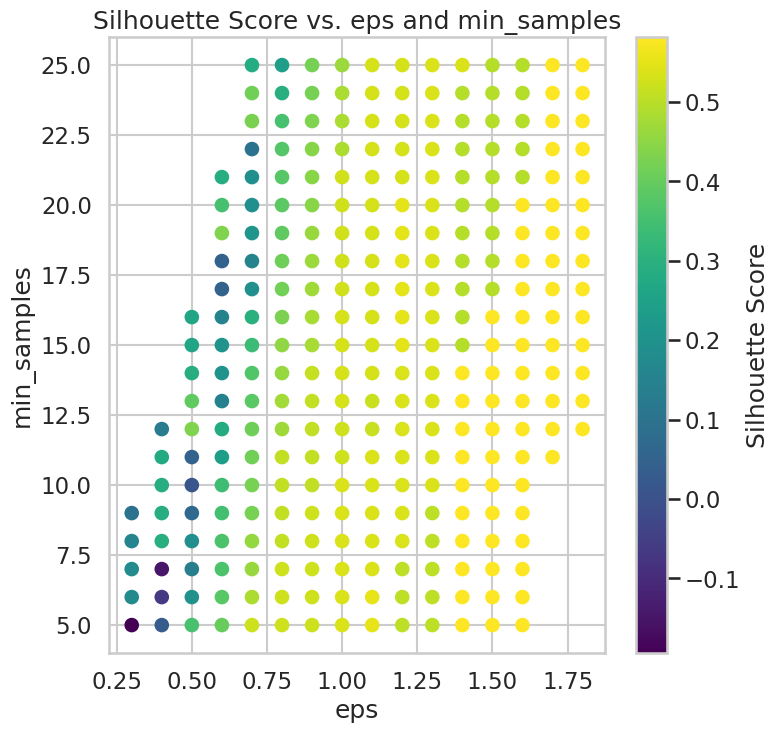

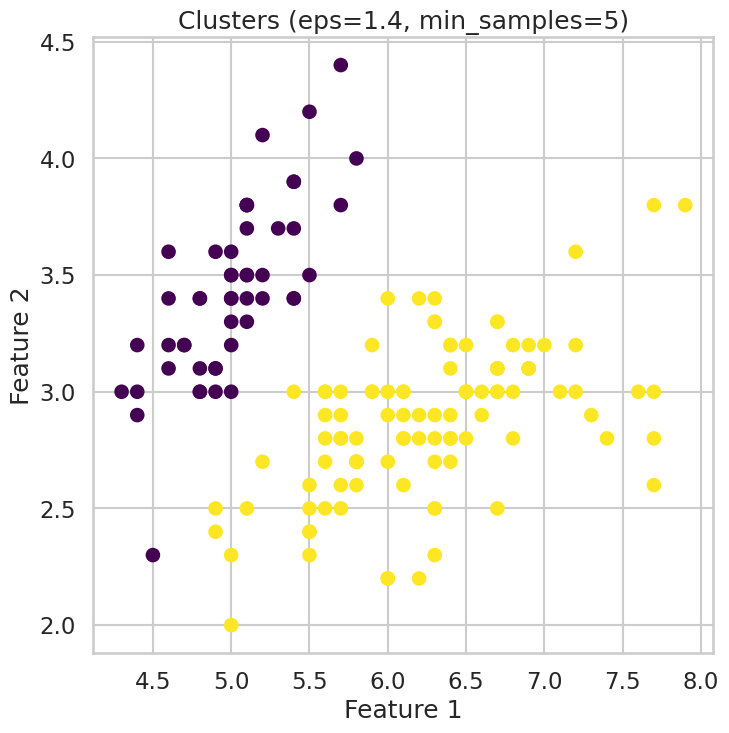

Best Silhouette Score: 0.5817500491982808
Best Parameters: eps: 1.4, min_samples: 5


In [ ]:
# Load the Iris dataset and use all features
iris = load_iris()
iris_data = iris.data

# Use the function with the Iris dataset
dbscan_clustering_analysis(iris_data)

normalize

eps: 0.3, min_samples: 5, Silhouette Score: -0.19419476862850818
eps: 0.3, min_samples: 6, Silhouette Score: 0.17509759538454042
eps: 0.3, min_samples: 7, Silhouette Score: 0.17509759538454042
eps: 0.3, min_samples: 8, Silhouette Score: 0.1565818060701212
eps: 0.3, min_samples: 9, Silhouette Score: 0.09847051223250834
eps: 0.4, min_samples: 5, Silhouette Score: 0.0276700016946747
eps: 0.4, min_samples: 6, Silhouette Score: -0.06622381407091889
eps: 0.4, min_samples: 7, Silhouette Score: -0.15164465716460518
eps: 0.4, min_samples: 8, Silhouette Score: 0.29670634897758236
eps: 0.4, min_samples: 9, Silhouette Score: 0.28823574994029677
eps: 0.4, min_samples: 10, Silhouette Score: 0.28823574994029677
eps: 0.4, min_samples: 11, Silhouette Score: 0.2780838470700255
eps: 0.4, min_samples: 12, Silhouette Score: 0.12894948212986881
eps: 0.5, min_samples: 5, Silhouette Score: 0.35651648142700726
eps: 0.5, min_samples: 6, Silhouette Score: 0.19586659299427783
eps: 0.5, min_samples: 7, Silhouette 

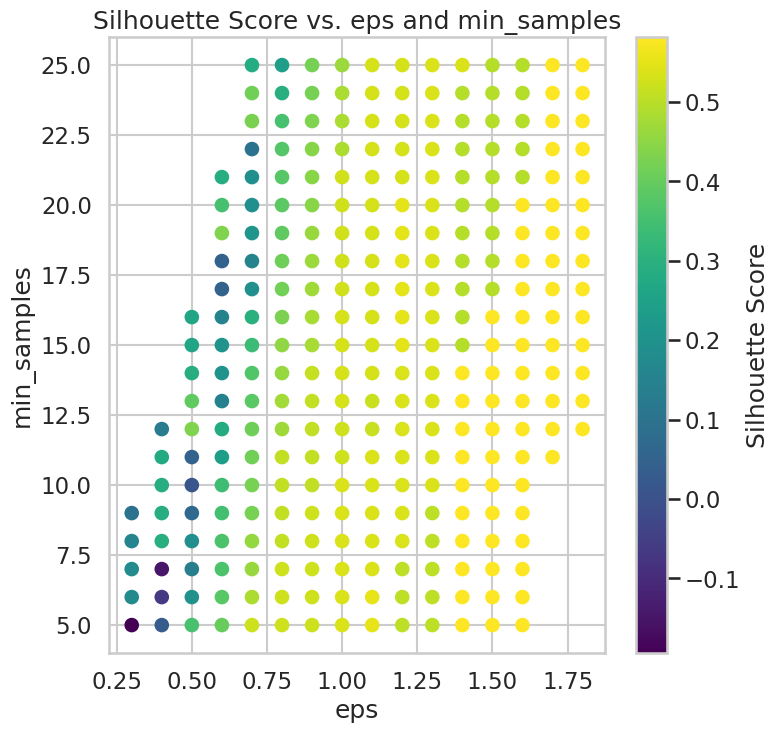

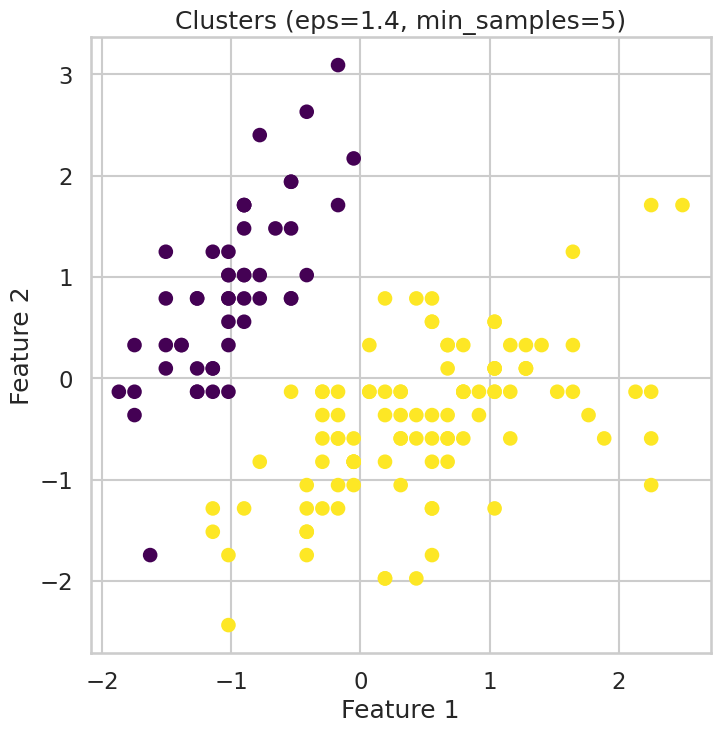

Best Silhouette Score: 0.5817500491982807
Best Parameters: eps: 1.4, min_samples: 5


In [ ]:
from sklearn.preprocessing import StandardScaler
# Load Iris dataset
iris_data = load_iris()
scaler = StandardScaler()
# Load Iris dataset
iris_data = scaler.fit_transform(iris.data)

# Use the function with the normalized Iris dataset
dbscan_clustering_analysis(iris_data)

3. Hirarchial

Affinity: euclidean, Linkage: average, Distance threshold: 1, Silhouette Score: 0.3453867465305567


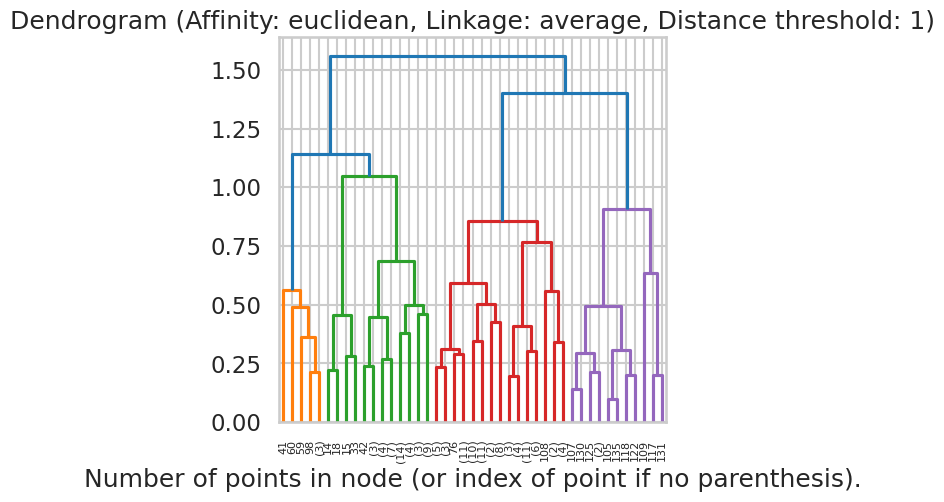

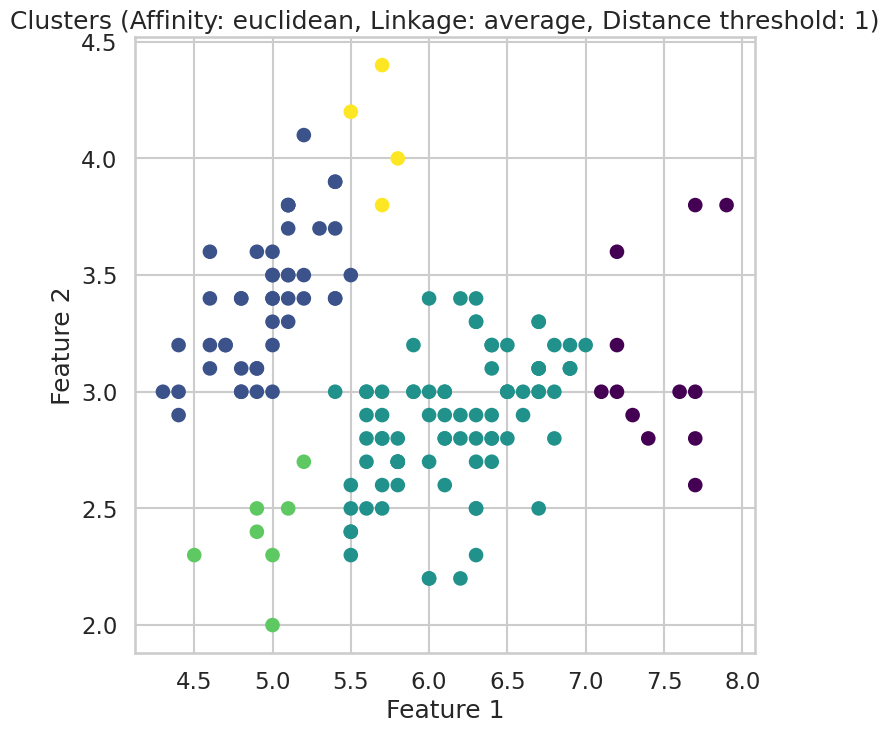

Invalid configuration for Affinity: euclidean, Linkage: average, Distance threshold: 3
Invalid configuration for Affinity: euclidean, Linkage: average, Distance threshold: 5
Invalid configuration for Affinity: euclidean, Linkage: single, Distance threshold: 1
Invalid configuration for Affinity: euclidean, Linkage: single, Distance threshold: 3
Invalid configuration for Affinity: euclidean, Linkage: single, Distance threshold: 5
Affinity: manhattan, Linkage: average, Distance threshold: 1, Silhouette Score: 0.3659475993791961


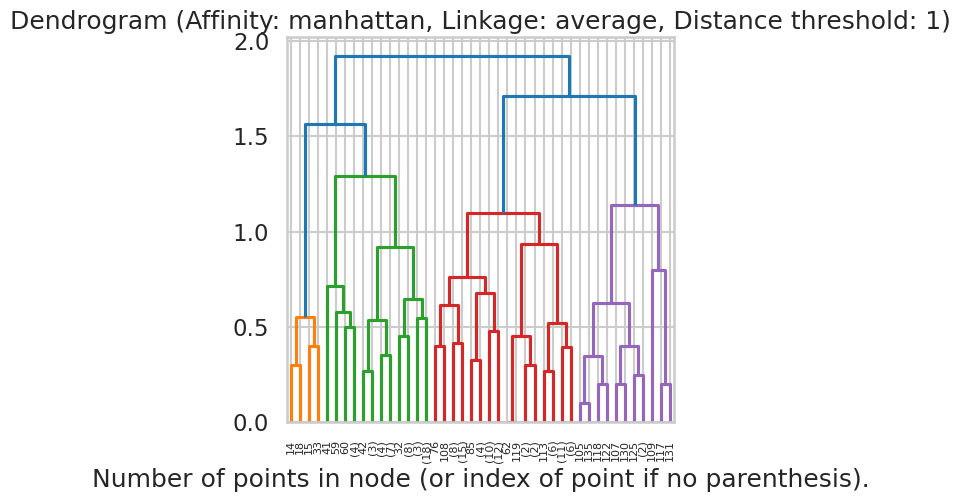

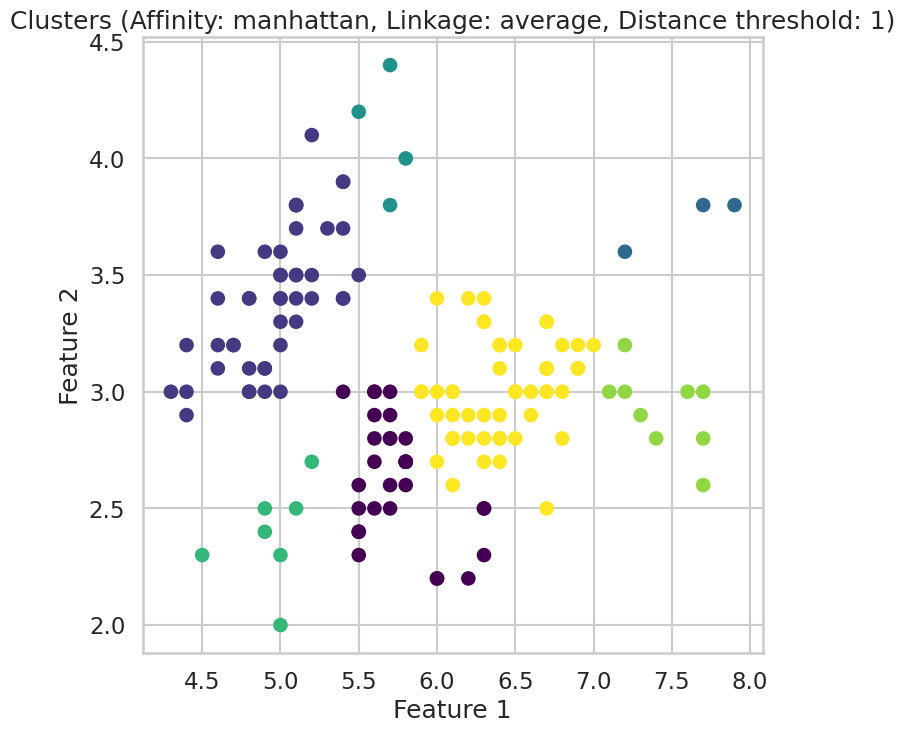

Invalid configuration for Affinity: manhattan, Linkage: average, Distance threshold: 3
Invalid configuration for Affinity: manhattan, Linkage: average, Distance threshold: 5
Invalid configuration for Affinity: manhattan, Linkage: single, Distance threshold: 1
Invalid configuration for Affinity: manhattan, Linkage: single, Distance threshold: 3
Invalid configuration for Affinity: manhattan, Linkage: single, Distance threshold: 5
Invalid configuration for Affinity: cosine, Linkage: average, Distance threshold: 1
Invalid configuration for Affinity: cosine, Linkage: average, Distance threshold: 3
Invalid configuration for Affinity: cosine, Linkage: average, Distance threshold: 5
Invalid configuration for Affinity: cosine, Linkage: single, Distance threshold: 1
Invalid configuration for Affinity: cosine, Linkage: single, Distance threshold: 3
Invalid configuration for Affinity: cosine, Linkage: single, Distance threshold: 5
Best Silhouette Score: 0.3659475993791961
Best Parameters: Affinity

In [ ]:
# Load the Iris dataset and use the first two features for visualization
iris = load_iris()
iris_data = iris.data[:, :2]  # Using only the first two features for visualization

# Use the function with the Iris dataset
hierarchical_clustering_analysis(iris_data)

after normalize

Affinity: euclidean, Linkage: average, Distance threshold: 1, Silhouette Score: 0.3916007289945804


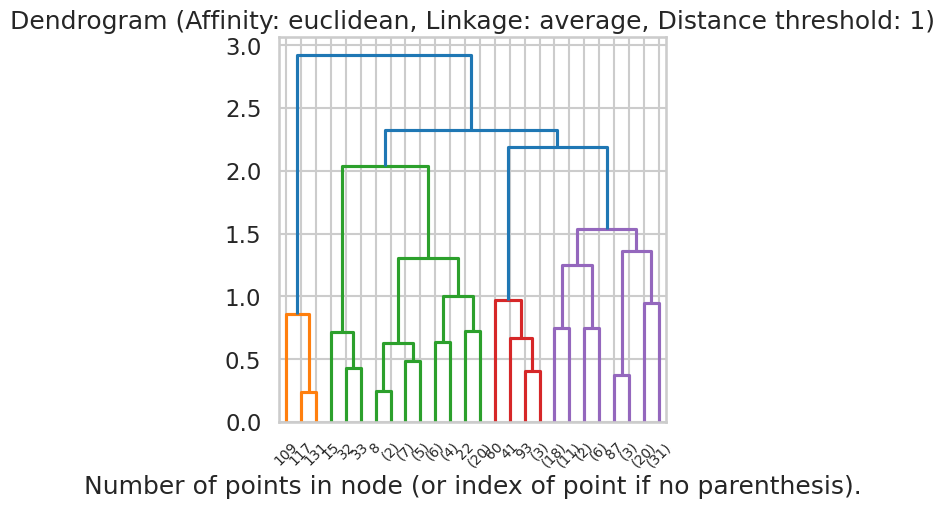

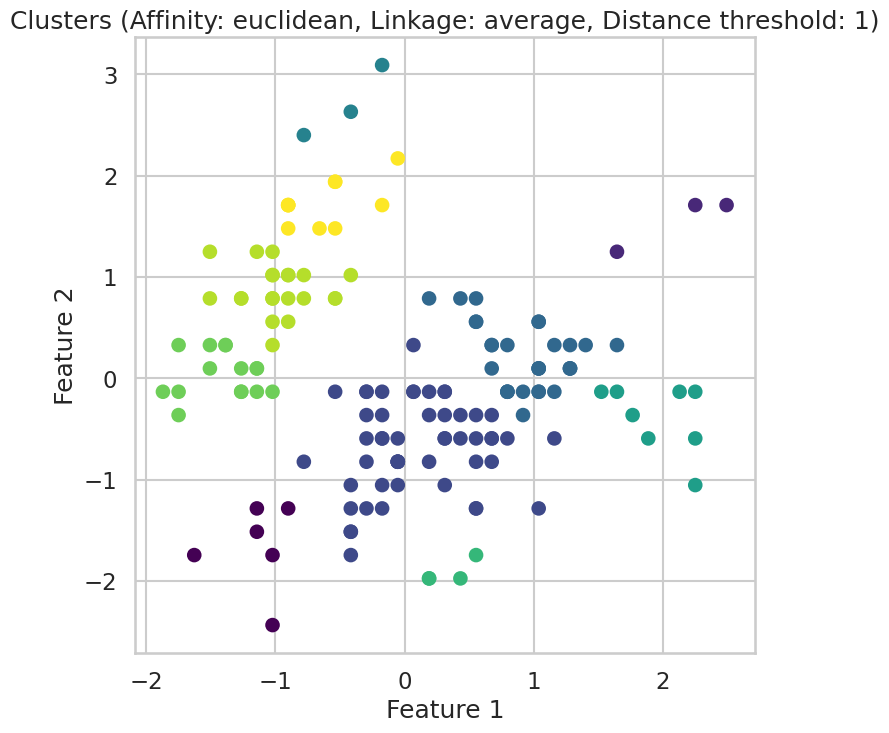

Invalid configuration for Affinity: euclidean, Linkage: average, Distance threshold: 3
Invalid configuration for Affinity: euclidean, Linkage: average, Distance threshold: 5
Invalid configuration for Affinity: euclidean, Linkage: single, Distance threshold: 1
Invalid configuration for Affinity: euclidean, Linkage: single, Distance threshold: 3
Invalid configuration for Affinity: euclidean, Linkage: single, Distance threshold: 5
Affinity: manhattan, Linkage: average, Distance threshold: 1, Silhouette Score: 0.39054954675124276


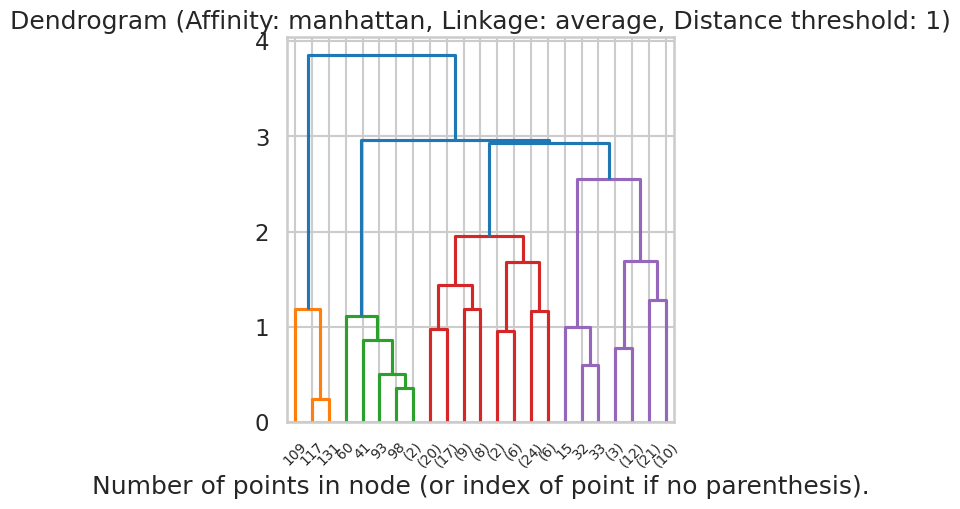

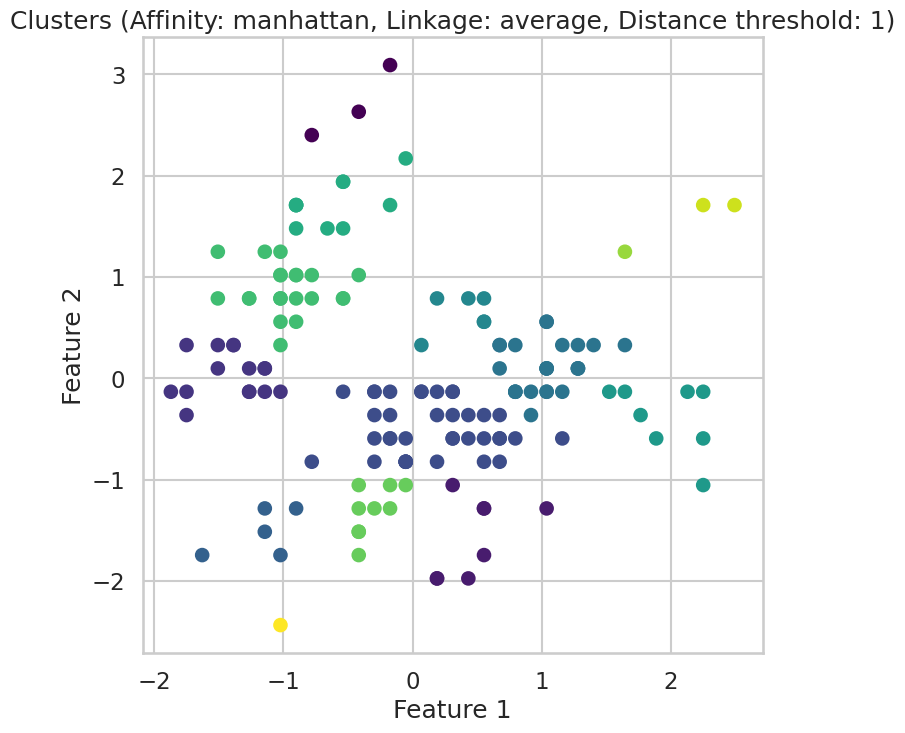

Affinity: manhattan, Linkage: average, Distance threshold: 3, Silhouette Score: 0.3720573422093194


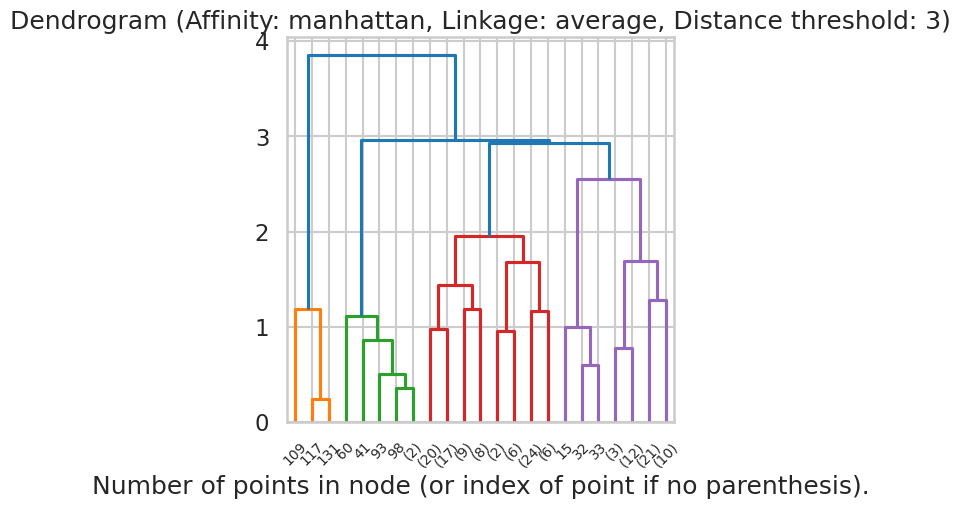

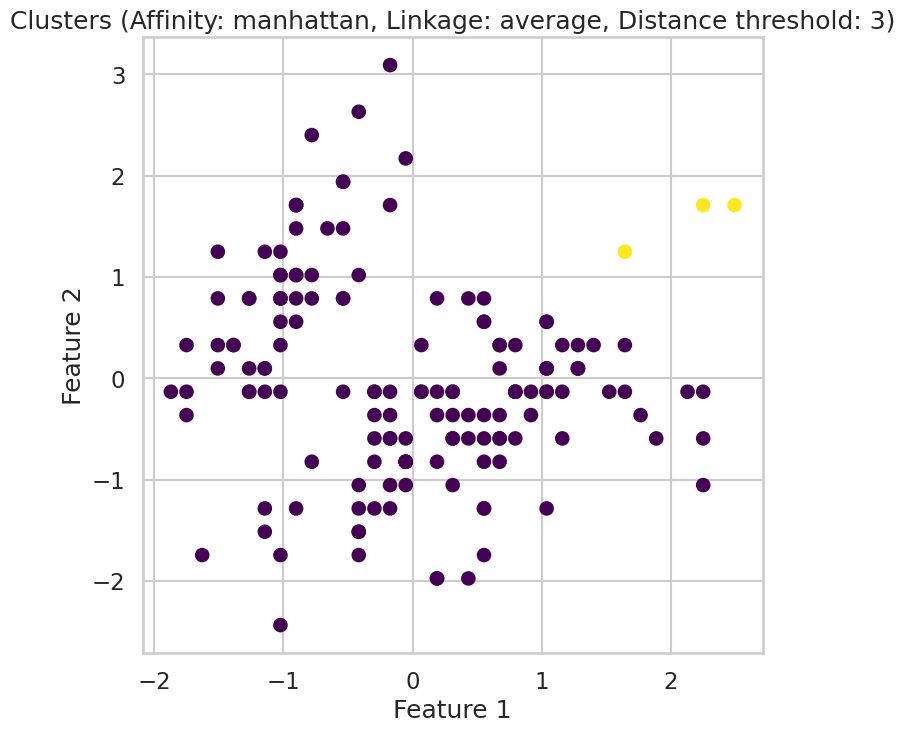

Invalid configuration for Affinity: manhattan, Linkage: average, Distance threshold: 5
Affinity: manhattan, Linkage: single, Distance threshold: 1, Silhouette Score: 0.417979801247809


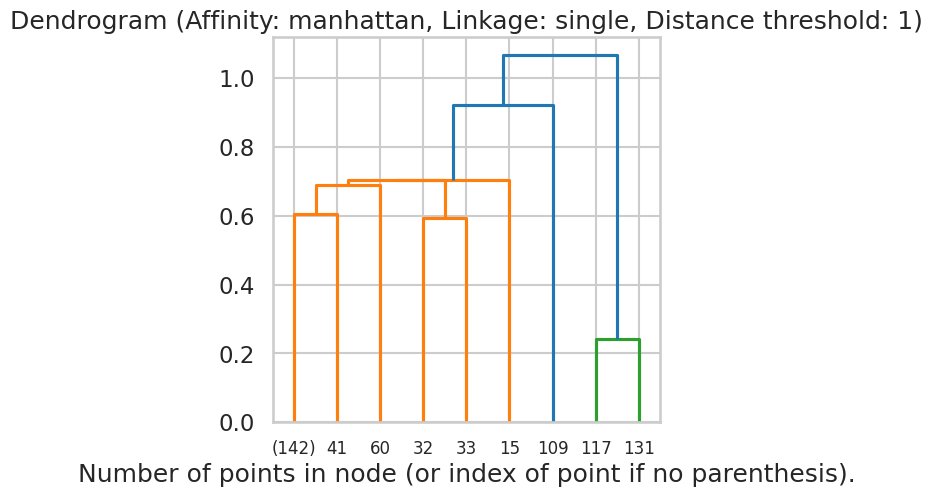

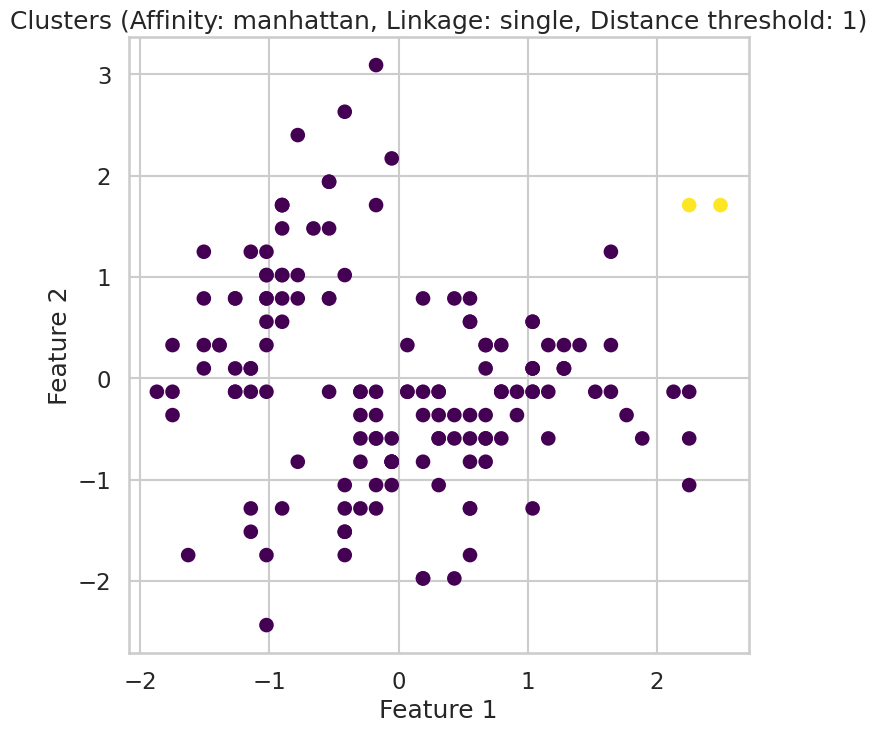

Invalid configuration for Affinity: manhattan, Linkage: single, Distance threshold: 3
Invalid configuration for Affinity: manhattan, Linkage: single, Distance threshold: 5
Affinity: cosine, Linkage: average, Distance threshold: 1, Silhouette Score: 0.4330196272810509


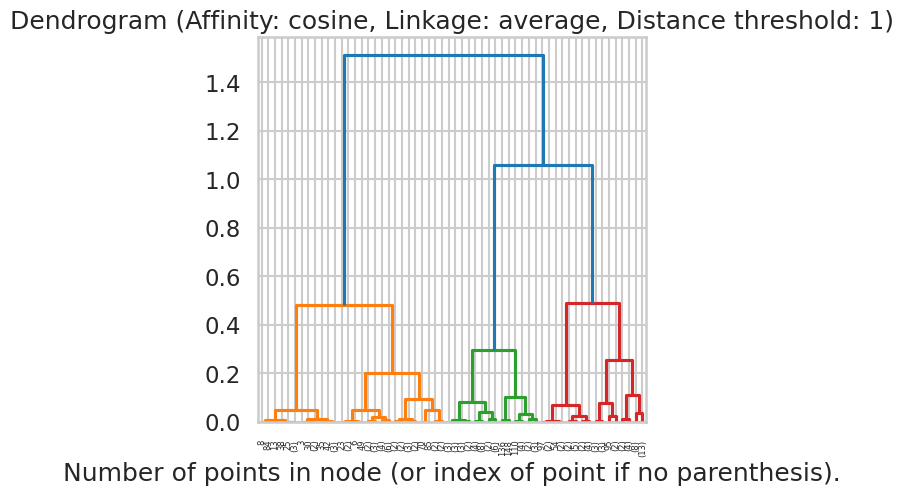

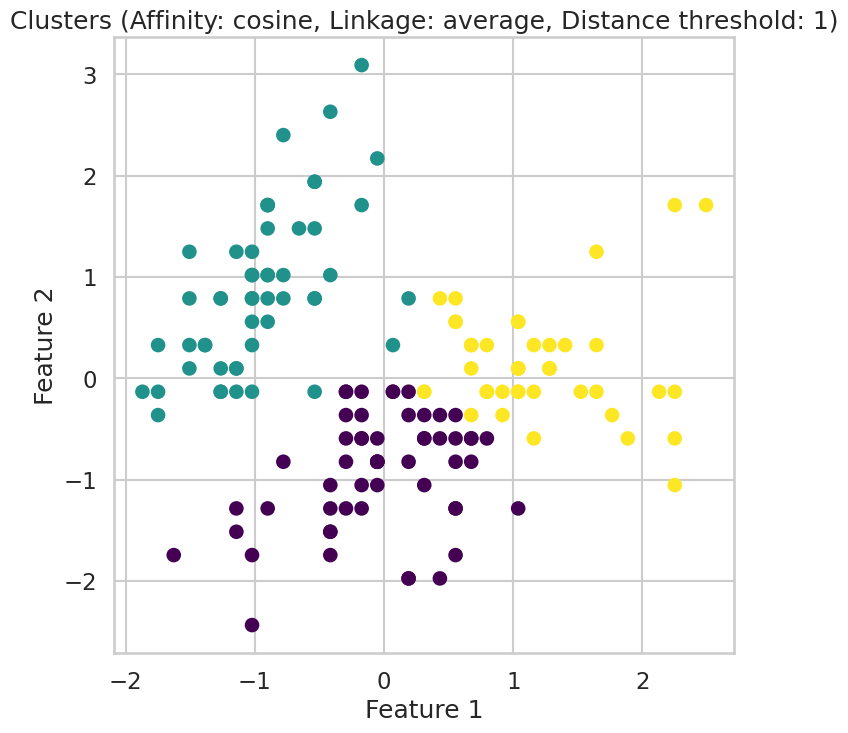

Invalid configuration for Affinity: cosine, Linkage: average, Distance threshold: 3
Invalid configuration for Affinity: cosine, Linkage: average, Distance threshold: 5
Invalid configuration for Affinity: cosine, Linkage: single, Distance threshold: 1
Invalid configuration for Affinity: cosine, Linkage: single, Distance threshold: 3
Invalid configuration for Affinity: cosine, Linkage: single, Distance threshold: 5
Best Silhouette Score: 0.4330196272810509
Best Parameters: Affinity: cosine, Linkage: average, Distance threshold: 1


In [ ]:
from sklearn.preprocessing import StandardScaler
# Load Iris dataset
iris_data = load_iris()
scaler = StandardScaler()
iris_data = scaler.fit_transform(iris.data[:, :2])  # Using only the first two features for visualization

# Use the function with the normalized Iris dataset
hierarchical_clustering_analysis(iris_data)


4. Gaussian Mixture

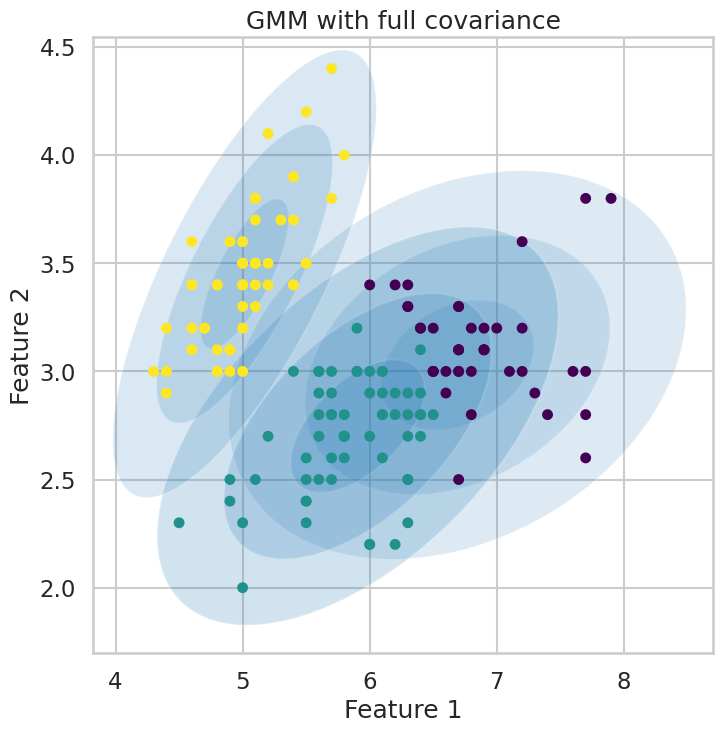

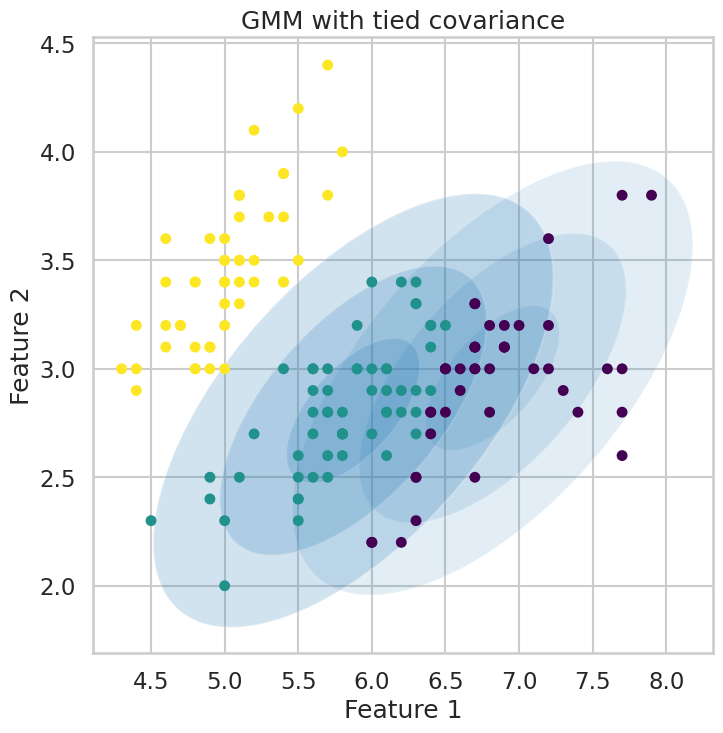

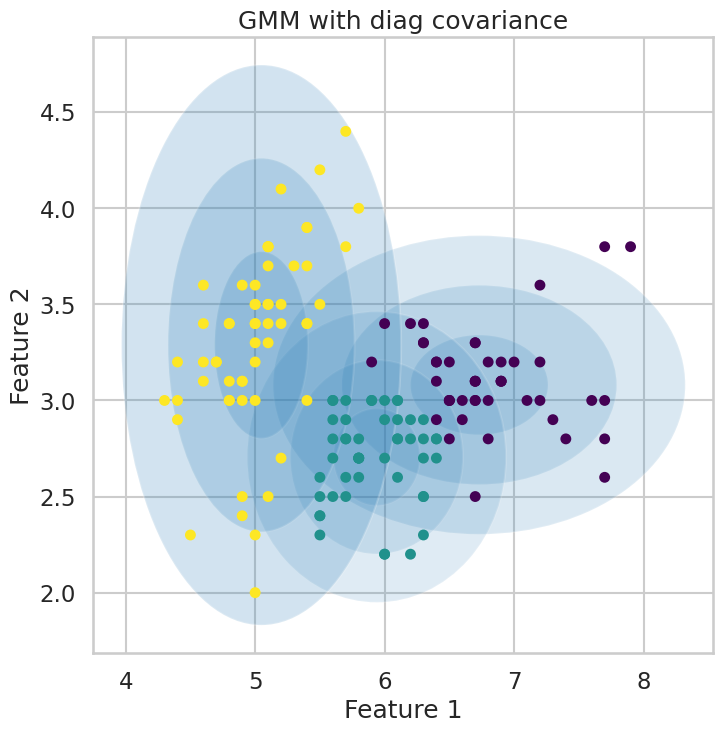

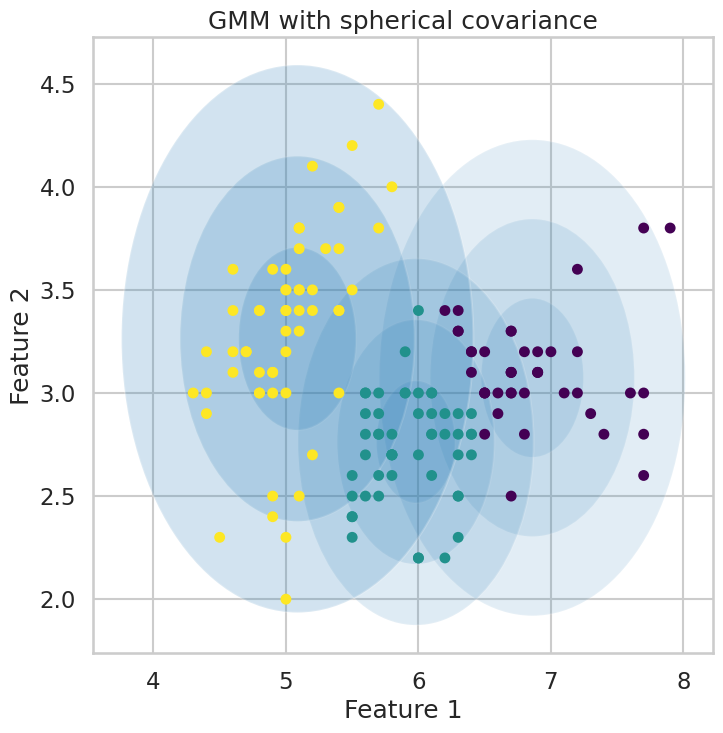

In [ ]:
# Set plot parameters
plt.rcParams['figure.figsize'] = [5, 5]
sns.set_style("whitegrid")
sns.set_context("talk")

# Load Iris dataset
iris= load_iris()
iris_data = iris.data[:, :2]  # Using only the first two features for visualization
fit_and_plot_gmm(iris_data, n_components=3)


## Customer dataset
Repeat all the above on the customer data set

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
df=pd.read_csv("/content/drive/MyDrive/guc/ML IET/Project/Customer data.csv")

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   ID               2000 non-null   int64
 1   Sex              2000 non-null   int64
 2   Marital status   2000 non-null   int64
 3   Age              2000 non-null   int64
 4   Education        2000 non-null   int64
 5   Income           2000 non-null   int64
 6   Occupation       2000 non-null   int64
 7   Settlement size  2000 non-null   int64
dtypes: int64(8)
memory usage: 125.1 KB


In [6]:
df.head()

,ID,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,100000001,0,0,67,2,124670,1,2
1,100000002,1,1,22,1,150773,1,2
2,100000003,0,0,49,1,89210,0,0
3,100000004,0,0,45,1,171565,1,1
4,100000005,0,0,53,1,149031,1,1


In [50]:
# Select all features except 'ID'
X = df.drop(columns=['ID']).to_numpy()

###Kmeans

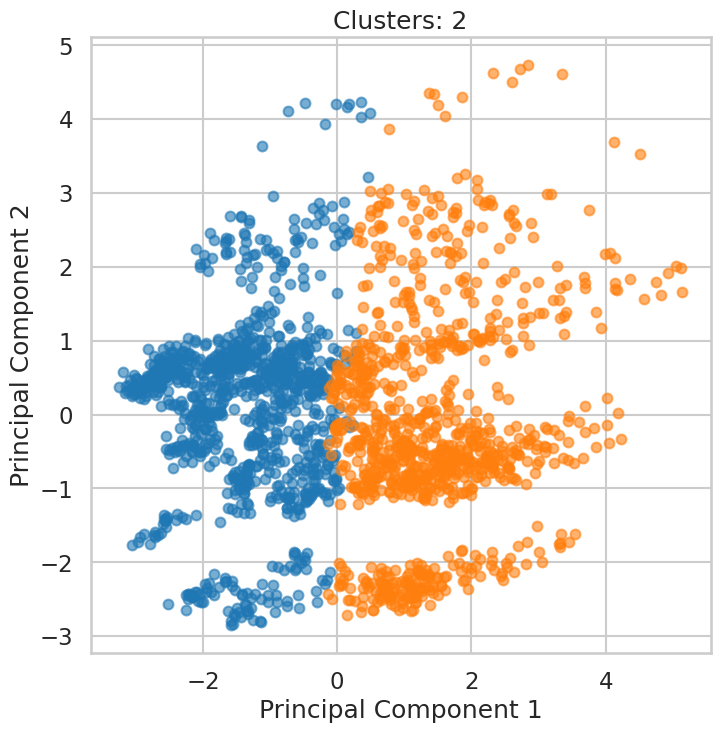

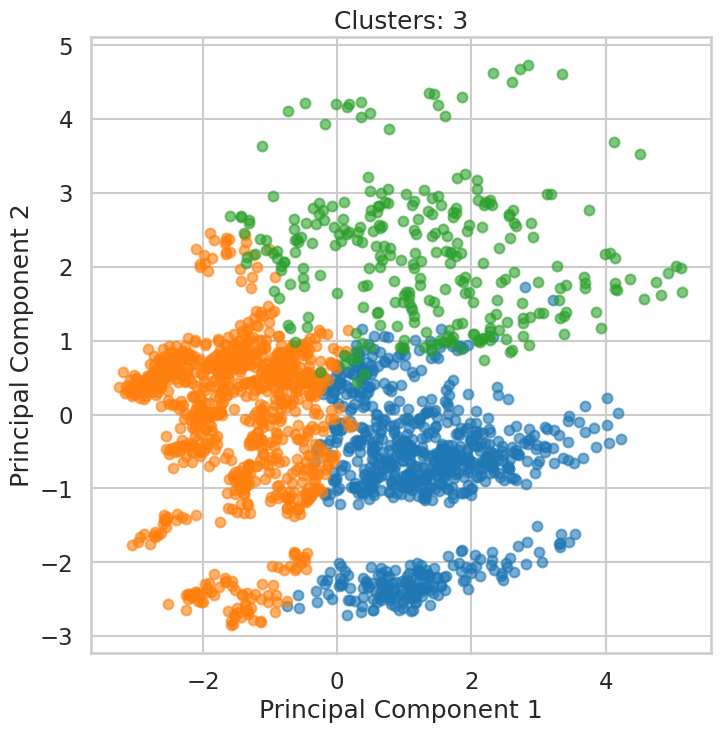

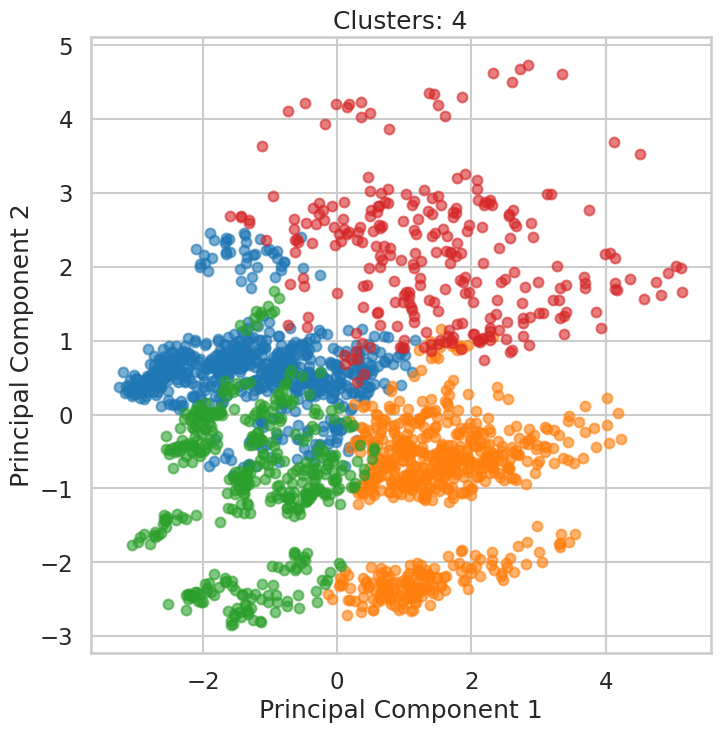

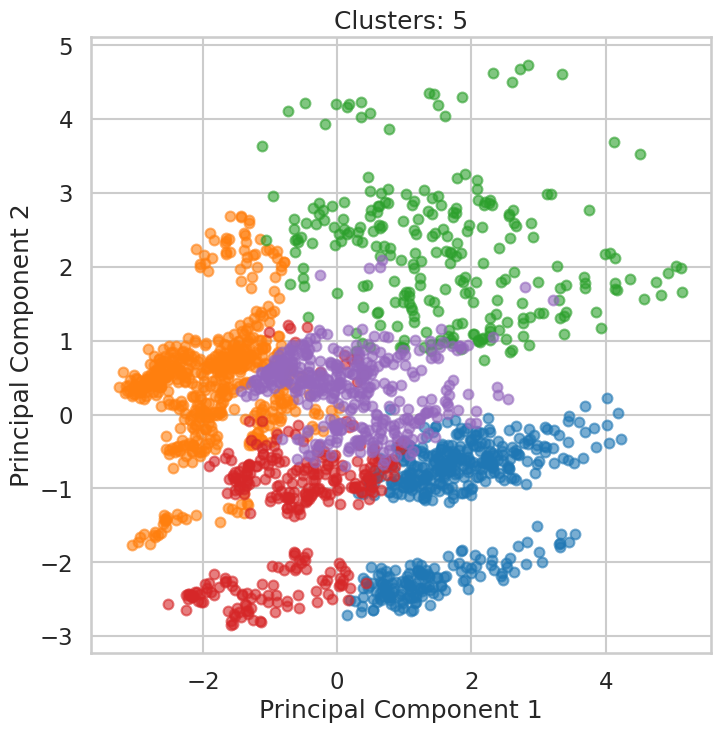

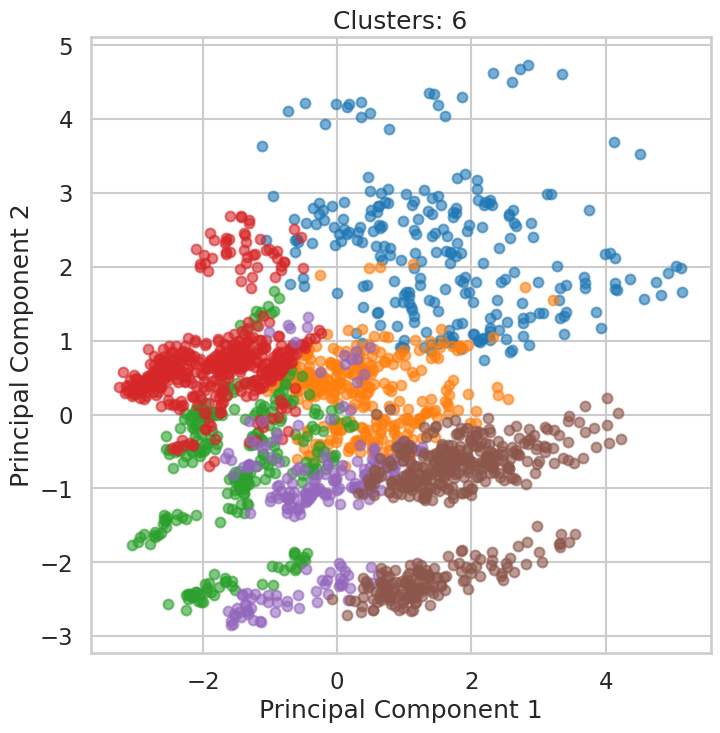

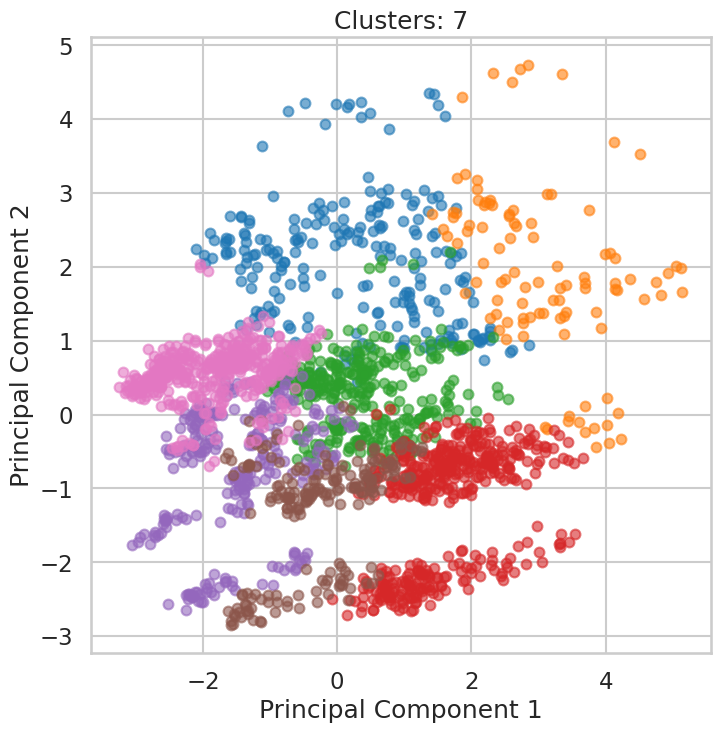

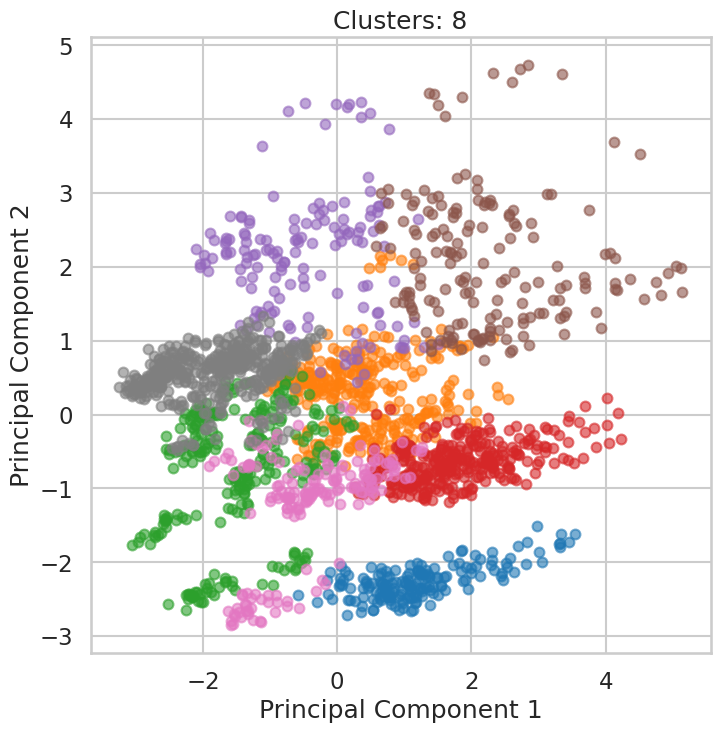

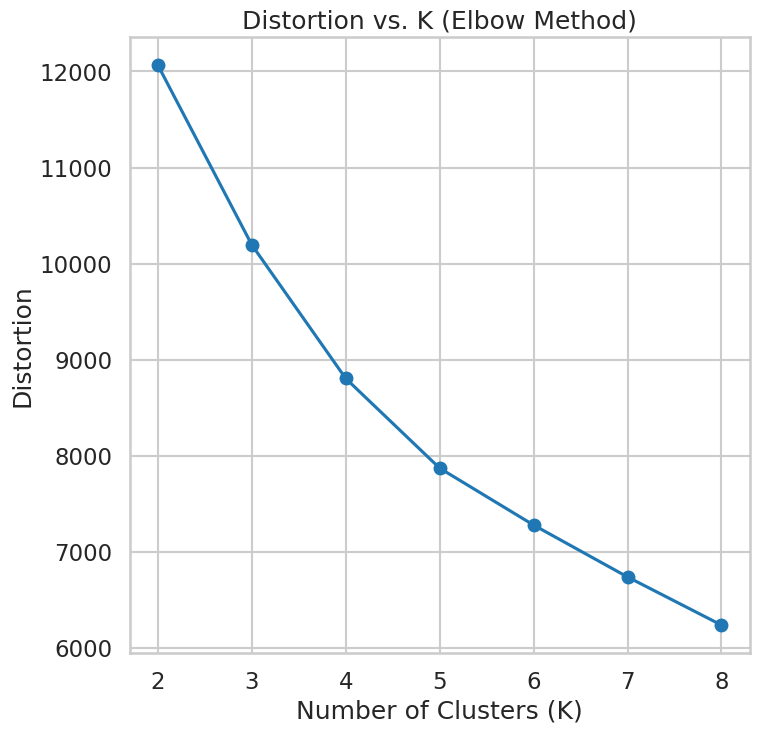

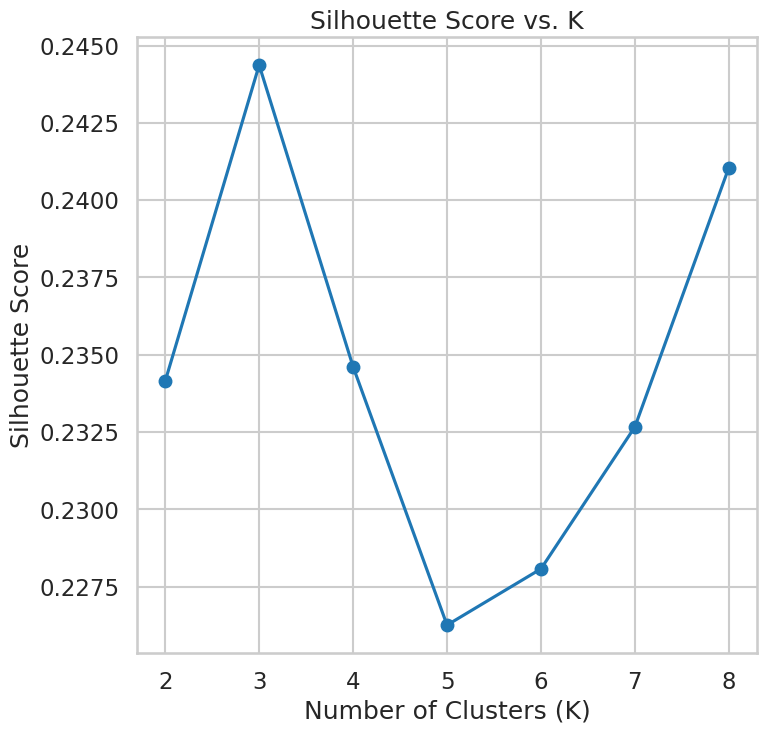

Best K: 3, Best Silhouette Score: 0.24436844393676216


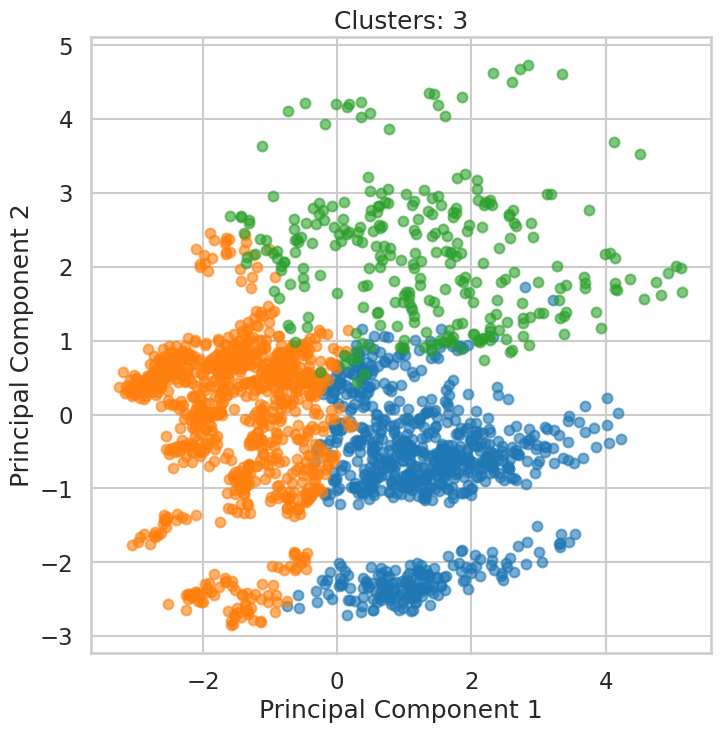

(3, 0.24436844393676216)

In [86]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np

# Function to display clusters
def display_cluster(data, labels, num_clusters):
    plt.figure(figsize=(8, 8))
    color = sns.color_palette(n_colors=num_clusters)
    alpha = 0.6
    s = 50

    for i in range(num_clusters):
        plt.scatter(data[labels == i, 0], data[labels == i, 1], c=[color[i]], alpha=alpha, s=s)
    plt.title(f'Clusters: {num_clusters}')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.grid(True)
    plt.show()

# Function to apply KMeans clustering and evaluate results
def KmeansFun2(data, K_range=range(2, 9)):
    # Normalize the data
    scaler = StandardScaler()
    data_normalized = scaler.fit_transform(data)

    # Set plot parameters
    plt.rcParams['figure.figsize'] = [8, 8]
    sns.set_style("whitegrid")
    sns.set_context("talk")

    distortions = []
    silhouette_scores = []

    for k in K_range:
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(data_normalized)
        labels = kmeans.labels_

        # Dimensionality reduction for visualization
        pca = PCA(n_components=2)
        data_pca = pca.fit_transform(data_normalized)
        display_cluster(data_pca, labels, k)

        distortions.append(kmeans.inertia_)
        silhouette_scores.append(silhouette_score(data_normalized, labels))

    # Plotting distortion function vs. K
    plt.figure(figsize=(8, 8))
    plt.plot(K_range, distortions, marker='o')
    plt.title('Distortion vs. K (Elbow Method)')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Distortion')
    plt.grid(True)
    plt.show()

    # Plotting silhouette score vs. K
    plt.figure(figsize=(8, 8))
    plt.plot(K_range, silhouette_scores, marker='o')
    plt.title('Silhouette Score vs. K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Silhouette Score')
    plt.grid(True)
    plt.show()

    # Choosing the best K based on the silhouette score
    best_k = K_range[silhouette_scores.index(max(silhouette_scores))]
    best_silhouette_score = max(silhouette_scores)

    print(f"Best K: {best_k}, Best Silhouette Score: {best_silhouette_score}")

    # Display clustering results for the best K
    kmeans = KMeans(n_clusters=best_k, random_state=42)
    kmeans.fit(data_normalized)
    labels = kmeans.labels_

    # Dimensionality reduction for visualization
    data_pca = pca.fit_transform(data_normalized)
    display_cluster(data_pca, labels, best_k)

    return best_k, best_silhouette_score

KmeansFun2(df)

K: 2, Silhouette Score: 0.2496082794803034
Cluster Assignments for K=2:
 [1 1 0 ... 0 0 0]
K: 3, Silhouette Score: 0.27177060998494357
Cluster Assignments for K=3:
 [0 2 1 ... 1 2 1]
K: 4, Silhouette Score: 0.26879180394522123
Cluster Assignments for K=4:
 [0 2 1 ... 1 2 1]
K: 5, Silhouette Score: 0.2540800397305643
Cluster Assignments for K=5:
 [2 4 3 ... 3 1 3]
K: 6, Silhouette Score: 0.2630752333415311
Cluster Assignments for K=6:
 [5 2 1 ... 1 3 1]
K: 7, Silhouette Score: 0.26659241496996416
Cluster Assignments for K=7:
 [1 2 6 ... 6 0 6]
K: 8, Silhouette Score: 0.2781577892481291
Cluster Assignments for K=8:
 [7 6 2 ... 2 0 2]


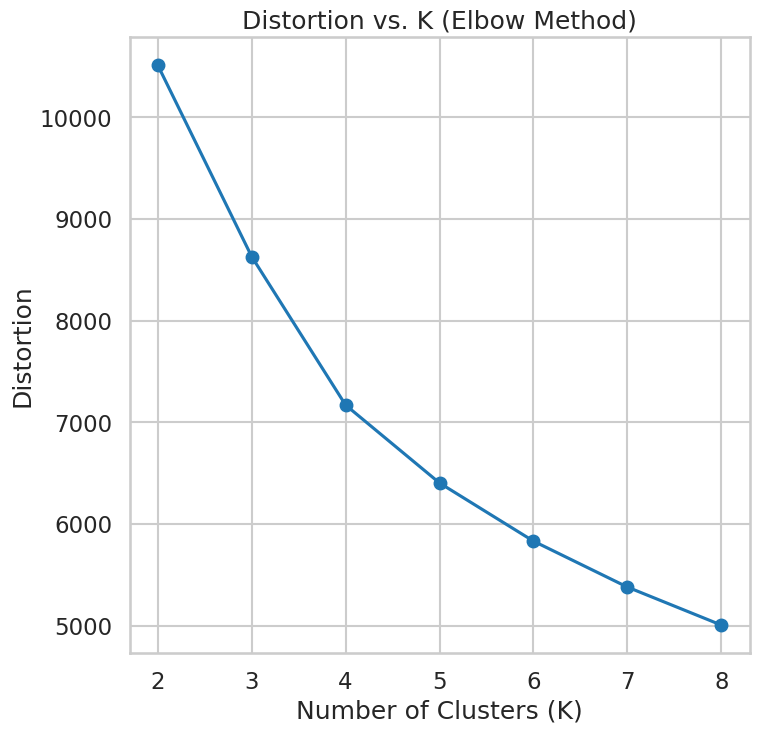

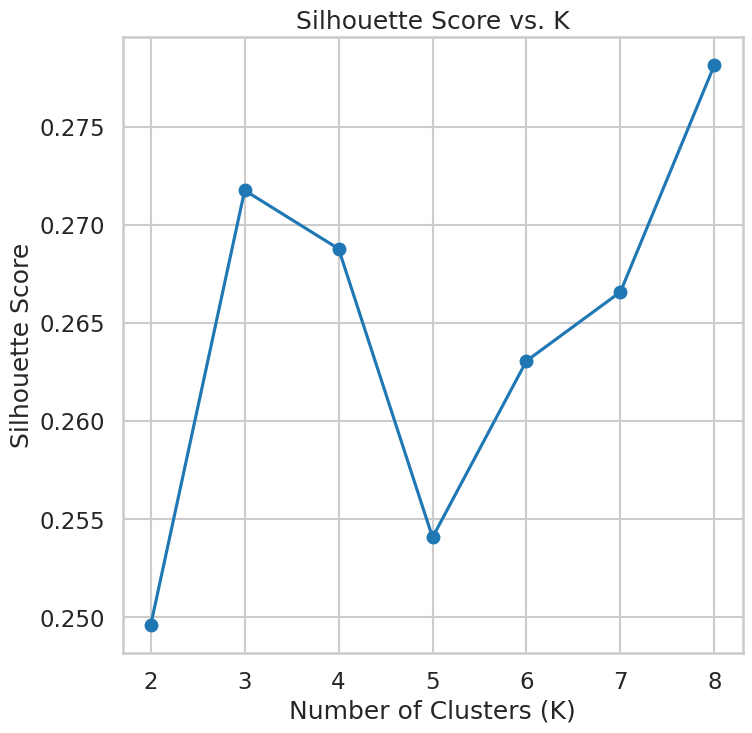

Best K: 8, Best Silhouette Score: 0.2781577892481291

Cluster Assignments for K=2:
 [1 1 0 ... 0 0 0]

Cluster Assignments for K=3:
 [0 2 1 ... 1 2 1]

Cluster Assignments for K=4:
 [0 2 1 ... 1 2 1]

Cluster Assignments for K=5:
 [2 4 3 ... 3 1 3]

Cluster Assignments for K=6:
 [5 2 1 ... 1 3 1]

Cluster Assignments for K=7:
 [1 2 6 ... 6 0 6]

Cluster Assignments for K=8:
 [7 6 2 ... 2 0 2]


In [77]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Function to apply KMeans clustering and evaluate results
def KmeansFun(data, K_range=range(2, 9)):
    # Set plot parameters
    plt.rcParams['figure.figsize'] = [8, 8]
    sns.set_style("whitegrid")
    sns.set_context("talk")

    distortions = []
    silhouette_scores = []
    cluster_assignments = {}

    for k in K_range:
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(data)
        labels = kmeans.labels_
        distortions.append(kmeans.inertia_)
        sil_score = silhouette_score(data, labels)
        silhouette_scores.append(sil_score)
        cluster_assignments[k] = labels
        print(f"K: {k}, Silhouette Score: {sil_score}")
        print(f"Cluster Assignments for K={k}:\n", labels)

    # Plotting distortion function vs. K
    plt.figure(figsize=(8, 8))
    plt.plot(K_range, distortions, marker='o')
    plt.title('Distortion vs. K (Elbow Method)')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Distortion')
    plt.grid(True)
    plt.show()

    # Plotting silhouette score vs. K
    plt.figure(figsize=(8, 8))
    plt.plot(K_range, silhouette_scores, marker='o')
    plt.title('Silhouette Score vs. K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Silhouette Score')
    plt.grid(True)
    plt.show()

    # Choosing the best K based on the silhouette score
    best_k = K_range[silhouette_scores.index(max(silhouette_scores))]
    best_silhouette_score = max(silhouette_scores)

    print(f"Best K: {best_k}, Best Silhouette Score: {best_silhouette_score}")

    # Display clustering results for the best K
    kmeans = KMeans(n_clusters=best_k, random_state=42)
    kmeans.fit(data)
    labels = kmeans.labels_

    return best_k, best_silhouette_score, cluster_assignments



# Call the KMeans clustering analysis function
best_k, best_silhouette_score, cluster_assignments = KmeansFun(X)

# Print the cluster assignments for each K
for k, labels in cluster_assignments.items():
    print(f"\nCluster Assignments for K={k}:\n", labels)


DBscan

In [80]:
# Select all features except 'id'
X = df.drop(columns=['ID'])


eps: 0.1, min_samples: 5, Silhouette Score: -0.33429647819172864
eps: 0.1, min_samples: 6, Silhouette Score: -0.36080067393571946
eps: 0.1, min_samples: 7, Silhouette Score: -0.36337696774771233
eps: 0.1, min_samples: 8, Silhouette Score: -0.24202044890530022
eps: 0.1, min_samples: 9, Silhouette Score: -0.22423567228644142
eps: 0.1, min_samples: 10, Silhouette Score: -0.24243378435562343
eps: 0.2, min_samples: 5, Silhouette Score: -0.020332424571454545
eps: 0.2, min_samples: 6, Silhouette Score: -0.07577871164407017
eps: 0.2, min_samples: 7, Silhouette Score: -0.11645764686749058
eps: 0.2, min_samples: 8, Silhouette Score: -0.13236772467745195
eps: 0.2, min_samples: 9, Silhouette Score: -0.16434826085636575
eps: 0.2, min_samples: 10, Silhouette Score: -0.1818750416254763
eps: 0.2, min_samples: 11, Silhouette Score: -0.1942683460920693
eps: 0.2, min_samples: 12, Silhouette Score: -0.20561683789700436
eps: 0.2, min_samples: 13, Silhouette Score: -0.18344636775567472
eps: 0.2, min_samples

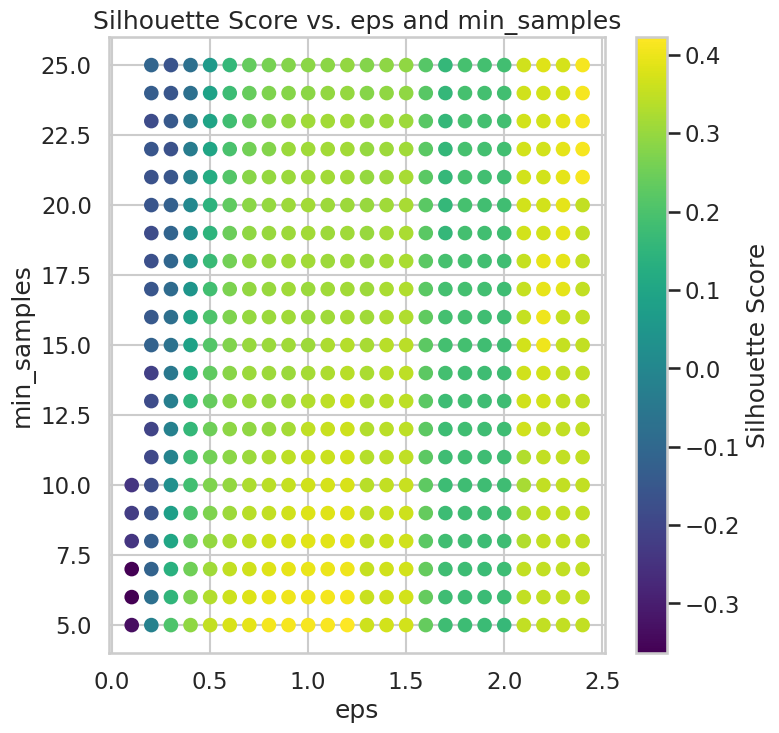

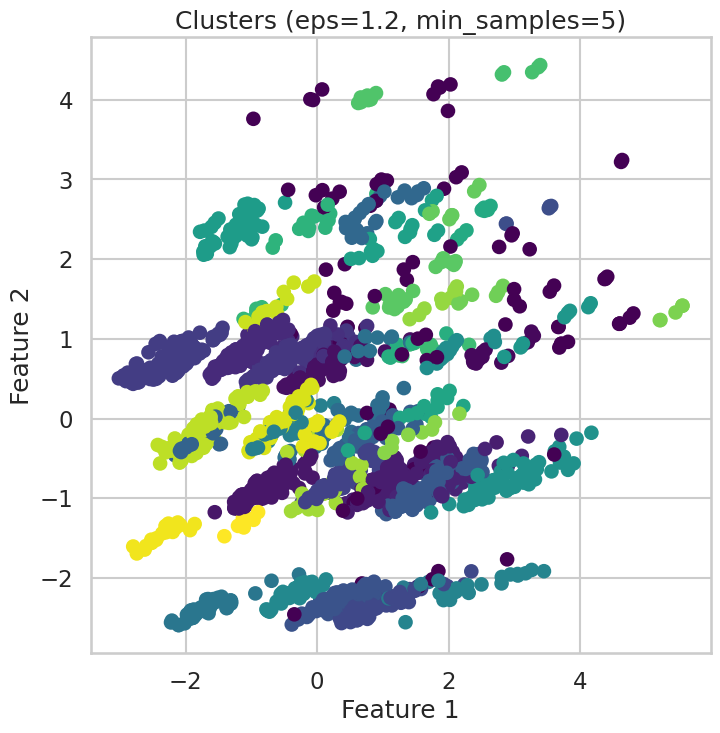

Best Silhouette Score: 0.4225606832617899
Best Parameters: eps: 1.2, min_samples: 5


In [81]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

def dbscan_clustering_analysis(data):
    # Normalize the data
    scaler = StandardScaler()
    data_normalized = scaler.fit_transform(data)

    # Set plot parameters
    plt.rcParams['figure.figsize'] = [15, 15]
    sns.set_style("whitegrid")
    sns.set_context("talk")

    # Function to display clusters
    def display_cluster(data, labels, title_suffix=''):
        if data.shape[0] != len(labels):
            print(f"Data shape: {data.shape}, Labels length: {len(labels)}")
            raise ValueError("Mismatch between number of data points and number of labels.")
        plt.figure(figsize=(8, 8))
        plt.scatter(data[:, 0], data[:, 1], c=labels, cmap='viridis', marker='o')
        plt.title(f'Clusters {title_suffix}')
        plt.xlabel('Feature 1')
        plt.ylabel('Feature 2')
        plt.grid(True)
        plt.show()

    # Parameters to try
    eps_values = np.linspace(0.1, 3, 30)
    min_samples_values = range(5, 26)

    best_silhouette_score = -1
    best_params = None
    sil_scores = []

    for eps in eps_values:
        for min_samples in min_samples_values:
            try:
                dbscan = DBSCAN(eps=eps, min_samples=min_samples)
                labels = dbscan.fit_predict(data_normalized)

                # Skip configurations that result in only one cluster or all points in the same cluster
                if len(set(labels)) <= 1 or len(set(labels)) == len(labels):
                    continue

                # Calculate silhouette score
                sil_score = silhouette_score(data_normalized, labels)
                sil_scores.append((eps, min_samples, sil_score))

                # Update best silhouette score and parameters
                if sil_score > best_silhouette_score:
                    best_silhouette_score = sil_score
                    best_params = (eps, min_samples)

                print(f"eps: {eps}, min_samples: {min_samples}, Silhouette Score: {sil_score}")

            except Exception as e:
                print(f"An error occurred for eps: {eps}, min_samples: {min_samples}. Error: {e}")

    # Plotting silhouette scores
    if sil_scores:
        eps_values_plot = [score[0] for score in sil_scores]
        min_samples_values_plot = [score[1] for score in sil_scores]
        sil_scores_values_plot = [score[2] for score in sil_scores]

        plt.figure(figsize=(8, 8))
        plt.scatter(eps_values_plot, min_samples_values_plot, c=sil_scores_values_plot, cmap='viridis')
        plt.colorbar(label='Silhouette Score')
        plt.title('Silhouette Score vs. eps and min_samples')
        plt.xlabel('eps')
        plt.ylabel('min_samples')
        plt.show()

    # Plot the clusters for the best parameters using PCA
    if best_params:
        best_eps, best_min_samples = best_params
        dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
        best_labels = dbscan.fit_predict(data_normalized)

        # PCA for visualization
        pca = PCA(n_components=2)
        pca_result = pca.fit_transform(data_normalized)

        display_cluster(pca_result, best_labels, title_suffix=f'(eps={best_eps}, min_samples={best_min_samples})')
        print(f"Best Silhouette Score: {best_silhouette_score}")
        print(f"Best Parameters: eps: {best_eps}, min_samples: {best_min_samples}")
    else:
        print("No valid clustering configuration was found.")

dbscan_clustering_analysis(X)

Agglomorative Hierarchial clustering

Affinity: euclidean, Linkage: average, Distance threshold: 1, Silhouette Score: 0.45541038734860173


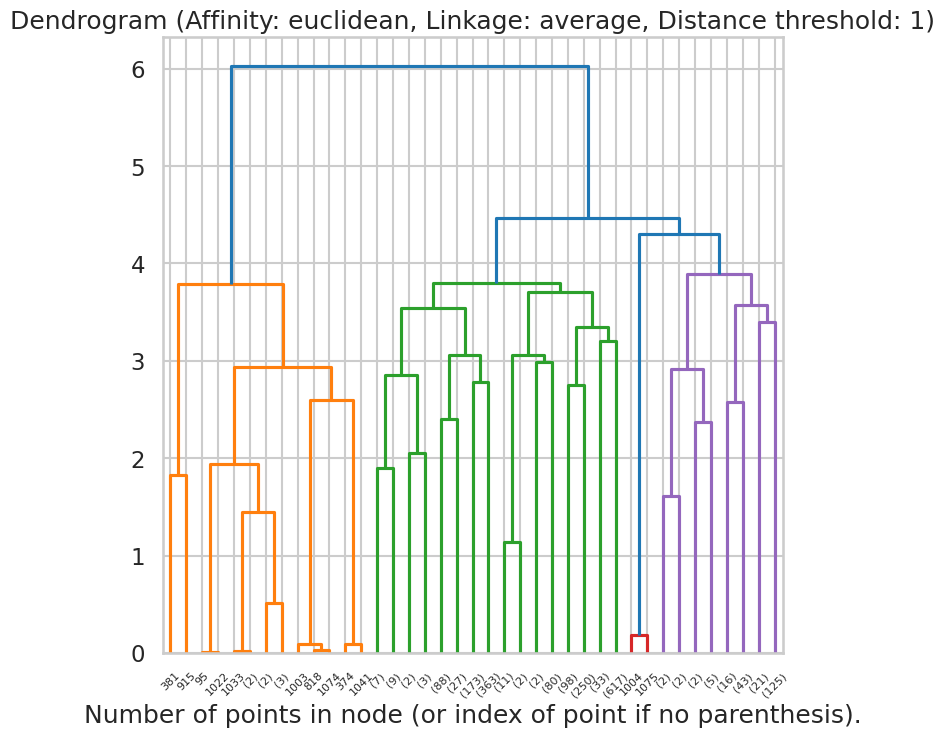

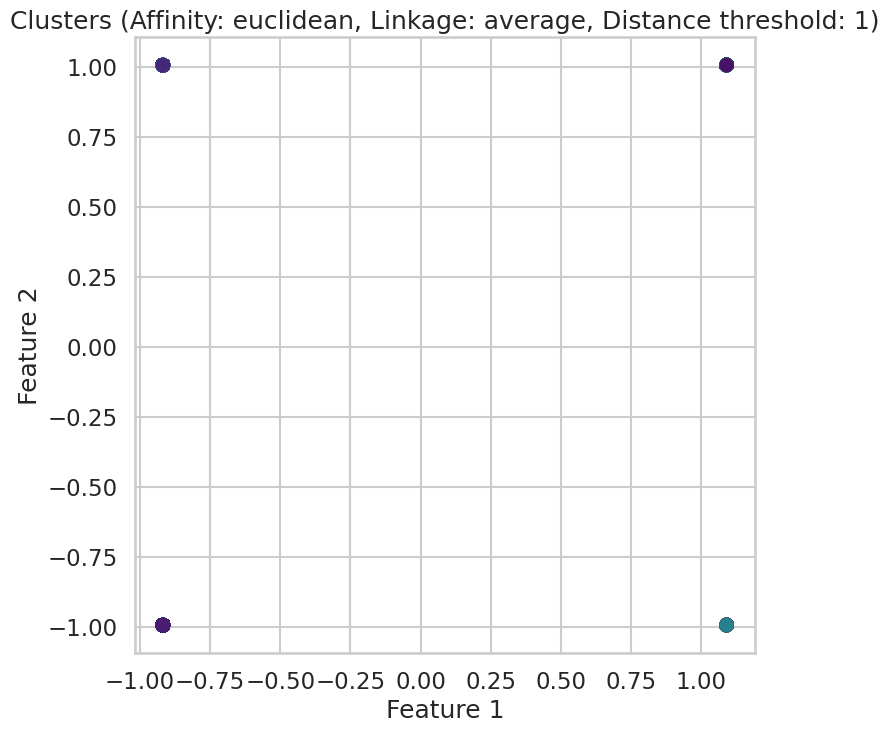

Affinity: euclidean, Linkage: average, Distance threshold: 3, Silhouette Score: 0.2340725238591466


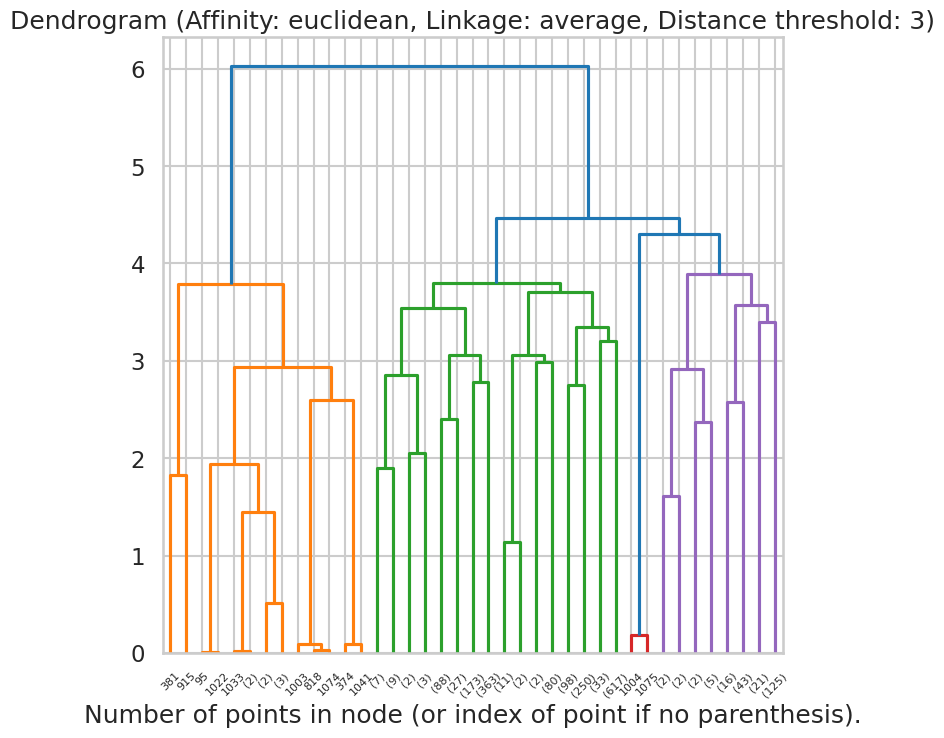

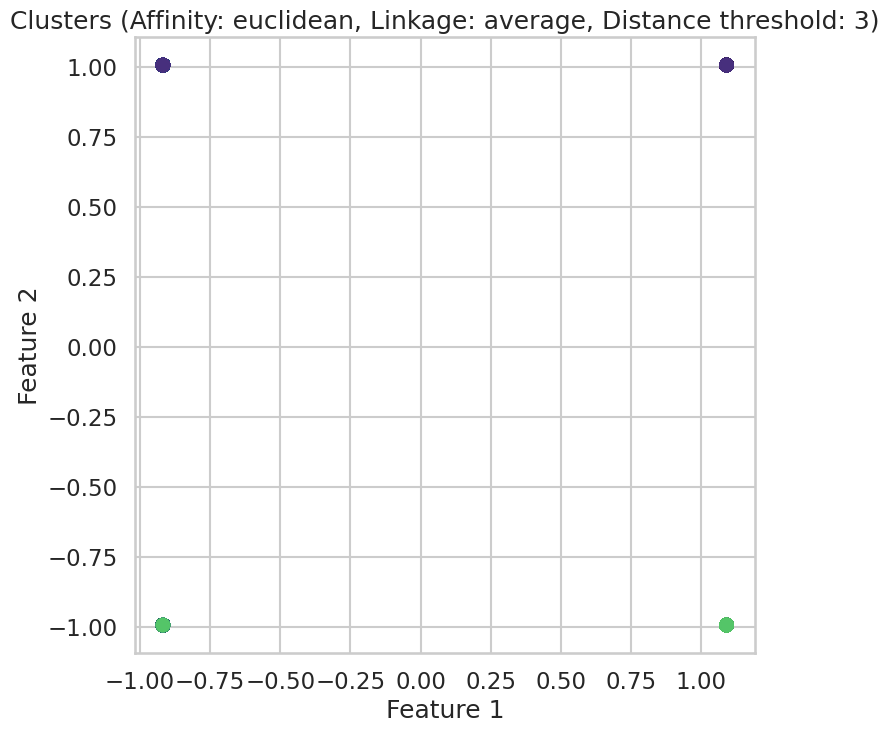

Affinity: euclidean, Linkage: average, Distance threshold: 5, Silhouette Score: 0.3969701495528368


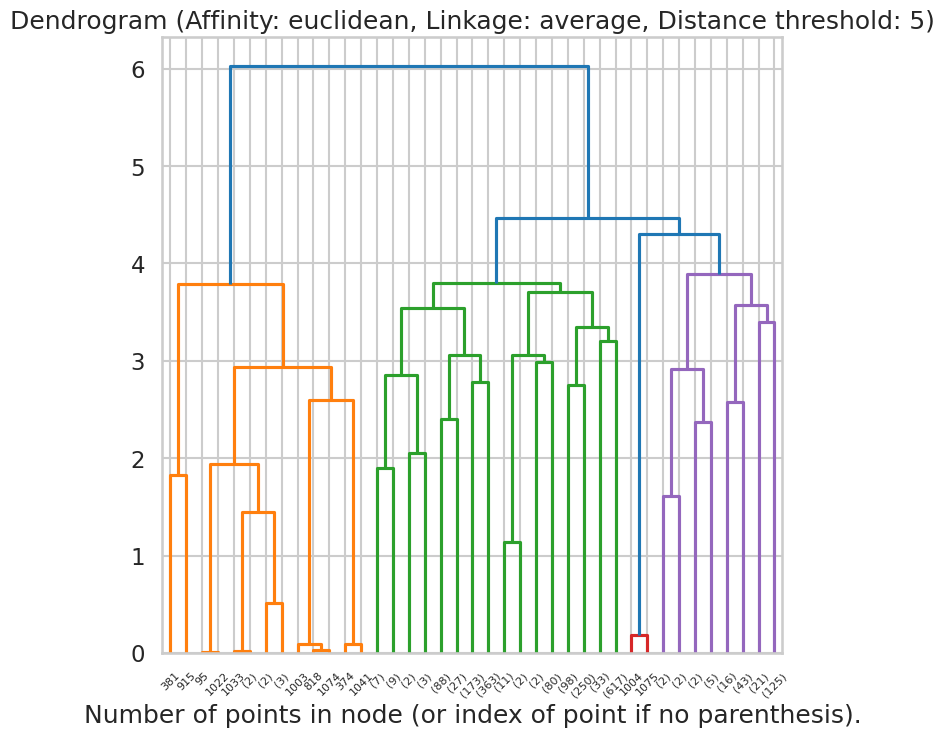

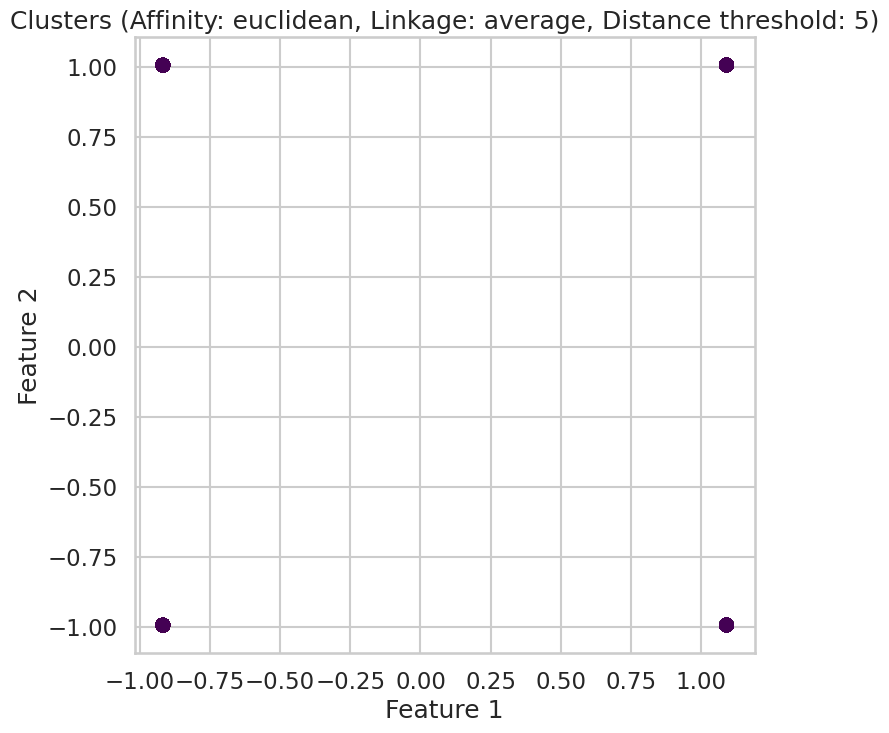

Affinity: euclidean, Linkage: single, Distance threshold: 1, Silhouette Score: 0.46595144206169825


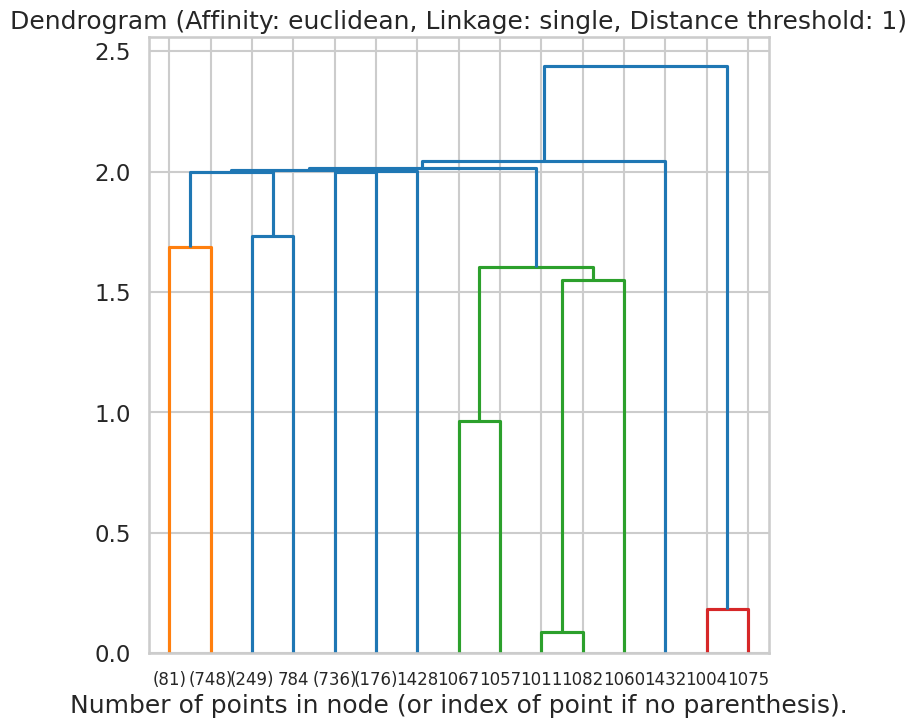

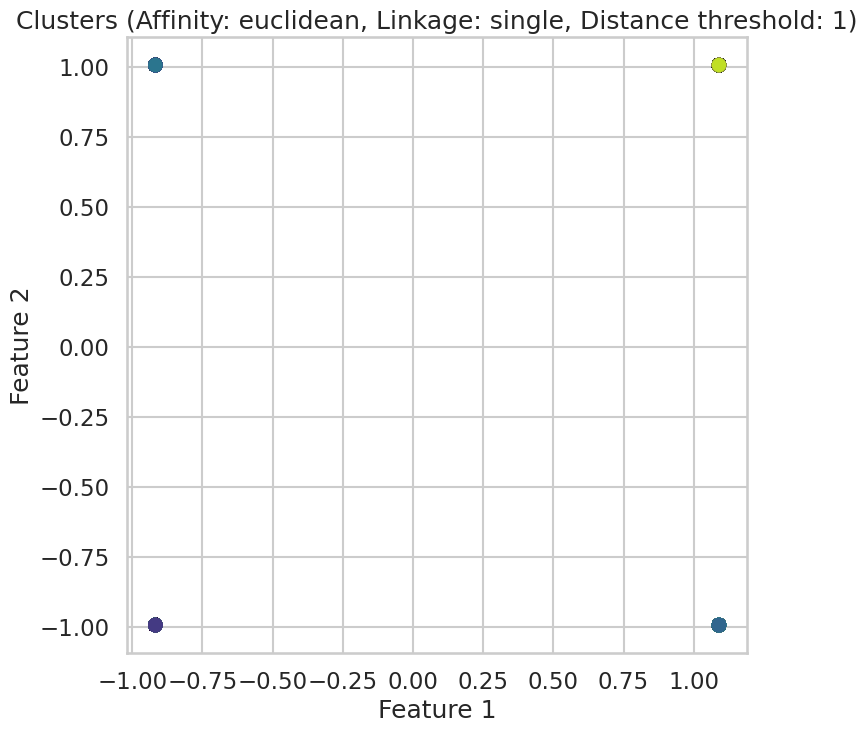

Invalid configuration for Affinity: euclidean, Linkage: single, Distance threshold: 3
Invalid configuration for Affinity: euclidean, Linkage: single, Distance threshold: 5
Affinity: manhattan, Linkage: average, Distance threshold: 1, Silhouette Score: 0.4561351928692121


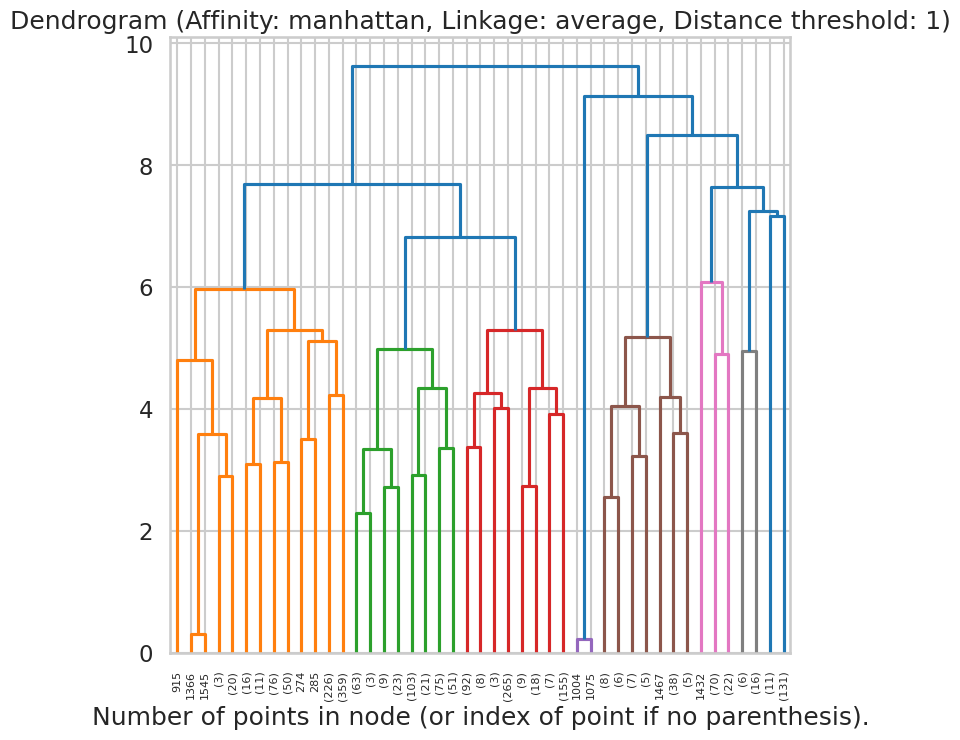

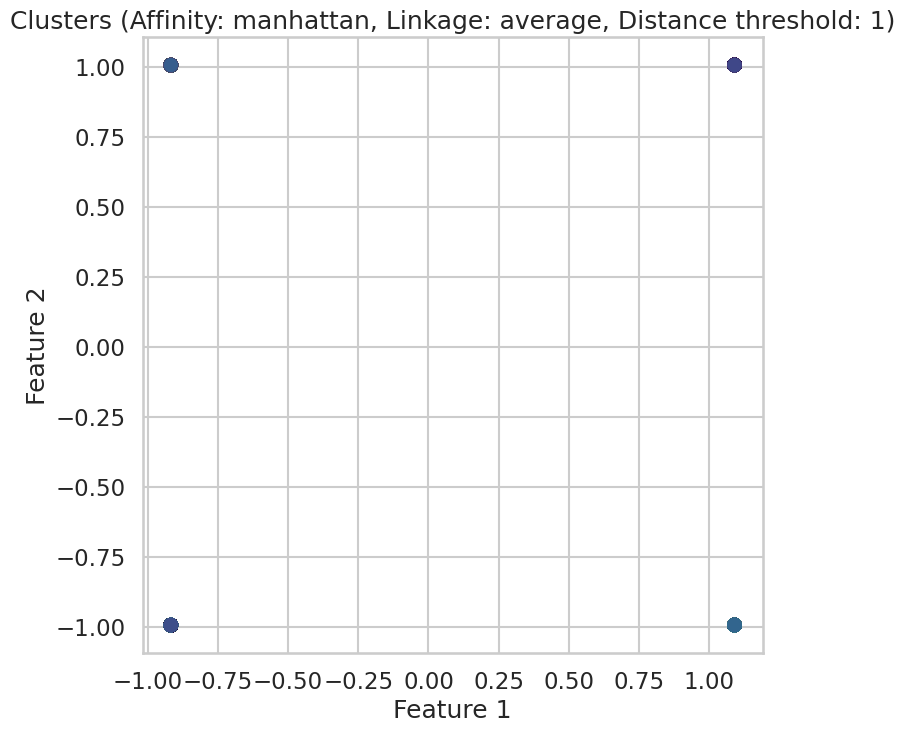

Affinity: manhattan, Linkage: average, Distance threshold: 3, Silhouette Score: 0.3757016111575259


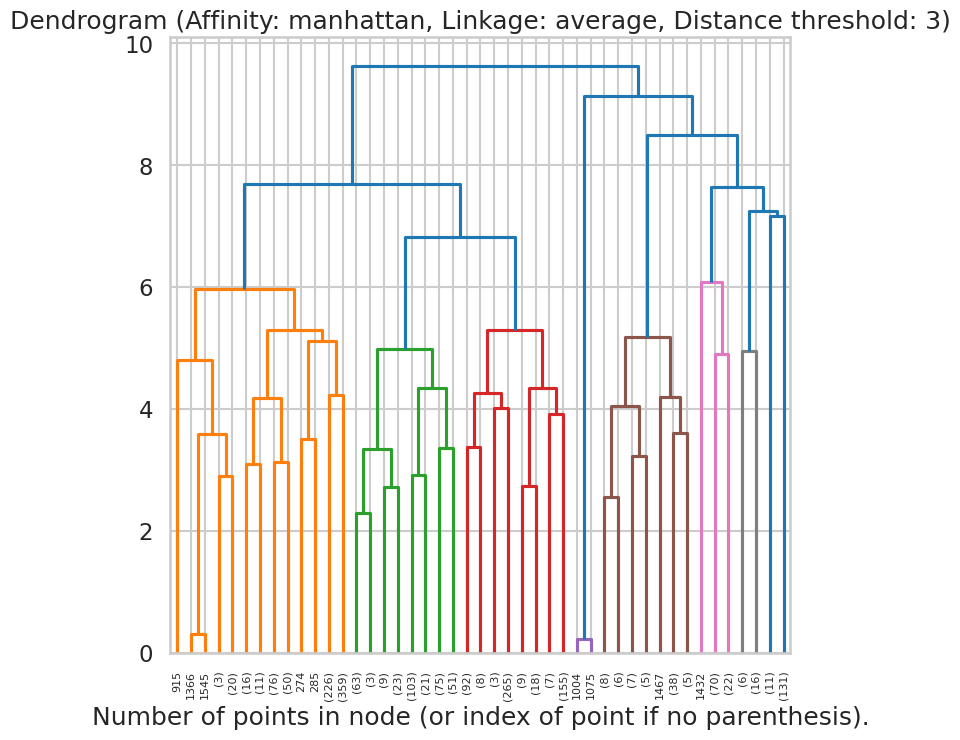

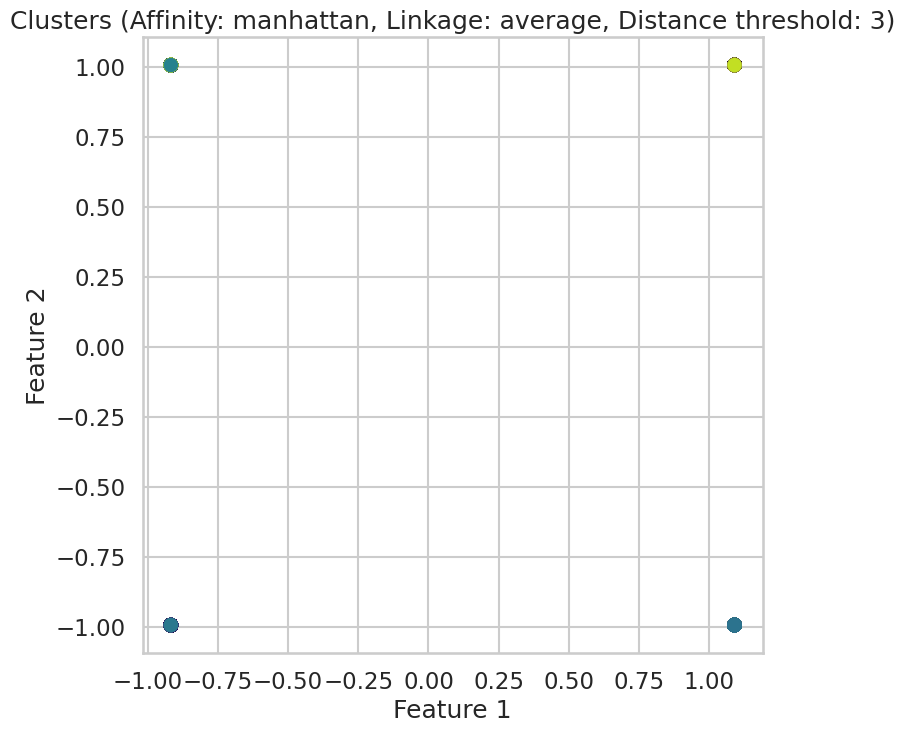

Affinity: manhattan, Linkage: average, Distance threshold: 5, Silhouette Score: 0.2745015311935332


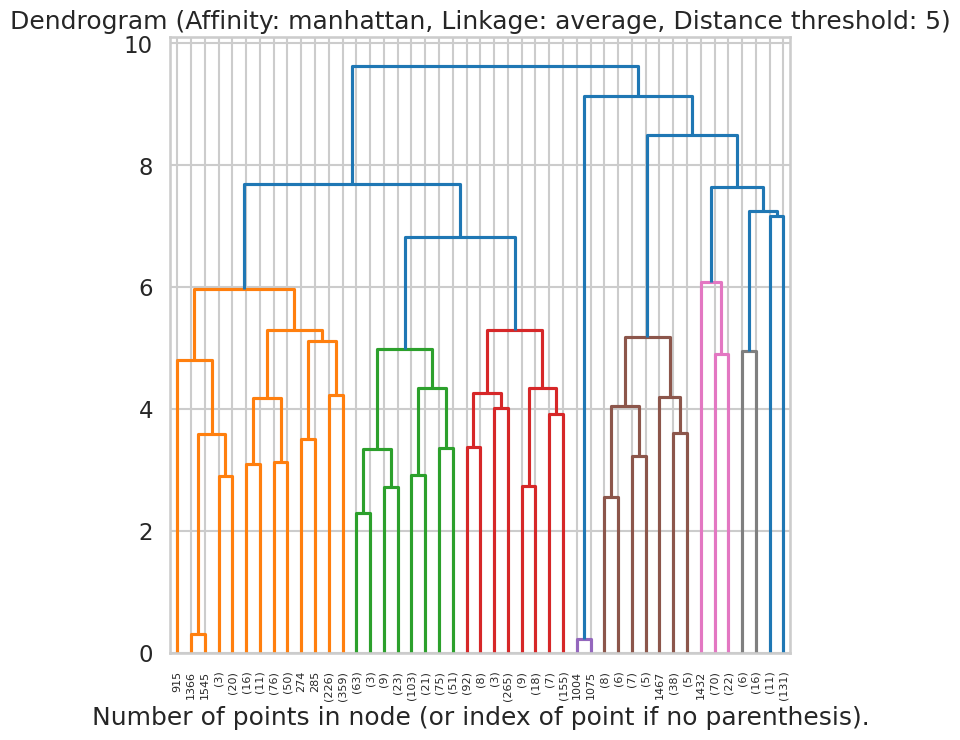

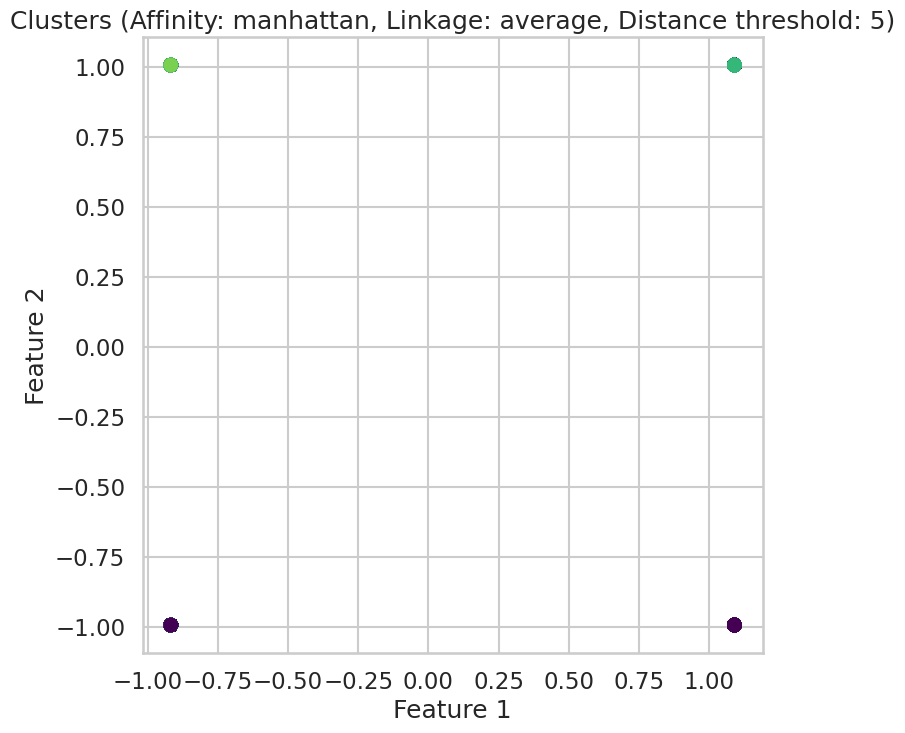

Affinity: manhattan, Linkage: single, Distance threshold: 1, Silhouette Score: 0.4694711880145699


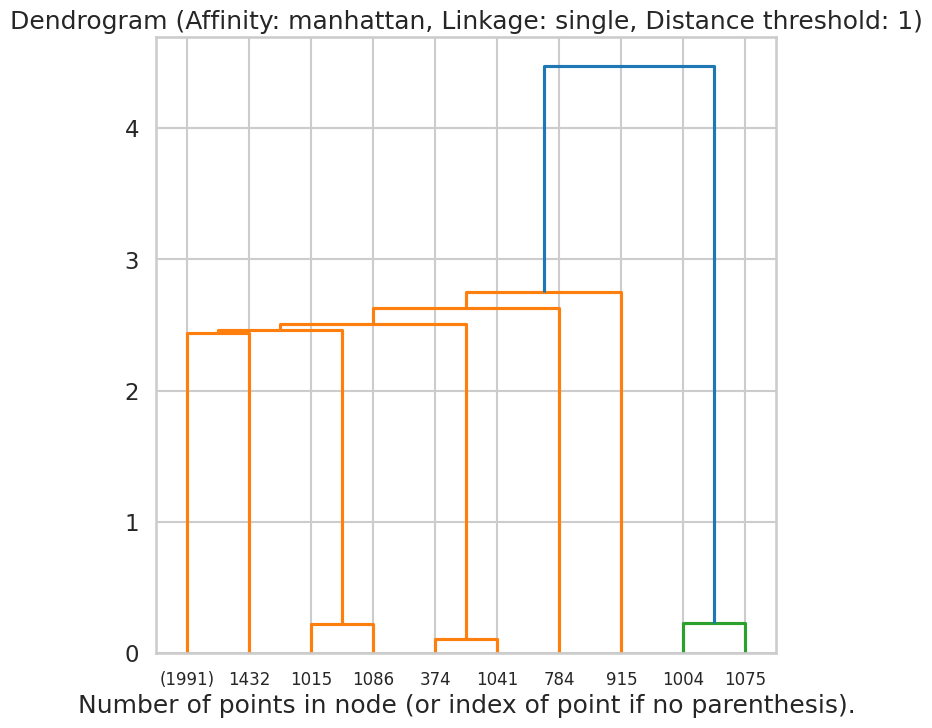

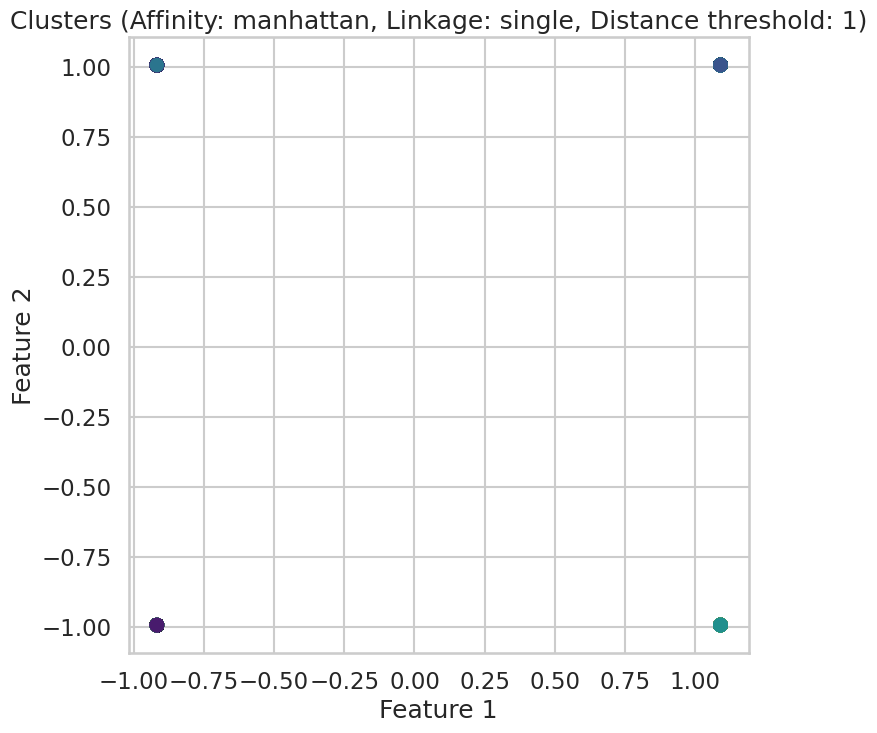

Affinity: manhattan, Linkage: single, Distance threshold: 3, Silhouette Score: 0.34916658225914216


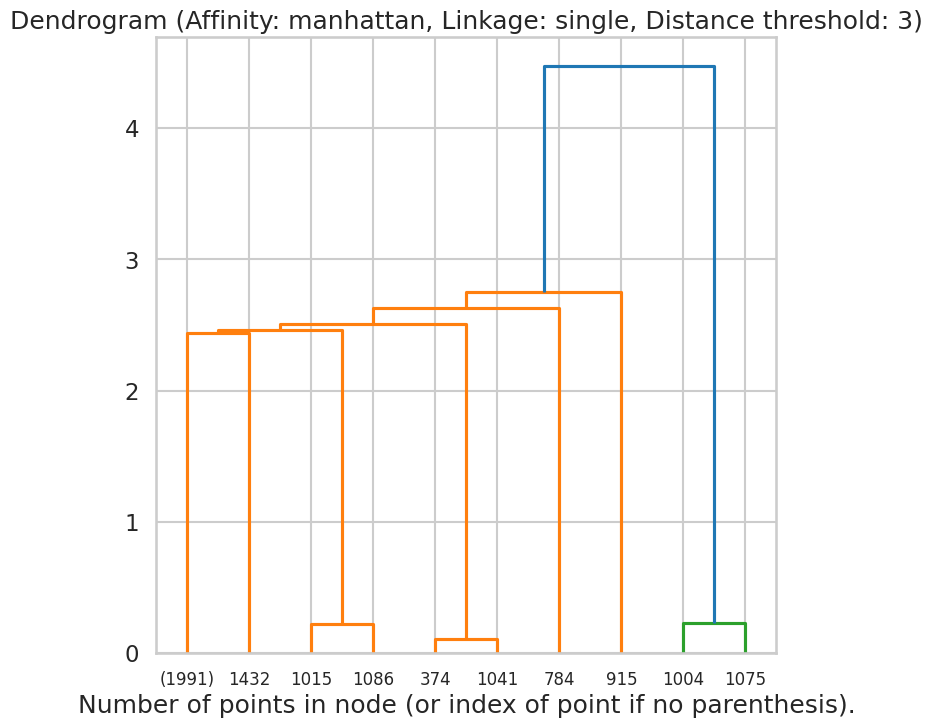

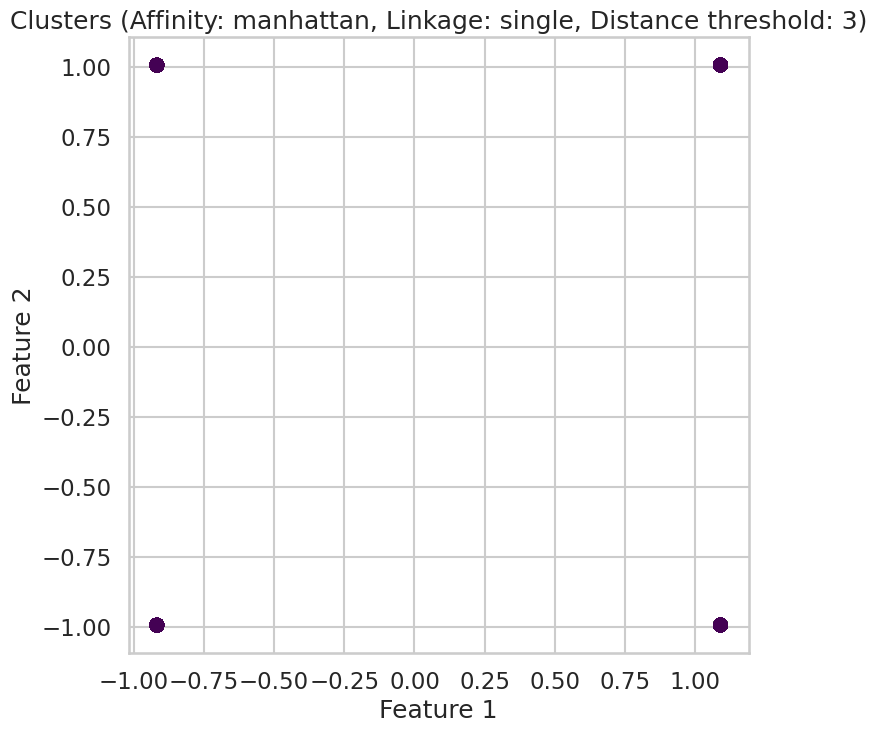

Invalid configuration for Affinity: manhattan, Linkage: single, Distance threshold: 5
Affinity: cosine, Linkage: average, Distance threshold: 1, Silhouette Score: 0.25731098431237265


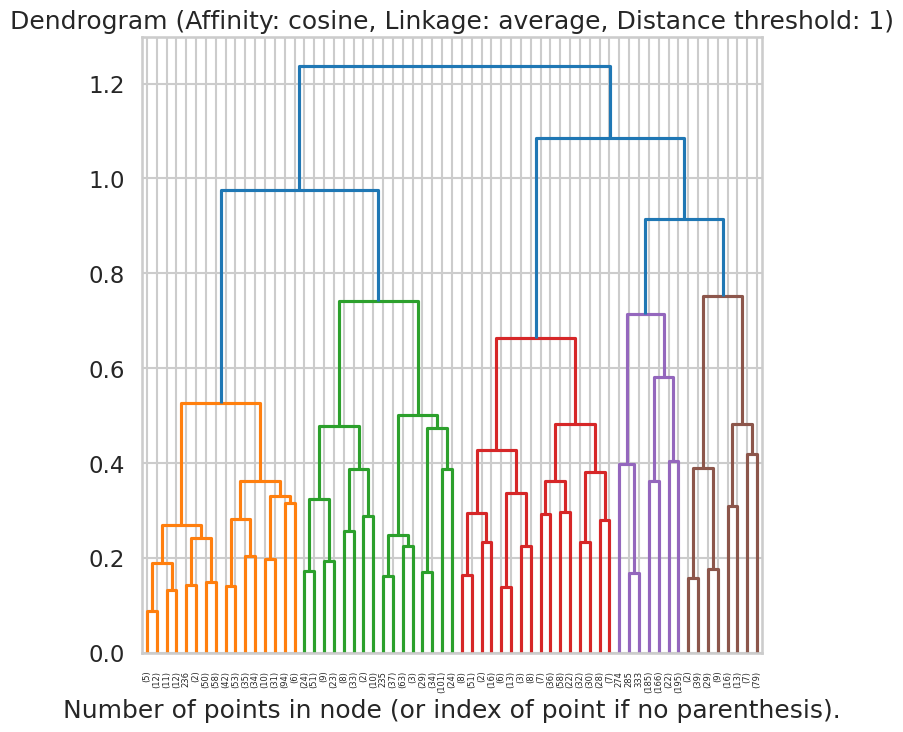

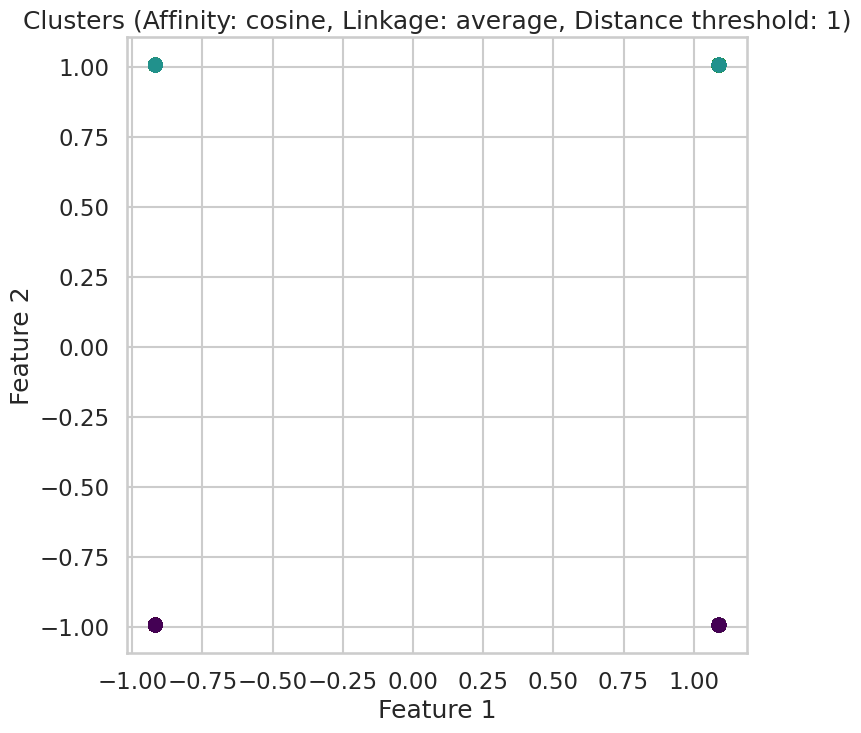

Invalid configuration for Affinity: cosine, Linkage: average, Distance threshold: 3
Invalid configuration for Affinity: cosine, Linkage: average, Distance threshold: 5
Invalid configuration for Affinity: cosine, Linkage: single, Distance threshold: 1
Invalid configuration for Affinity: cosine, Linkage: single, Distance threshold: 3
Invalid configuration for Affinity: cosine, Linkage: single, Distance threshold: 5
Best Silhouette Score: 0.4694711880145699
Best Parameters: Affinity: manhattan, Linkage: single, Distance threshold: 1


In [84]:
# Select all features except 'id'
df_new = df.drop(columns=['ID'])
scaler = StandardScaler()
X = scaler.fit_transform(df_new)
hierarchical_clustering_analysis(X)

Gausiian Mixture

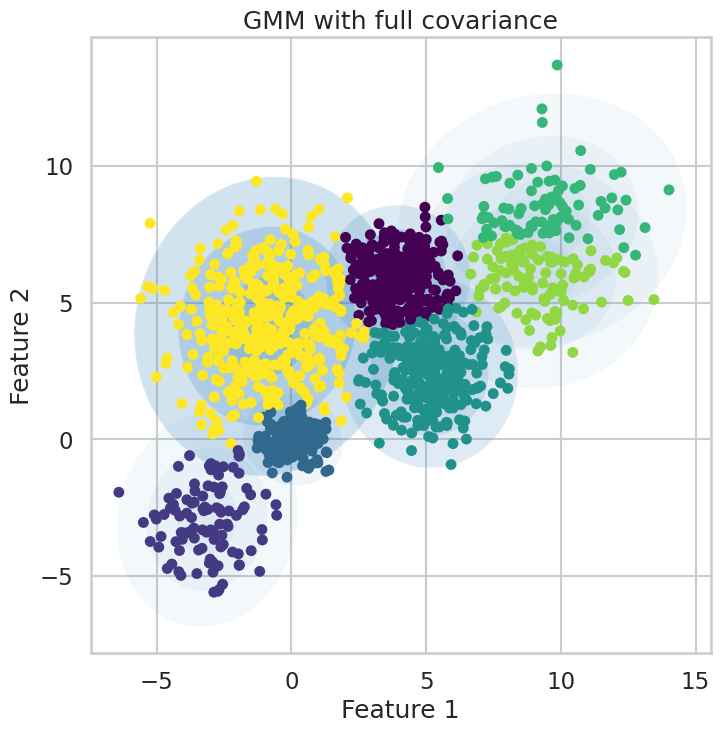

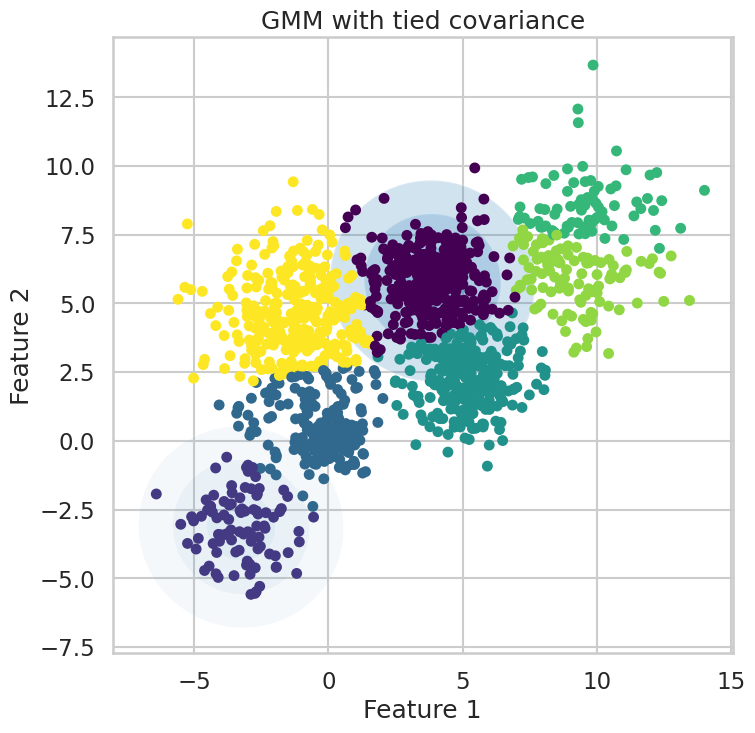

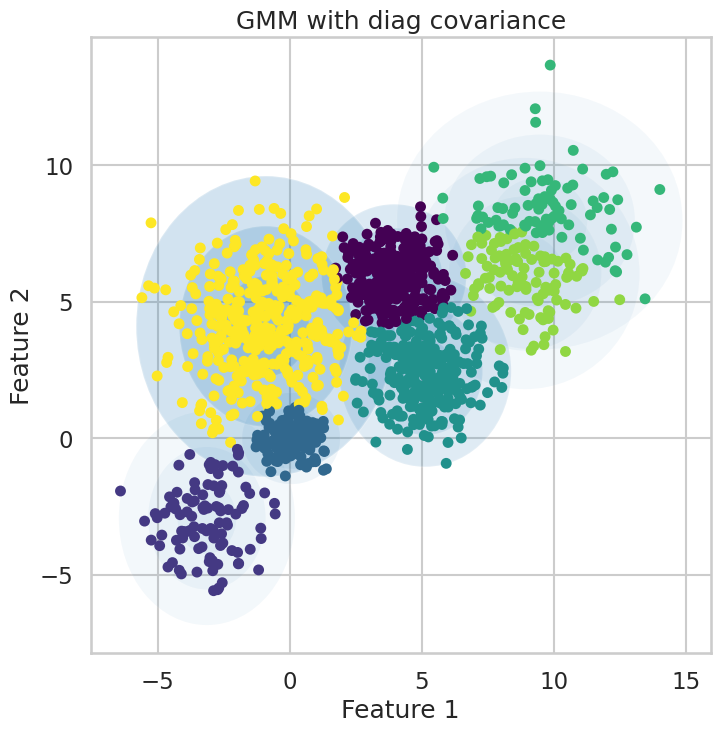

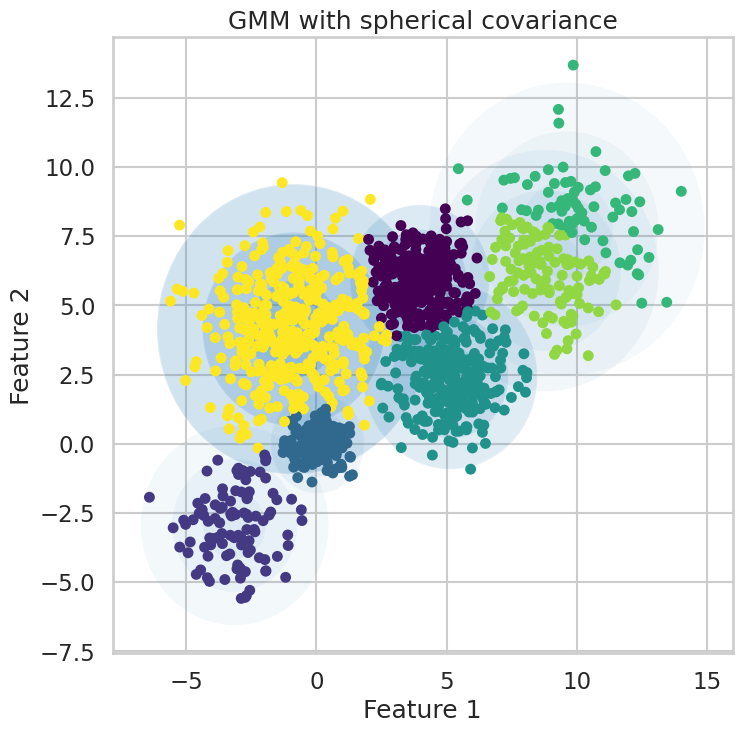

In [87]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
from matplotlib.patches import Ellipse

def plot_gmm(gmm, X, label=True, ax=None):
    if ax is None:
        ax = plt.gca()

    labels = gmm.fit_predict(X)
    if label:
        ax.scatter(X[:, 0], X[:, 1], c=labels, s=40, cmap='viridis', zorder=2)

    w_factor = 0.2 / gmm.weights_.max()
    for pos, covar, w in zip(gmm.means_, gmm.covariances_, gmm.weights_):
        if gmm.covariance_type == 'full':
            draw_ellipse(pos, covar, alpha=w * w_factor, ax=ax)
        elif gmm.covariance_type == 'tied':
            draw_ellipse(pos, gmm.covariances_, alpha=w * w_factor, ax=ax)
        elif gmm.covariance_type == 'diag':
            draw_ellipse(pos, np.diag(covar), alpha=w * w_factor, ax=ax)
        elif gmm.covariance_type == 'spherical':
            draw_ellipse(pos, np.eye(2) * covar, alpha=w * w_factor, ax=ax)

    ax.set_title(f'GMM with {gmm.covariance_type} covariance')
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')

def draw_ellipse(position, covariance, ax=None, **kwargs):
    """Draw an ellipse with a given position and covariance"""
    ax = ax or plt.gca()

    if covariance.shape == (2, 2):
        U, s, Vt = np.linalg.svd(covariance)
        angle = np.degrees(np.arctan2(U[1, 0], U[0, 0]))
        width, height = 2 * np.sqrt(s)
    else:
        angle = 0
        width, height = 2 * np.sqrt(covariance[:2])

    for nsig in range(1, 4):
        ax.add_patch(Ellipse(position, nsig * width, nsig * height, angle, **kwargs))

def fit_and_plot_gmm(data, n_components):
    covariance_types = ['full', 'tied', 'diag', 'spherical']

    for cov_type in covariance_types:
        gmm = GaussianMixture(n_components=n_components, covariance_type=cov_type, random_state=42)
        plt.figure(figsize=(8, 8))
        plot_gmm(gmm, data)
        plt.show()


fit_and_plot_gmm(X, n_components=7)
